# Preambule

In [1]:
%%capture
import matplotlib.pyplot as plt
import numpy as np
import cv2
try:
    cv2.setNumThreads(0)
except:
    print ("did not set the number of threads")
    pass
from caiman import movie
import os
%config InlineBackend.figure_format = 'retina'
from sys import path as syspath
syspath.append("/Users/srdjan/Documents/Physio_Ca/functions/")
from physio_def_1 import *
syspath.append("/Users/srdjan/Seafile/functions/")
from general_functions import autocorr
from matplotlib.colors import LogNorm
import pandas as pd
from itertools import product
from collections import OrderedDict
# from pandas import read_csv, to_numeric

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
from numeric import runningAverage, runningStd, percFilter, lowPass, getInterestingROIcenters
from matplotlib.colors import LogNorm
from collections import Counter

In [4]:
# expDir = "/Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_10_16/Experiment39a/"

In [5]:
protocol = pd.read_csv("/Users/srdjan/Downloads/Experiment_protocols - List 1(1).csv")

for col in ["pH","frequency","glucose"]:
    protocol[col+"_"] = pd.to_numeric(protocol[col],errors="coerce")

protocol.treatment = protocol.treatment.astype(str)

for col in ["mouse","sex"]:
    del protocol[col]

In [6]:
df = protocol.query("glucose_<=8 and resolution!='line scan'").copy()
df = df[["leica" in m.lower() for m in df.microscope]].copy()
for k in ["resolution","frequency","frequency_","magnification",
#           "treatment"
         ]:
    del df[k]

In [7]:
for ix,row in df.iterrows():
#     try:
        exp, ser = row.experiment.split("_")
        ser = ser.split()[0]
        serDir = f"/Volumes/physio/team/slakrupnik/project/experiments/Sandra/{row.date}/{exp}/"
        if os.path.isdir(serDir):
            fs = [f for f in os.listdir(serDir) if ser in f and "txt" in f]
            if len(fs)==0:
                print (f"could not find {ser} metadata file in {serDir}. Check manually if you need, I'll continue.")
                continue
            if len(fs)>1:
                raise ValueError(f" found two files that have the form indicating they contain metadata for {f}. Please sort out manually and restart parsing.")
            f = fs[0]
            add = pd.read_csv(serDir+f)
            for k in add.columns:
                df.loc[ix,k] = add[k][0]
            df.loc[ix,"filename"] = f.split(".")[0]
#     except:
#         pass

could not find Series061 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_10_15/Experiment38b/. Check manually if you need, I'll continue.
could not find Series004 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_13/Experiment42a/. Check manually if you need, I'll continue.
could not find Series006 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if you need, I'll continue.
could not find Series007 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if you need, I'll continue.
could not find Series008 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if you need, I'll continue.
could not find Series012 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if

In [8]:
df["Tmax"] = df["T"]/df.freq

tmpdf = df.query("freq>12")
tmpdf = tmpdf.sort_values("Tmax",ascending=False)
for k in ["Unnamed: 0","pxUnit","Slice number"]:
    try:
        del tmpdf[k]
    except:pass

In [9]:
tmpdf.query("microscope=='Leica upright'")

,date,experiment,microscope,pH,glucose,treatment,comments,pH_,glucose_,T,X,Y,freq,pxSize,filename,Tmax
212,2019_10_15,Experiment38a_Series040 250k time points,Leica upright,7.4,6,Caffeine 10 mM,NaN,7.4,6.0,256000.0,128.0,64.0,99.053494,2.099880,Experiment38a_18_Series040,2584.462095
204,2019_10_14,Experiment37_Series010,Leica upright,7.4,6,tolbutamide 50uM in 6 glucose at 11:12:019 swi...,NaN,7.4,6.0,114238.0,128.0,128.0,84.296675,1.936065,Experiment37_5_Series010,1355.189864
202,2019_10_14,Experiment37_Series006,Leica upright,7.4,6,Caffeine 10 mM,NaN,7.4,6.0,75650.0,128.0,128.0,84.282100,2.556042,Experiment37_2_Series006,897.580865
203,2019_10_14,Experiment37_Series007,Leica upright,7.4,6,nifedipine 200uM,NaN,7.4,6.0,61971.0,128.0,128.0,84.282309,2.556042,Experiment37_3_Series007,735.278863
207,2019_10_15,Experiment38a_Series016,Leica upright,7.4,8,nan,NaN,7.4,8.0,30304.0,128.0,128.0,84.310130,2.137757,Experiment38a_7_Series016,359.434861
236,2019_10_16,Experiment39a_Series034,Leica upright,7.7,8,nan,NaN,7.7,8.0,26626.0,128.0,128.0,84.299546,2.446350,Experiment39a_20_Series034,315.849862
228,2019_10_16,Experiment39a_Series022,Leica upright,7.1,8,nan,NaN,7.1,8.0,26300.0,128.0,128.0,84.278971,3.418688,Experiment39a_11_Series022,312.058866
232,2019_10_16,Experiment39a_Series029,Leica upright,7.4,8,nan,NaN,7.4,8.0,26122.0,128.0,128.0,84.300177,2.446350,Experiment39a_16_Series029,309.868863
217,2019_10_15,Experiment38b_Series043,Leica upright,7.1,8,nan,NaN,7.1,8.0,25895.0,128.0,128.0,84.273357,3.418688,Experiment38b_13_Series043,307.273865
219,2019_10_15,Experiment38b_Series045,Leica upright,7.7,8,nan,NaN,7.7,8.0,25619.0,128.0,128.0,84.275004,3.418688,Experiment38b_15_Series045,303.992865


In [10]:
# row = tmpdf.iloc[0]
# row = tmpdf.loc[207]   # no waves
row = tmpdf.loc[212]
# row = tmpdf.loc[186] # waves
# row = tmpdf.loc[177] # waves
# row = tmpdf.loc[189] # waves
# row = tmpdf.loc[]

pd.DataFrame(row).T

,date,experiment,microscope,pH,glucose,treatment,comments,pH_,glucose_,T,X,Y,freq,pxSize,filename,Tmax
212,2019_10_15,Experiment38a_Series040 250k time points,Leica upright,7.4,6,Caffeine 10 mM,NaN,7.4,6,256000,128,64,99.0535,2.09988,Experiment38a_18_Series040,2584.46


# Importing

In [11]:
npzFile = f"/Volumes/physio/team/slakrupnik/project/experiments/Sandra/{row.date}/{row.filename.split('_')[0]}/{row.filename}.npz"
# npzFile = "/Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43bSlice5/Experiment43bSlice5_1_Series038.npz"
metadata = pd.read_csv(npzFile.replace("npz","txt")).loc[0]
metadata

T          256000
X             128
Y              64
freq      99.0535
pxSize    2.09988
pxUnit         µm
Name: 0, dtype: object

In [12]:
metadata["T"]/metadata.freq/60

43.0743682536561

In [13]:
npzData = np.load(npzFile)
orig_images = npzData["data"]
time = npzData["time"]
m_orig = movie(orig_images)
# m_orig = m_orig.astype(float)
m_orig.fr = metadata.freq
print (time.max()/60)
allTrace = m_orig.mean((1,2))
Nsatur = np.sum(m_orig>m_orig.max()-1, axis=(1,2))

43.07419999440511


In [18]:
del orig_images

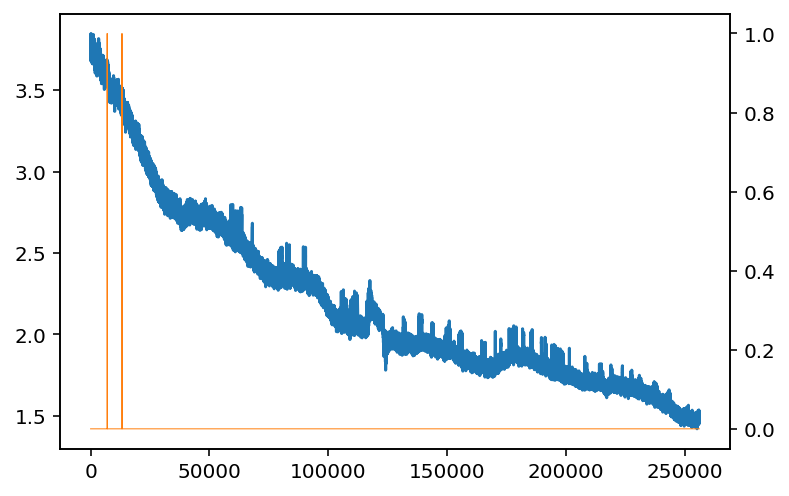

In [14]:
plt.plot(allTrace)
plt.twinx()
plt.plot(Nsatur,"C1",lw=.5)

In [15]:
row.treatment

'Caffeine 10 mM'

In [47]:
# check if there are waves
m_orig[:1000].play(fr=80, magnification=4)

In [48]:
# check if there are waves in the back
m_orig[-1000:].play(fr=80, magnification=4)

# average to save time and memory, especially if there are waves

In [16]:
newFreq = 50
tWin = int(np.ceil(m_orig.fr/newFreq))
newFreq = m_orig.fr/tWin
print (f"new Freq: {newFreq:.1f}Hz\ntWin: {tWin}")
print("New period will be %.1fms"%(1000./newFreq))

new Freq: 49.5Hz
tWin: 2
New period will be 20.2ms


In [17]:
m_resized = m_orig.resize(1,1,newFreq/m_orig.fr)*tWin

In [58]:
m_resized[:2000].play(fr=40,magnification=4)

In [46]:
# m_resized[::-1].play(fr=40,magnification=4)

In [19]:
m_orig = m_resized.copy()
del m_resized

In [49]:
# m_orig = m_orig[-len(m_orig)//2:]

In [48]:
# m_orig.play(fr=400,magnification=2)

# First look and first stats

In [20]:
n = 100
meanImg = m_orig[::n].mean(0)
stdImg  = m_orig[::n].std (0)

In [21]:
%%capture
n = 30
cc = m_orig[::n].local_correlations(eight_neighbours=True,swap_dim=False)

In [22]:
tmp = cv2.GaussianBlur(stdImg,(5,5),.7)
# plt.imshow(tmp)

roiCenters = getInterestingROIcenters(
    tmp,
    Nsample=10000,
    exponent=10,
    bandwidth=int(20/metadata.pxSize),
    n_jobs=6,
)
# plt.plot(*roiCenters,ls="none",marker="o", mfc="none",c="C1")

In [23]:
time = np.arange(len(m_orig))/m_orig.fr

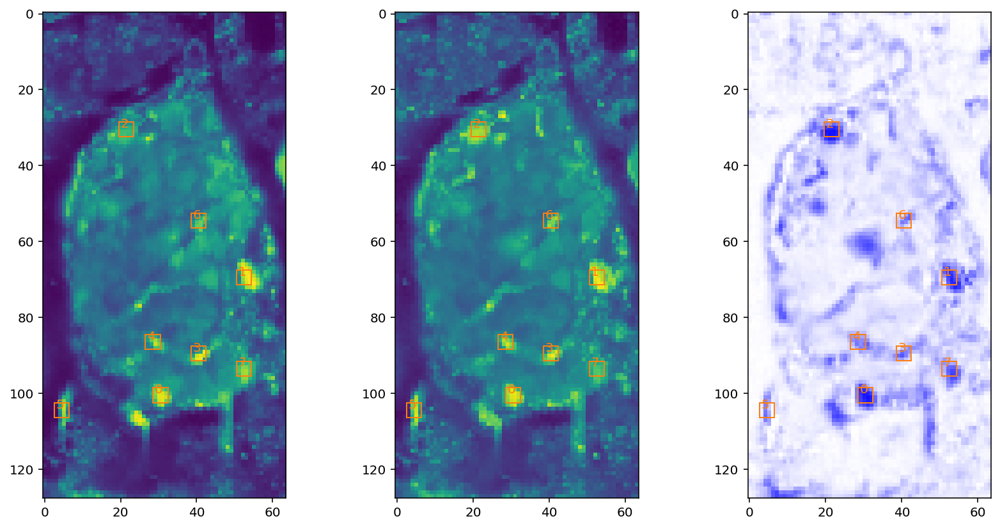

In [24]:
# fig, axs = plt.subplots(1,3,figsize=(14,5))
fig, axs = plt.subplots(1,3,figsize=(14,7))
axs[0].imshow(1+meanImg.T, norm=LogNorm())
axs[1].imshow(stdImg.T, norm=LogNorm())
try:
    axs[2].imshow(cc.T, cmap="bwr_r", vmin=-1,vmax=1)
except: pass

pxWin = 4
pxOrigins = np.round(roiCenters[::-1]-pxWin/2).astype(int)
pxOrigins[0] = np.clip(pxOrigins[0],0,metadata.Y-pxWin)
pxOrigins[1] = np.clip(pxOrigins[1],0,metadata.X-pxWin)
pxOrigins = pxOrigins.T

iis = np.argsort([stdImg[x:x+pxWin,y:y+pxWin].mean() for x,y in pxOrigins])[::-1]
pxOrigins = pxOrigins[iis][:8]
for ax in axs:
    addRoisToImage(pxOrigins,pxWin,label=True,ax=ax)

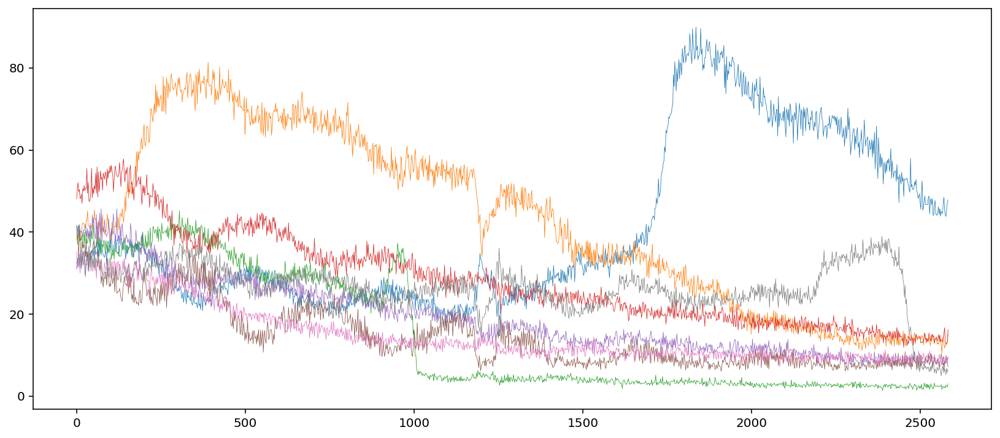

In [26]:
n = 100
roiTraces = getRoiProfiles(pxOrigins,pxWin,image_=m_orig[::n])

plt.figure(figsize=(14,6))
# plt.figure(figsize=(10,4))
for roi in roiTraces:
    x = roiTraces[roi]
    plt.plot(time[::n],x, lw=.4)
#     plt.plot(x, lw=.4)

(0, 17.128548708475176)

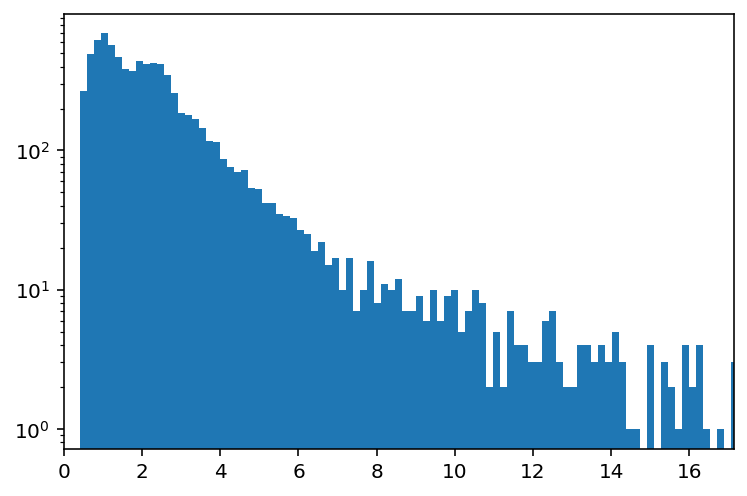

In [27]:
plt.hist(stdImg.flatten(),200, log=True);
plt.xlim(0,np.percentile(stdImg,99))

In [28]:
m_orig.play(magnification = 4)

# Separate into slow and fast component (filtered and diff-movie)

### figure out the parameters

#### should I blur?

In [49]:
# n,s = 3,.35
# z = np.zeros((5,5))
# z[len(z)//2,len(z)//2] = 1
# zb  = cv2.GaussianBlur(z,ksize=(n,n),sigmaX=s,sigmaY=s)
# zb1 = cv2.GaussianBlur(z,ksize=(n,1),sigmaX=s,sigmaY=s)
# with np.printoptions(precision=3, suppress=True):
#     print (zb)
#     print (zb1)


In [50]:
# with np.printoptions(precision=4, suppress=True):
#     print (cv2.getGaussianKernel(3,.35)*100)

In [51]:
# m_blurred = m_orig.copy()
# # m_blurred = np.zeros((10,5,5))
# # m_blurred[4,3,3] = 1
# # blur in time
# nt,st = 3, .4
# m_blurred = movie(cv2.GaussianBlur(
#     m_blurred.reshape((len(m_blurred),-1)),ksize=(nt,1),sigmaX=st, sigmaY=0
# ).reshape(m_blurred.shape))
# # # blur in space
# m_blurred.gaussian_blur_2D(n,n,s,s);


In [52]:
# i,j = 2,11
# for x in [m_orig[:,i,j],m_blurred[:,i,j]]:
#     plt.plot(sorted(x),np.linspace(0,1,len(x)))

In [70]:
# movie(np.concatenate([
#     m_orig,
#     np.ones_like(m_orig[:,:2,:])*m_orig.max(),
#     m_blurred,ii
# ],axis=1)).play(magnification=3, fr=100)

#### continue

In [39]:
# dt = .333
ironScale = 1
wIron = int(ironScale*m_orig.fr)
if wIron%2==0:
    wIron += 1

print(wIron)

filterPars = (wIron,wIron,50,1)

49


In [40]:
%%capture
lowPass(x,*filterPars)

In [31]:
%matplotlib notebook

In [32]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

<IPython.core.display.Javascript object>


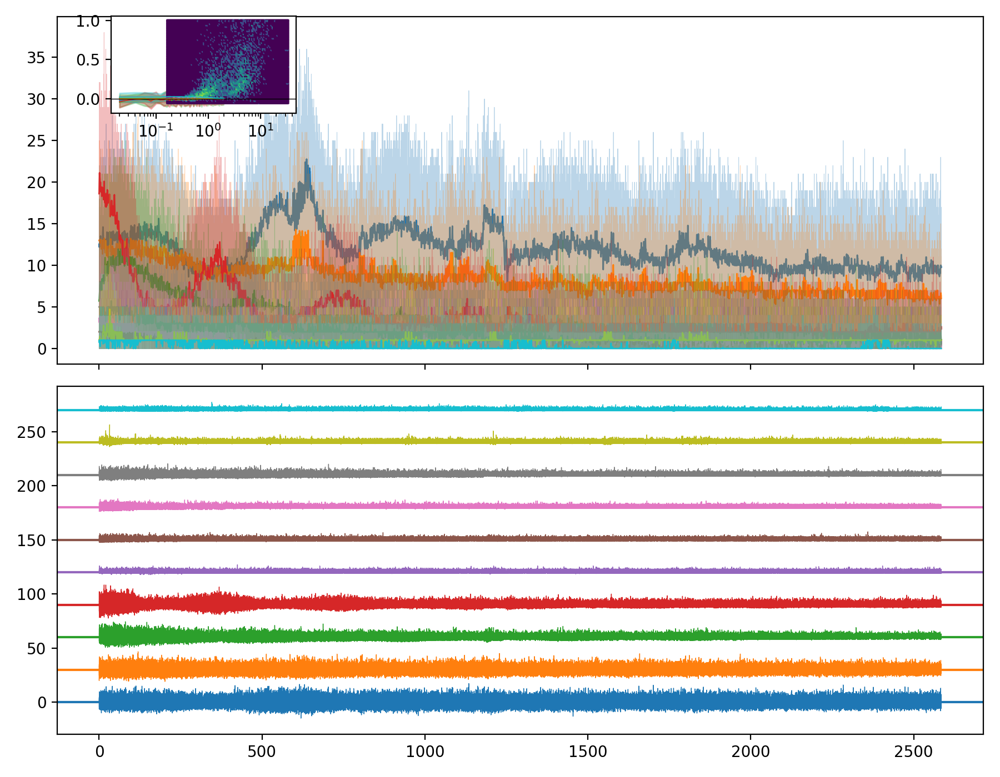

/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/ipykernel_launcher.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


In [41]:
# %%capture
tr = np.arange(1,int(2*m_orig.fr)+1)
plt.close()
fig, axs = plt.subplots(2,1,figsize=(9,7), sharex=True)
# axin = inset_axes(axs[0], width="30%", height="30%", loc=2)
axin = inset_axes(axs[0],
                  width="100%", height="100%",
                  loc=3,
        bbox_to_anchor=(.05, .7, .2, .28),
       bbox_transform=axs[0].transAxes)
ia = 0
for roi in range(10):
    c = "C%i"%roi
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = m_orig[:,i,j]
#     if np.diff(np.percentile(x,[1,99]))[0]<20: continue
    axs[0].plot(time,x,c=c,lw=.4,alpha = .3)
    xf = lowPass(x,*filterPars)
    axs[0].plot(time,xf,label=roi,c=c,lw=1)
    yoffset = 30*ia
    dx = x-xf
    axs[1].plot(time,dx+yoffset,label=roi,c=c,lw=.5)
    axs[1].axhline(yoffset,color=c)
    y, ye = autocorr(dx,tr, nsplits=20)
    axin.plot(tr/m_orig.fr,y,c=c,lw=.6)
    axin.fill_between(tr/m_orig.fr,y-2*ye,y+2*ye,color=c,alpha = .3)
    xs = np.minimum(xf**.5,1)
    axs[1].plot(time, yoffset+3*xs,c=c,lw=.5)
    ia += 1
axin.axhline(0,lw=.5,color="k")
fig.tight_layout()

In [103]:
m_orig.play(magnification=4,fr=200,q_max=99)

### filter

In [38]:
len(time)

128000

In [47]:
ts = slice(None)

In [48]:
m_50 = np.nan*np.ones_like(m_orig[ts],dtype=np.float32)

In [44]:
from numba import jit#, prange

@jit
def filterMovie(original_,filterF_,filterPars_):
    t,x,y = original_.shape
    original_ = original_.astype(np.float32)
    out = np.nan*np.ones_like(original_,dtype=np.float32)
    for i in range(x):
        # for j in prange(y):
        for j in range(y):
            out[:,i,j] = filterF_(original_[:,i,j],*filterPars_)
    return out

In [49]:
%%capture
m_50 = filterMovie(m_orig[ts],lowPass,filterPars)

In [50]:
# m_15 = filterMovie(dMovie,lowPass,(wIron,wIron,15.73,1))
# m_s = -m_15
m_s = np.maximum(1,m_50**.5)

In [51]:
dMovie = m_orig[ts]-m_50

In [53]:
%matplotlib inline

In [55]:
# x,y = meanImg.flatten(),stdImg.flatten()-meanImg.flatten()**.5
# x = x[y<1]
# y = y[y<1]
# x = x[y>-1]
# y = y[y>-1]
# plt.hexbin(x,y,xscale="log",norm=LogNorm())
# # plt.xscale("log")
# # plt.ylim(-2,2)

In [63]:
m_50[::100].play(magnification = 4, plot_text=True, do_loop=True, fr=100,q_max=99)

### account for bleaching (separate debleached)

In [64]:
from numeric import decay, decayfit, guessDecayPars

In [65]:
filtMedian = np.median(m_50,(1,2))

filtMean = m_50.mean((1,2))

plt.plot(filtMean, filtMedian, ".",ms=1)

/Users/srdjan/Documents/Physio_Ca/functions/numeric.py:14: RuntimeWarning: divide by zero encountered in log
  y  = np.log(y-b0)
/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/numpy/lib/function_base.py:1273: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


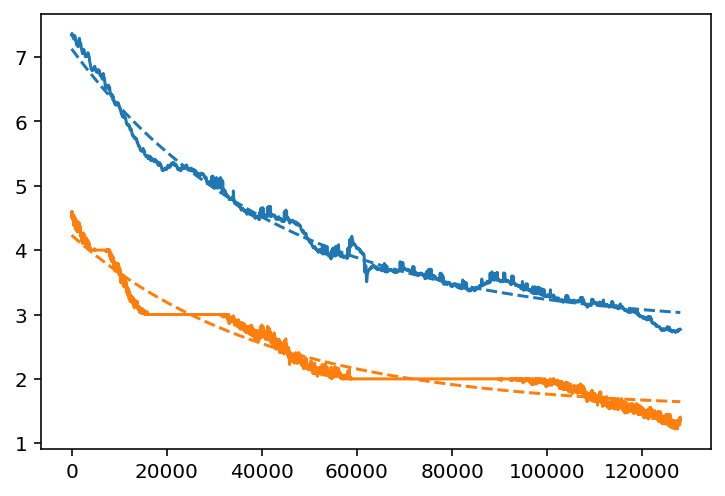

In [68]:
for x in [filtMean,filtMedian]:
    c = plt.plot(x)[0].get_color()
    plt.plot(decayfit(x),"--",c=c)

In [82]:
# plt.plot(decayfit(filtMean)-decayfit(filtMedian),"-")

In [ ]:
decFit = decayfit(filtMedian)
decFit = decFit/np.linalg.norm(decFit)

In [ ]:
# x = filteredMovie[:,10,100]
# w = x.dot(decFit)#/np.linalg.norm(decFit)**2
# plt.plot(x)
# plt.plot(w*decFit)

In [70]:
bleachingMovie = np.zeros_like(m_50)
for i,j in product(range(meanImg.shape[0]),range(meanImg.shape[1])):
    bleachingMovie[:,i,j] = m_50[:,i,j].dot(decFit) * decFit

In [78]:
bleachingMovie[::100].play(fr=100,magnification=3,do_loop=True)

In [77]:
debleachedMovie = m_50-bleachingMovie

In [84]:
# debleachedMovie[50000:70000:10].play(fr=200,magnification=3,do_loop=True, plot_text=True)
m_orig[50000:70000:10].play(fr=300,magnification=3,do_loop=True, plot_text=True, q_max=99)

#### Inestigate debleached and the other

In [842]:
# debleachedMovie[::10].play(fr=100,magnification=3,do_loop=True)

In [843]:
tmp = movie(np.zeros(debleachedMovie.shape+(3,)))

In [844]:
tmp[:,:,:,0] = np.maximum(0,-debleachedMovie)
# tmp[:,:,:,1] = debleachedMovie.max()
tmp[:,:,:,2] = np.maximum(0, debleachedMovie)

In [845]:
tmp[::5].play(fr=500, magnification=4,do_loop=True)

In [827]:
debleachedMovie[::10].play(fr=400,magnification=4,do_loop=True)

In [850]:
from collections import OrderedDict

In [ ]:
n = 5
cc = OrderedDict()

In [855]:
for s in [.1,.2,.3,.4,.5,.6,.7,.8]:
    if s in cc: continue
    cc[s] = movie(cv2.GaussianBlur(debleachedMovie, (n, n), s,s)).local_correlations(1,0)

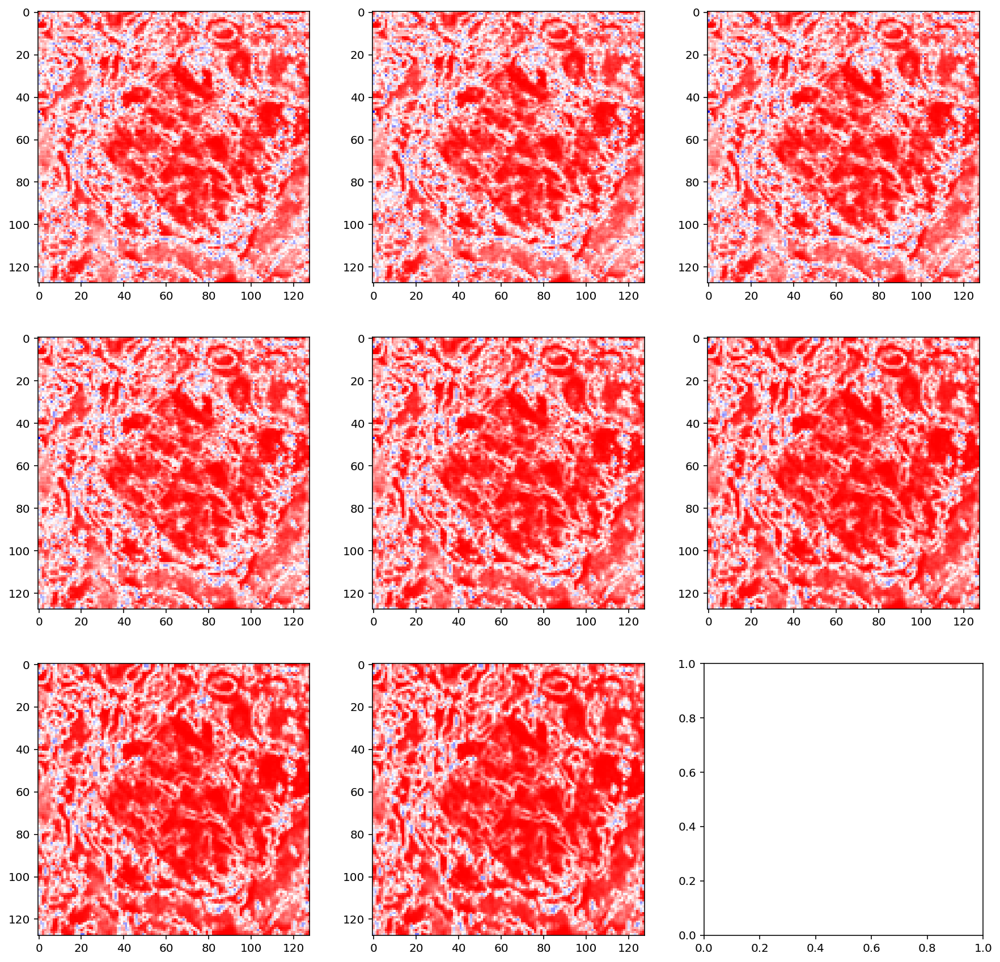

In [901]:
fig, axs = plt.subplots(3,3, figsize=(15,15))
for ax,k in zip(axs.flat,sorted(cc)):
    ax.imshow(cc[k],cmap="bwr",vmin=-1,vmax=1)

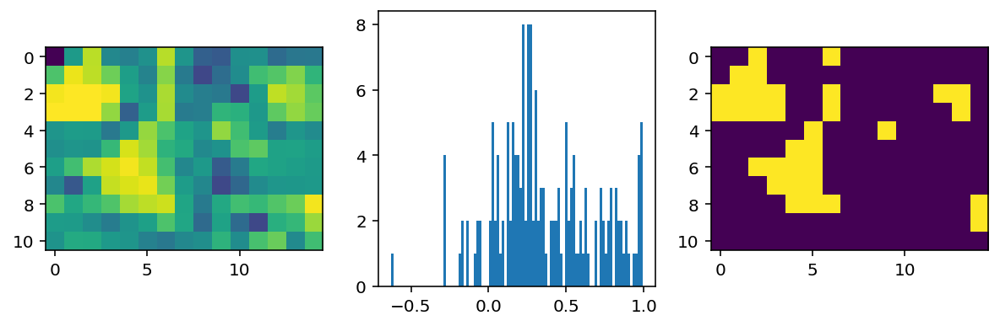

In [902]:
ioff, joff = 4,0
c = cc[.1][ioff:15,joff:15]
fig, axs = plt.subplots(1,3,figsize=(10,3))
axs[0].imshow(c)
axs[1].hist(c.flatten(),100)
axs[2].imshow(c>.7)

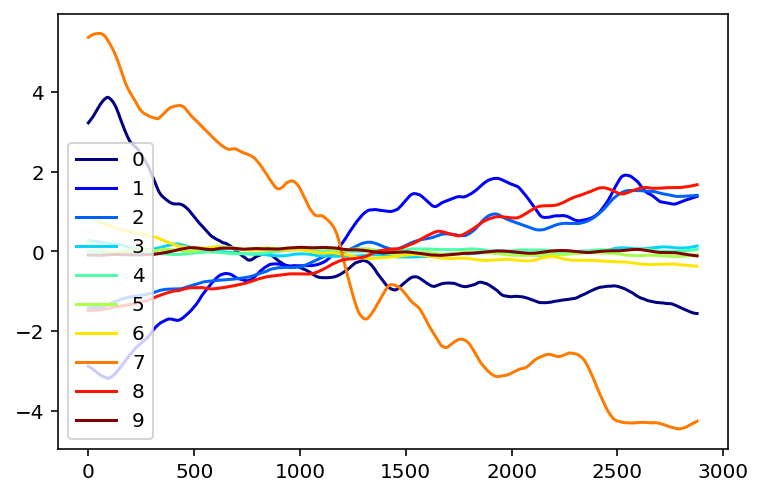

In [900]:
js = np.arange(10)
for j in js:
    x = debleachedMovie[:,ioff,j]
    plt.plot(x, c=plt.cm.jet(j/js.max()),label=j)
plt.legend()

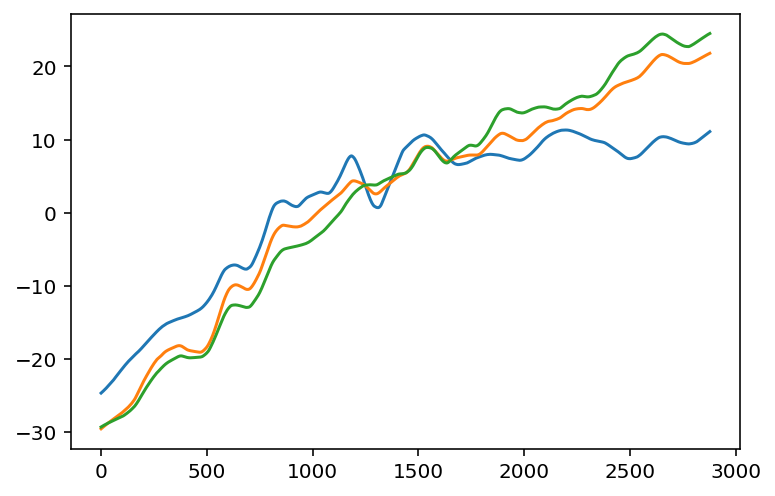

In [866]:
for i,j in [(0,0),(0,1),(0,2)]:
    i += 10
    j += 10
    plt.plot(debleachedMovie[:,i,j])

In [894]:
# plt.imshow(np.diff(debleachedMovie,0).local_correlations(1,0))
# plt.imshow(debleachedMovie.local_correlations(1,0))

In [ ]:
plt.imshow(diffMovie.)

In [ ]:
deca

### is the estimate of error right?

#### error vs mean

In [601]:
maxf = m_50.max()

In [1867]:
dt = 4*wIron
data = []
for t,i,j in list(np.random.randint((len(time)-dt//2,)+stdImg.shape, size = (10000,3)))+[np.array(np.where(m_50==m_50.max())).T[0]]:
    t = np.maximum(t,dt//2)
    dx = dMovie[t-dt//2:t+dt//2,i,j]
    if dx.mean()==0: continue
#     data += [(filteredMovie[t,i,j],dx.std())]
#     data += [(filteredMovie[t,i,j],dx.std(),filteredMovie[t,i,j]+dx.mean())]
    data += [(m_50[t,i,j],dx.std(),m_50[t,i,j]+dx.mean())]

In [1868]:
x,y,z = np.array(data).T

y = y[x>.01]
z = z[x>.01]
x = x[x>.01]

In [1869]:
mean0 = z[x<.1].mean()
std0  = y[x<.1].mean()

In [1888]:
n =10
def pc2std(xr_):
#     return np.maximum(std0,xr_**.5)
    return (std0**n+(xr_**.5)**n)**(1/n)
# def pc2std(xr_,b,c):
#     return (std0  + b*(xr_)**c)**.5
def pc2mean(xr_,b,c):
    return (mean0 + b*(xr_)**c)

In [1889]:
%matplotlib inline

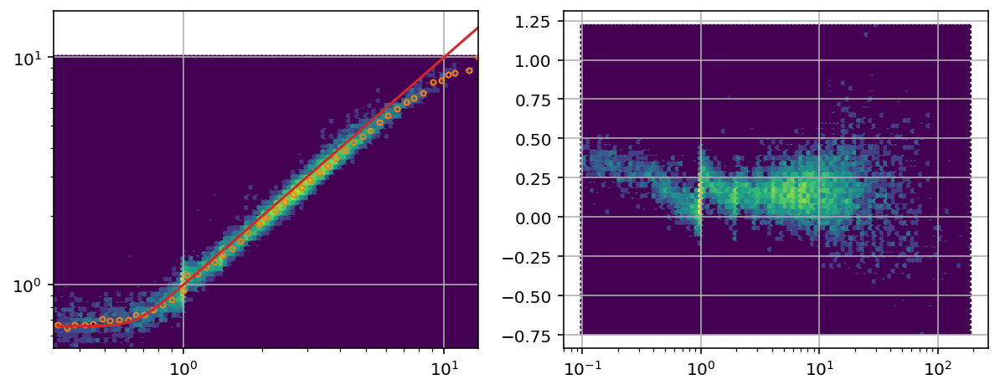

In [1892]:
y = y[x>.1]
z = z[x>.1]
x = x[x>.1]
xb = np.logspace(np.log10(x.min()),np.log10(x.max())+.01)
xd = np.digitize(x,xb)
xr = np.array([np.median(x[xd==i]) for i in np.unique(xd)])
yr = np.array([np.median(y[xd==i]) for i in np.unique(xd)])
zr = np.array([np.median(z[xd==i]) for i in np.unique(xd)])

# pc2stdPars  = curve_fit(pc2std,x,y)[0]
# pc2meanPars = curve_fit(pc2mean,x,y)[0]

plt.figure(figsize=(10,3.7))
plt.subplot(121)
plt.hexbin(x**.5,y,norm=LogNorm(),xscale="log",yscale="log")
plt.plot(xr**.5,yr,"C1.",mfc="none")
plt.plot(xr**.5,pc2std(xr),"C3")
plt.grid()

plt.subplot(122)
plt.hexbin(x,z-x,norm=LogNorm(),xscale="log",yscale="linear")
# plt.plot(xr,zr,"C1.",mfc="none")
# plt.plot(xr,pc2mean(xr,*pc2meanPars),"C3")
plt.grid()

#### std of the m_50

In [2017]:
meanImg = m_50.mean(0)
stdImg  = m_50.std(0)

In [1940]:
maxf = m_50.max()

In [1946]:
dt = wIron
data = []
for t,i,j in list(np.random.randint((len(time)-dt//2,)+stdImg.shape, size = (10000,3)))+[np.array(np.where(m_50==m_50.max())).T[0]]:
    t = np.maximum(t,dt//2)
    dx = m_50[t-dt//2:t+dt//2,i,j]
    data += [(
        m_50[t,i,j],
        dx.std(),
        dx.mean()
    )]

In [1947]:
x,y,z = np.array(data).T

y = y[x>.01]
z = z[x>.01]
x = x[x>.01]

In [1948]:
%matplotlib inline

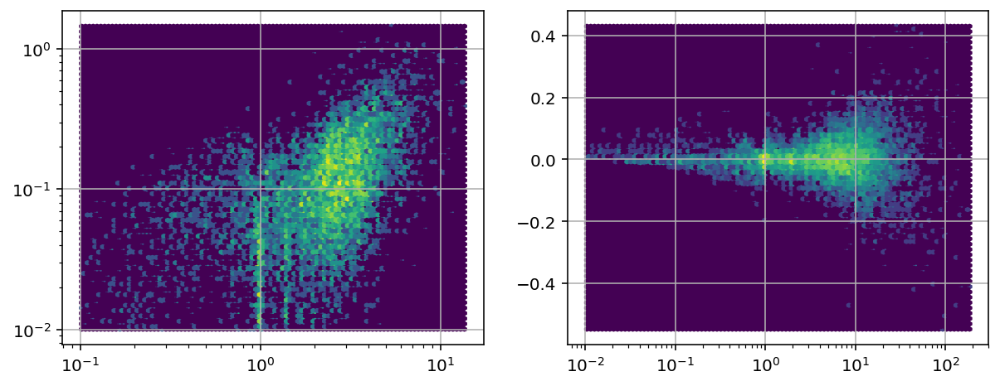

In [1949]:

z = z[y>.01]
x = x[y>.01]
y = y[y>.01]
# xb = np.logspace(np.log10(x.min()),np.log10(x.max())+.01)
# xd = np.digitize(x,xb)
# xr = np.array([np.median(x[xd==i]) for i in np.unique(xd)])
# yr = np.array([np.median(y[xd==i]) for i in np.unique(xd)])
# zr = np.array([np.median(z[xd==i]) for i in np.unique(xd)])

# pc2stdPars  = curve_fit(pc2std,x,y)[0]
# pc2meanPars = curve_fit(pc2mean,x,y)[0]

plt.figure(figsize=(10,3.7))
plt.subplot(121)
plt.hexbin(x**.5,y,norm=LogNorm(),xscale="log",yscale="log")
# plt.plot(xr**.5,yr,"C1.",mfc="none")
# plt.plot(xr**.5,pc2std(xr),"C3")
plt.grid()

plt.subplot(122)
plt.hexbin(x,z-x,norm=LogNorm(),xscale="log",yscale="linear")
# plt.plot(xr,zr,"C1.",mfc="none")
# plt.plot(xr,pc2mean(xr,*pc2meanPars),"C3")
plt.grid()

#### many other tries

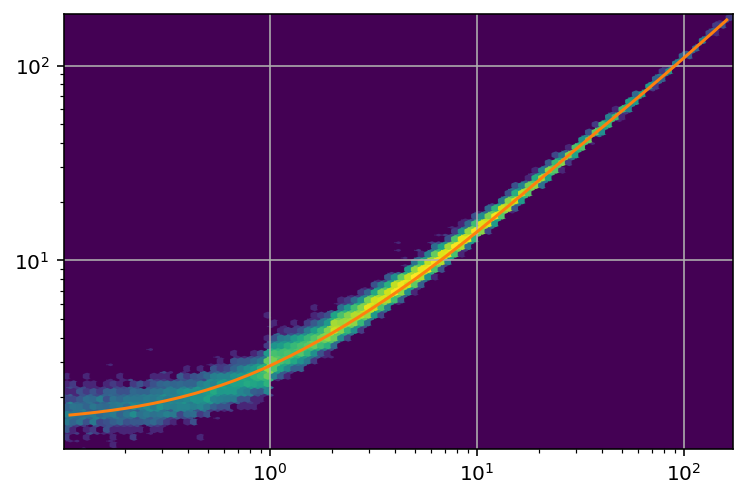

In [772]:
# plt.plot(x,z,".")
plt.hexbin(x,z,norm=LogNorm(),xscale="log",yscale="log")
highPartPars    = curve_fit(highPartMean,x[x>100],z[x>100],)[0]
lowPartPars     = curve_fit(highPartMean,x[x< 30],z[x< 30],)[0]
lowestPartPars  = curve_fit(highPartMean,x[x<  3],z[x<  3],)[0]
# plt.plot(xr,highPartMean(xr,*highPartPars))
# plt.plot(xr,highPartMean(xr,*lowPartPars))
# plt.plot(xr,highPartMean(xr,*lowestPartPars))
plt.plot([])
n = 20
plt.plot(xr,1/(
    1/highPartMean(xr,*highPartPars)**n+
    1/highPartMean(xr,*lowPartPars)**n+
    1/highPartMean(xr,*lowestPartPars)**n)**(1/n)
        )
# plt.plot(xr,xr*1.0+10)
plt.grid()

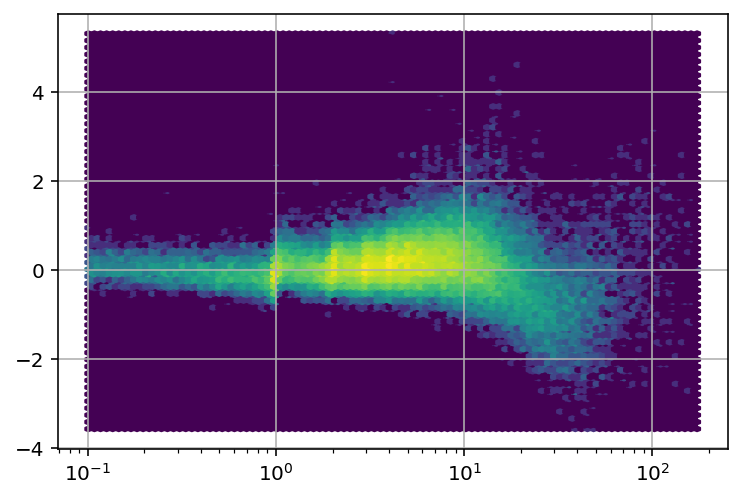

In [779]:
n = 30
zp = 1/(
    1/highPartMean(x,*highPartPars)**n+
    1/highPartMean(x,*lowPartPars)**n+
    1/highPartMean(x,*lowestPartPars)**n)**(1/n)
plt.hexbin(x,z-zp,norm=LogNorm(),xscale="log",yscale="linear")
plt.grid()

In [649]:
pc2meanPars

array([0.44993375, 0.63547201])

In [713]:
def lowPartMean(xr_, a,b,c):
    return a*(xr_+b)**c+mean0-a*b**c

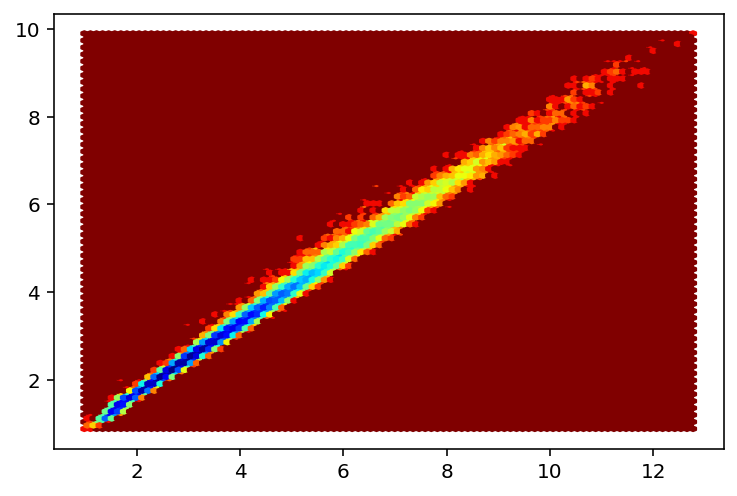

In [740]:
plt.hexbin(z,y,norm=LogNorm(),xscale="linear", cmap="jet_r")

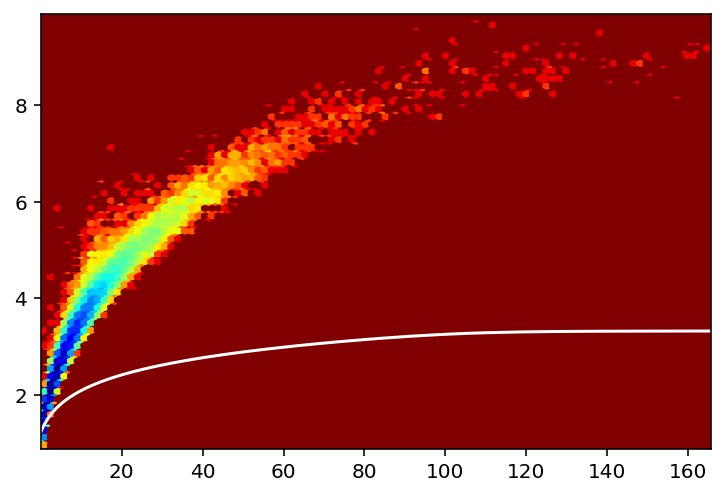

In [739]:
plt.hexbin(x,y,norm=LogNorm(),xscale="linear", cmap="jet_r")
plt.plot(xr,handFitPc2Mean(xr)**.5,"w")

In [ ]:
pl

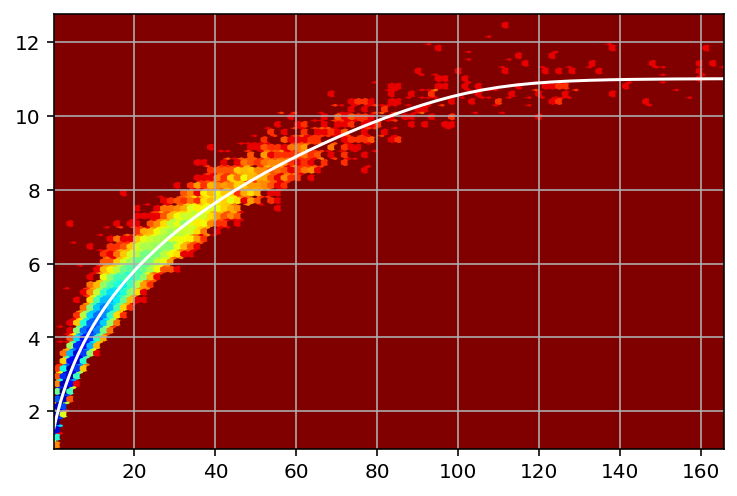

In [733]:
plt.hexbin(x,z,norm=LogNorm(),xscale="linear", cmap="jet_r")
plt.plot([])
xl = plt.xlim()
yl = plt.ylim()
# plt.plot(xr,mean0 + .3*(xr)**.7)

# f = lambda xi: 2*(xi+1)**.39-.6
# plt.plot(xr,f(xr))

# plt.plot(xr,1/(1/f(xr)**n+1/11.3**n)**(1/n),".-")

lowPartPars = curve_fit(lowPartMean,x[x<70],z[x<70],p0=(2,1,.39))[0]
# plt.plot(xr,lowPartMean(xr,*lowPartPars))
# highPartPars = curve_fit(highPartMean,x[x>120],z[x>120],)[0]
highPartPars = (0,z[x>120].mean())
# plt.plot(xr,highPartMean(xr,*highPartPars))
n = 40
xr = np.logspace(np.log10(x.min()),np.log10(x.max()),200)
def handFitPc2Mean(xi):
    n = 30
    return 1/(1./highPartMean(xi,*highPartPars)**n+1./lowPartMean(xi,*lowPartPars)**n)**(1./n)
plt.plot(xr,handFitPc2Mean(xr),"w")
# plt.plot(xr,2*(xr+1)**.5-1)
# plt.plot(xr,pc2std(xr,*pc2stdPars))
plt.xlim(xl)
plt.ylim(yl)
plt.grid()

In [736]:
len(filteredMovie)

10101

In [737]:
%%time
shiftFilteredMovie = handFitPc2Mean(filteredMovie)

CPU times: user 13.2 s, sys: 2.85 s, total: 16.1 s
Wall time: 16.1 s


In [738]:
realDiffMovie = m_orig-shiftFilteredMovie

In [731]:
zScoreMovie = realDiffMovie/

11.016277089909037

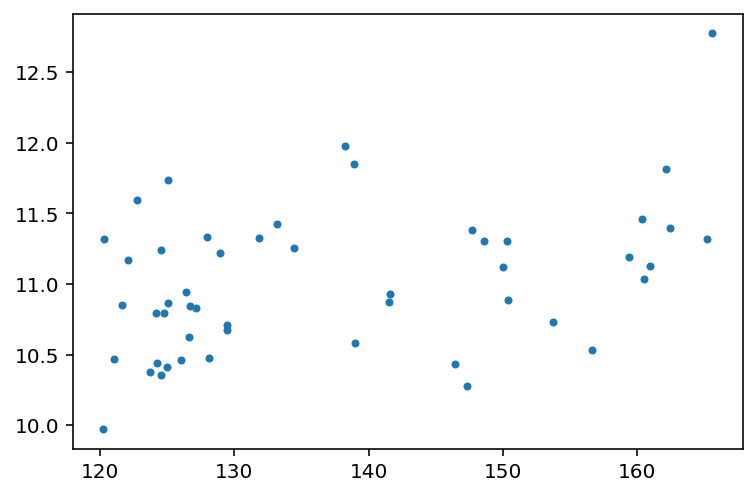

In [730]:
plt.plot(x[x>120], z[x>120],".")

/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/scipy/optimize/minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


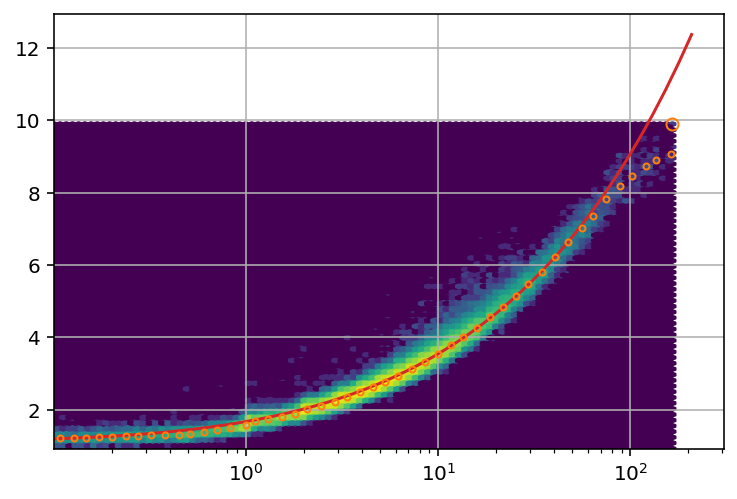

In [615]:
# plt.plot(*np.array(tmp).T,color="C1")
xr = np.logspace(np.log10(x.min()),np.log10(x.max())+.01)
pc2meanPars = curve_fit(pc2std,x,y)[0]
plt.plot(xr,pc2std(xr,*pc2meanPars),"C3")


plt.plot(*data[-1],marker="o",mfc="none",c="C1")

In [617]:
t,i,j = np.array(np.where(filteredMovie==maxf)).T[0]

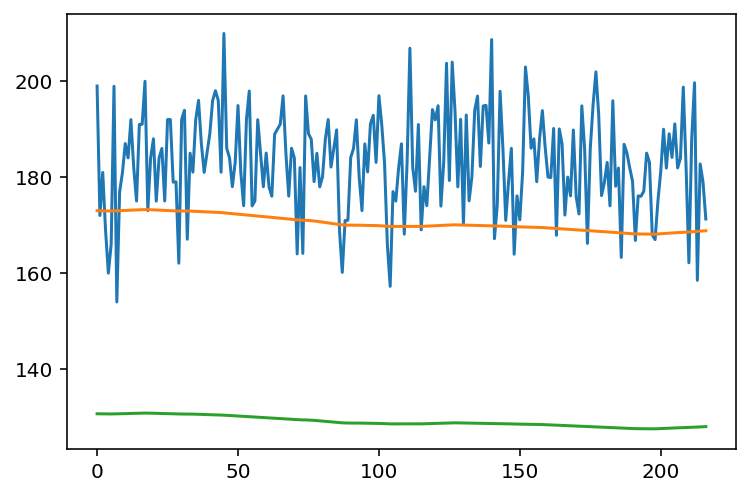

In [625]:
plt.plot(m_orig[0:t+200,i,j])
plt.plot(filteredMovie[0:t+200,i,j])
plt.plot(pc2std(filteredMovie[0:t+200,i,j],*pc2meanPars)**2)

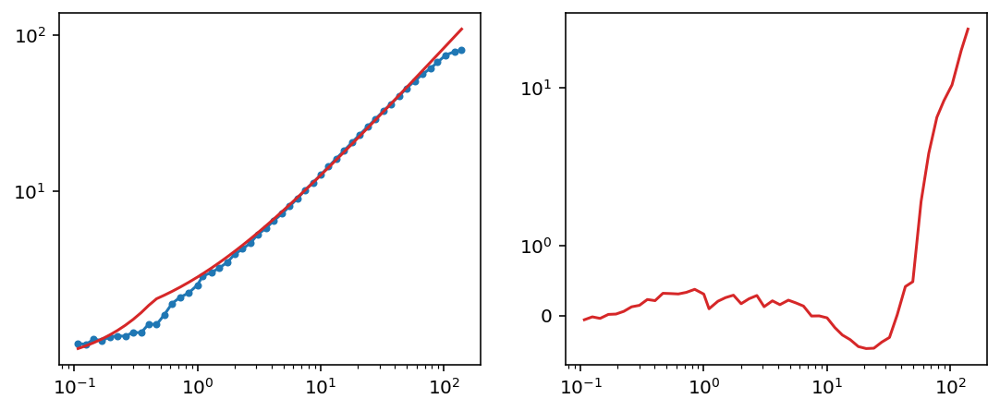

In [590]:
fig, axs = plt.subplots(1,2,figsize=(9,3.5))
axs[0].plot(xr,yr**2,".-")
axs[0].plot(xr,pc2std(xr,*pc2meanPars)**2,"C3")
axs[1].plot(xr,pc2std(xr,*pc2meanPars)**2-yr**2,"C3")
for ax in axs:
    ax.set_xscale("log")
    ax.set_yscale("symlog")

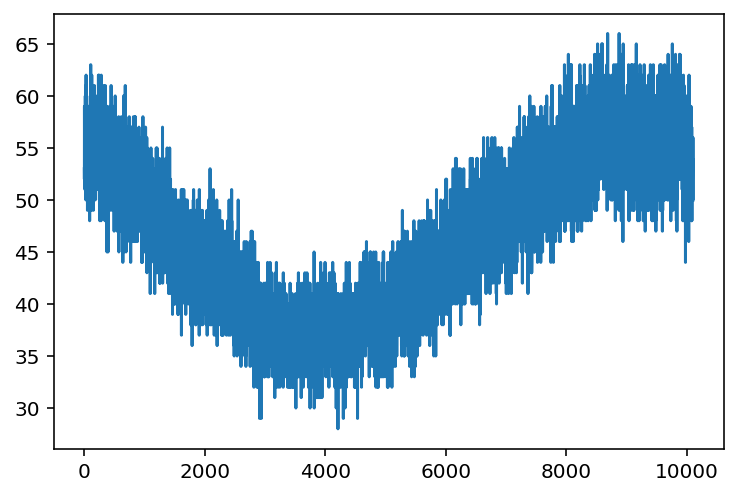

In [588]:
plt.plot(np.sum(m_orig>80,(1,2)))

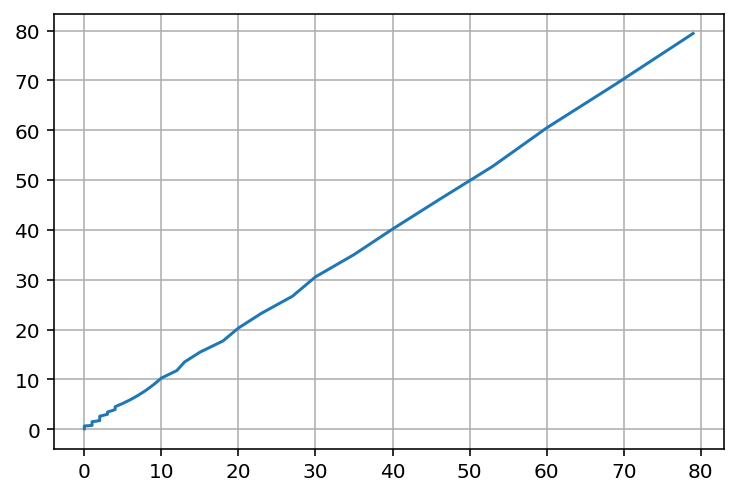

In [828]:
mus = np.logspace(-1,1.9)
tmp = []
for mu in mus:
    p = dst.poisson(mu=mu)
    tmp += [(p.ppf(.5),p.mean())]
plt.plot(*np.array(tmp).T)
# plt.xscale("log")
plt.grid()

In [613]:
%%time
%%capture
pc2std(filteredMovie[:1000],*pc2meanPars)

CPU times: user 285 ms, sys: 38.3 ms, total: 323 ms
Wall time: 322 ms


In [614]:
len(filteredMovie)

10101

In [403]:
%matplotlib notebook

In [386]:
# skv = np.argpartition(-diffSkew.flatten(),1000)
skv = np.argpartition(-stdFiltered.flatten(),1000)

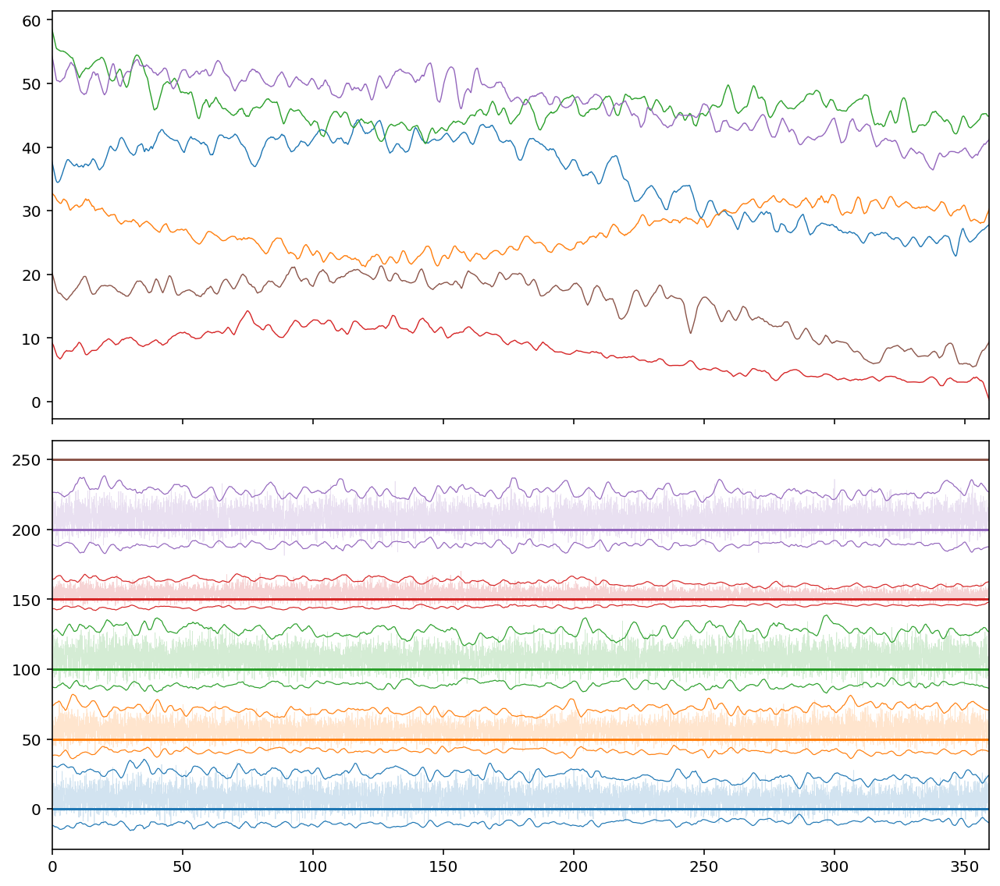

In [424]:
# %%capture
plt.close()
fig, axs = plt.subplots(2,1,figsize=(9,8), sharex=True)
ia = 0
# for roi in range(10,15):
#     np.random.seed(roi)
#     i,j = np.random.choice(stdImg.shape[0],size=2)
for i,j in zip(skv//metadata.X, skv%metadata.X):
    c="C%i"%ia
    x  = m_orig       [:,i,j]
    xf = filteredMovie[:,i,j]
    dx = diffMovie    [:,i,j]
#     if diffSkew[i,j]<2: continue
#     if diffMedians[i,j]<1: continue
#     if xf.std()<10: continue
#     if dx.std()<1: continue
#     axs[0].plot(time,x ,c=c,lw=.4,alpha = .3)
    axs[0].plot(time,xf,c=c,lw=.7)
    yoffset = 50*ia
    axs[1].plot(time,dx+yoffset,c=c,lw=.4,alpha = .2)
    axs[1].axhline(yoffset,color=c)
#     axs[1].plot(time,xdp[p]+yoffset,label=roi,c=c,lw=.6)
    
    xdp = OrderedDict([
        (p,lowPass(dx,1*wIron,1*wIron, perc = p)) for p in [15.73,50]#[10,25,50,75]
    ])
    xdm = xdp[50]
    xds = xdp[50]-xdp[15.73]
    for n in [3]:
        axs[1].plot(time,xdm-n*xds+yoffset,label=roi,c=c,lw=.6 if n else 1)
        axs[1].plot(time,xdm+n*xds+yoffset,label=roi,c=c,lw=.6 if n else 1)
#     for p in xdp:
#         axs[1].plot(time,xdp[p]+yoffset,label=roi,c="C%i"%roi,lw=.6)
    ia += 1
    if ia>5:
        break
axs[0].set_xlim(0,time.max())
fig.tight_layout()

In [341]:
# %%time
# xdp = OrderedDict([
#         (p,percFilter(dx,filterSize=wIron,perc = p)) for p in [10,25,50,75]
#     ])

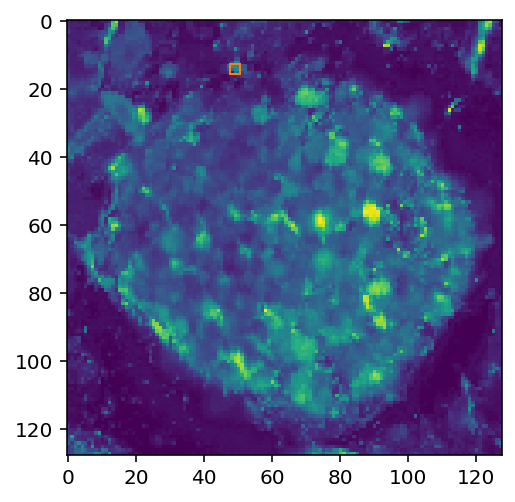

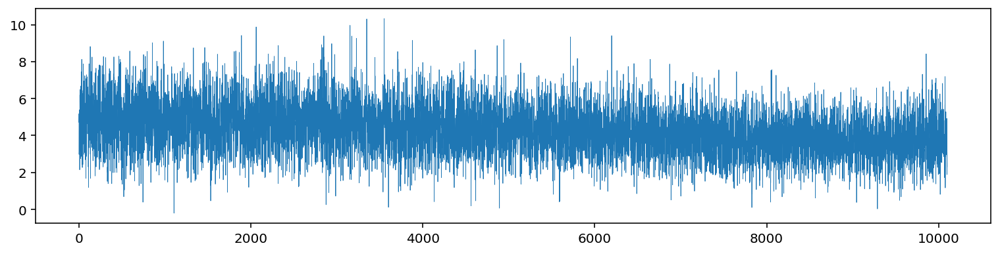

In [259]:
plt.imshow((diffP99-diffMedians).T)
addRoisToImage([(48,13)],pxWin=3,ax=plt.gca(),label=False)
plt.show()
plt.figure(figsize=(13,3))
plt.plot(getRoiProfiles([(48,13)],3,image_=diffMovie)[0],lw=.4)
# plt.plot(diffMovie[)

In [ ]:
diffMedians==diffMedians.max()

In [104]:
%matplotlib notebook

<IPython.core.display.Javascript object>


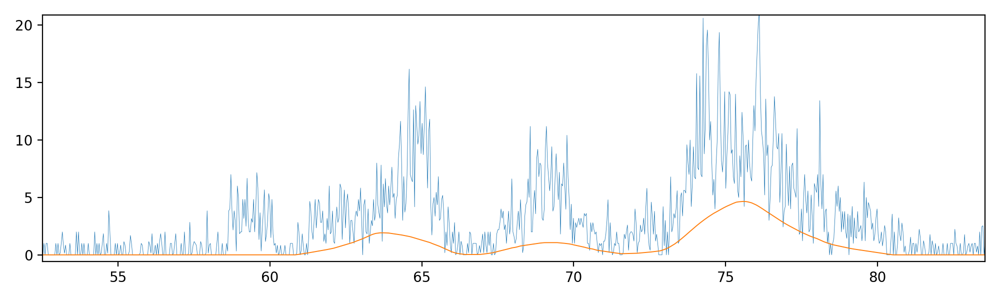

In [110]:
fig = plt.figure(figsize=(10,3))

plt.plot(time,m_orig       [:,i,j],lw=.3)
plt.plot(time,filteredMovie[:,i,j],lw=.7)
# plt.xlim(0,len(diffMovie))
fig.tight_layout()

In [78]:
# filteredMovie = np.maximum(filteredMovie,0)

In [146]:
# PredictedSigmas = np.zeros_like(meanImg)
# PredictedLocs   = np.zeros_like(meanImg)
# # for i,j in product(np.arange(metadata.X),np.arange(metadata.Y)):
# for i,j in np.array(np.where(np.isfinite(filteredMovie[0]))).T:
#     lc,sg = predictLocSd(diffMovie[:,i,j])
# #     diffMovie[:,i,j] -= lc
# #     filteredMovie[:,i,j] += lc
#     PredictedSigmas[i,j] = sg
#     PredictedLocs  [i,j] = lc

fit mean from percentile

In [73]:
%matplotlib notebook

<IPython.core.display.Javascript object>


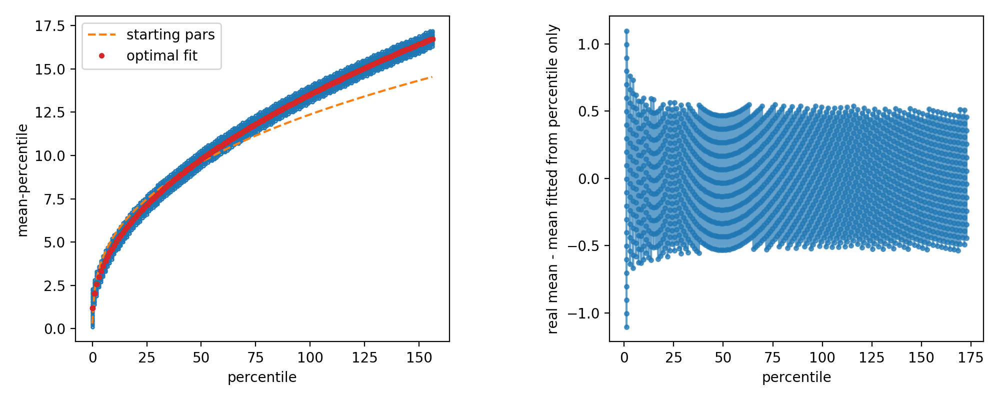

In [74]:
fig, axs = plt.subplots(1,2,figsize=(10,4))

mus = np.arange(0.1,filteredMovie.max(),.1)
percs = dst.poisson.ppf(filterPars[2]/100,mu=mus)
axs[0].plot(percs,mus-percs,".",ms=4,mfc="none")
axs[0].set_xlabel("percentile")
axs[0].set_ylabel("mean-percentile")
def tmpf(xi,a,b,c,d): return a*xi/(1+xi/b)**c+d
p0 = (4.7,.3,.63,.3)
axs[0].plot(percs,tmpf(percs,*p0),label="starting pars",ls="--")
p_opt = curve_fit(tmpf,percs,mus-percs,p0, maxfev=10000)[0]
axs[0].plot([])
axs[0].plot(percs,tmpf(percs,*p_opt),".",label="optimal fit")
axs[0].legend()

axs[1].set_xlabel("percentile")
axs[1].set_ylabel("real mean - mean fitted from percentile only")
def pc2meanF(pcs_):
    return pcs_+tmpf(pcs_,*p_opt)
# axs[1].plot(mus, pc2meanF(percs), ".-",alpha = .7)
axs[1].plot(pc2meanF(percs),mus-pc2meanF(percs),".-",alpha = .7)
fig.tight_layout(w_pad=7)
# plt.xscale("log")
# plt.yscale("log")

In [ ]:
, sharex=True

# investigate zMovie

In [261]:
zMovie = dMovie/m_s

#### play it

In [262]:
def blurInTime(original_, k, s):
    from caiman import movie
    from cv2 import GaussianBlur
    out = original_.copy()
    out = GaussianBlur(
        out.reshape((len(out),-1)),ksize=(k,1),sigmaX=s, sigmaY=0
    ).reshape(out.shape)
    out = movie(out)
    return out

In [263]:
ns,ss = 5,.4
z = np.zeros((5,5))
z[len(z)//2,len(z)//2] = 1
zb  = cv2.GaussianBlur(z,ksize=(ns,ns),sigmaX=ss,sigmaY=ss)
nt,st = 5,.5
zb1 = cv2.GaussianBlur(z,ksize=(nt,1),sigmaX=st,sigmaY=0)
with np.printoptions(precision=3, suppress=True):
    print (zb)
    print (zb1)

[[0.    0.    0.    0.    0.   ]
 [0.    0.002 0.037 0.002 0.   ]
 [0.    0.037 0.845 0.037 0.   ]
 [0.    0.002 0.037 0.002 0.   ]
 [0.    0.    0.    0.    0.   ]]
[[0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]
 [0.001 0.106 0.787 0.106 0.001]
 [0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]]


In [264]:
zMovieBlurred = zMovie.copy()
zMovieBlurred.gaussian_blur_2D(ns,ns,ss,ss);
zMovieBlurred = blurInTime(zMovieBlurred,nt,st)
# zMovie[zMovie<0] = 0
# zMovie[zMovie>5] = 5

In [265]:
zMovie.max(),zMovie.min(), zMovieBlurred.max(), zMovieBlurred.min()

(movie(10.65778463), movie(-9.13286905), movie(8.56185571), movie(-7.48539868))

In [266]:
zmin, zmax = zMovieBlurred.min(),zMovieBlurred.max()

In [267]:
ppmax = np.percentile(dMovie,99)

In [273]:
tmp = np.diff(m_50,axis=0)

In [275]:
tmp.max(), tmp.min()

(movie(2.172409, dtype=float32), movie(-2.1379395, dtype=float32))

In [ ]:
# plt.figure()

In [282]:
movie(np.concatenate([
    np.clip(dMovie,0, ppmax)/ppmax,
    np.ones_like(zMovie[:,:2,:]),
#     (np.clip(zMovie,zmin, zmax)-zmin)/(zmax-zmin,
    np.ones_like(zMovie[:,:2,:]),
    (zMovieBlurred>1.6),
    np.ones_like(zMovie[:,:2,:]),
    (zMovie>2),
],axis=1))[:].play(magnification=2, fr=100,do_loop=True, plot_text=True)

<IPython.core.display.Javascript object>


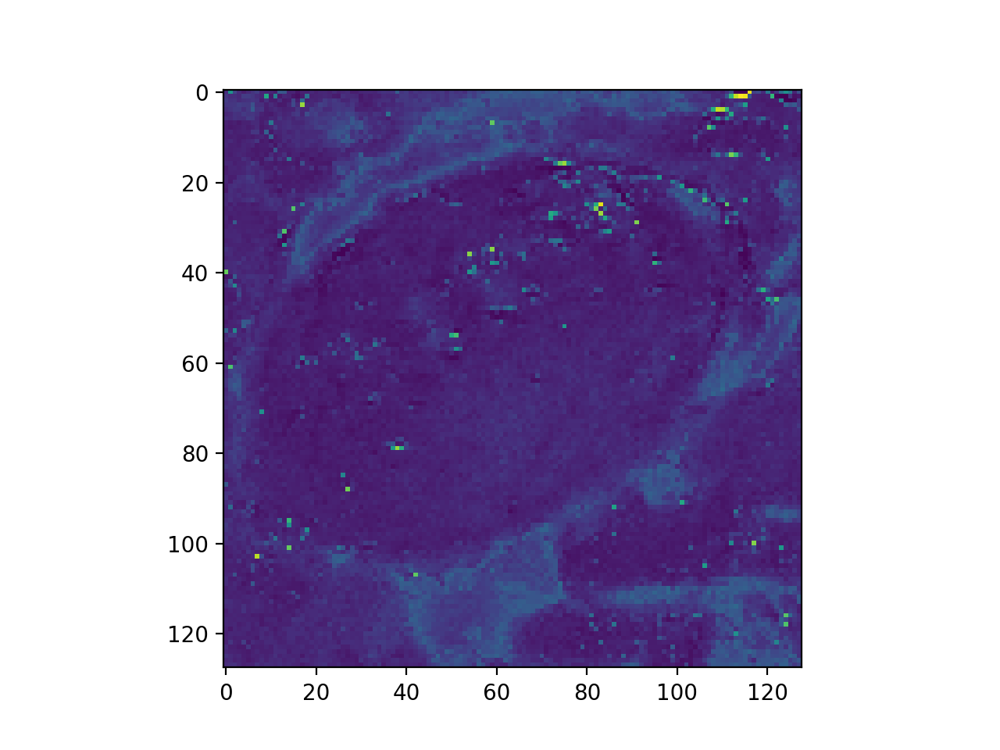

In [284]:
plt.figure()
tmp = (zMovie>2)
tmp = .sum(0)
plt.imshow(tmp)

In [281]:
movie(np.concatenate([
    np.clip(dMovie[:-1],0, ppmax)/ppmax,
    np.ones_like(zMovie[:-1,:2,:]),
    (np.clip(tmp,0, 1)+1)/2,
#     (np.clip(zMovie,zmin, zmax)-zmin)/(zmax-zmin),
#     np.ones_like(zMovie[:,:2,:]),
#     (zMovieBlurred>1.6),
#     np.ones_like(zMovie[:,:2,:]),
#     (zMovie>2),
],axis=1))[:].play(magnification=2, fr=100,do_loop=True, plot_text=True)

#### define and basic

In [174]:
binarized = (zMovie>4).astype(float)

In [175]:
# tmp = np.cumsum(binarized,axis=0)

<IPython.core.display.Javascript object>


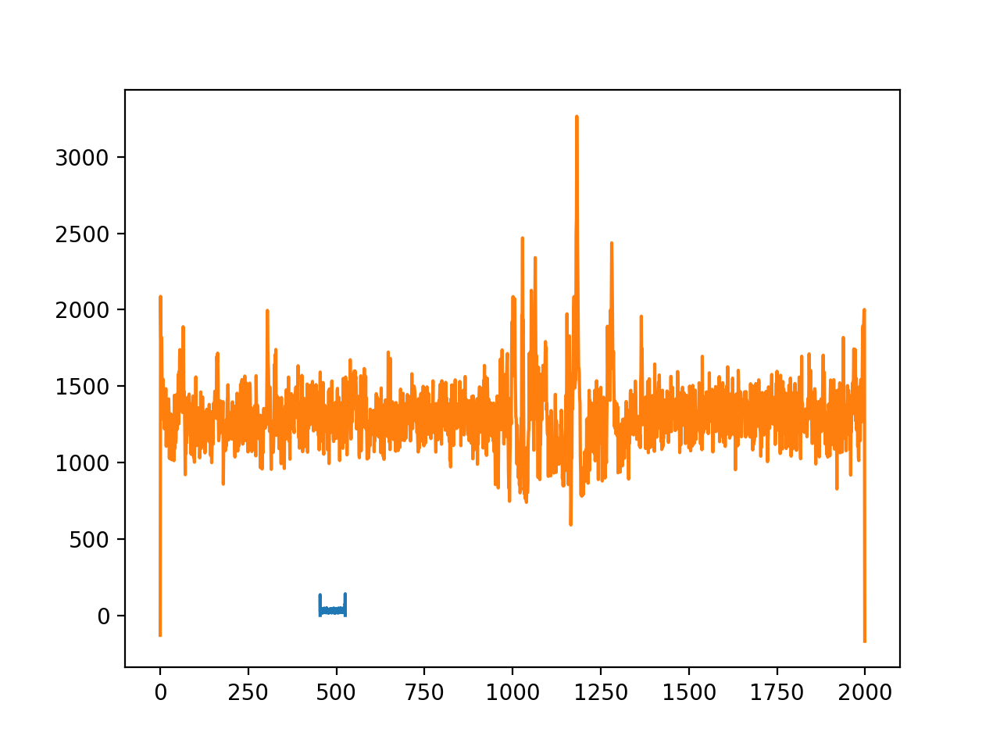

In [177]:
plt.figure()
plt.plot(time[ts], 
         binarized.sum(axis=(1,2)))

In [180]:
zMovie.play(magnification=4)

<IPython.core.display.Javascript object>


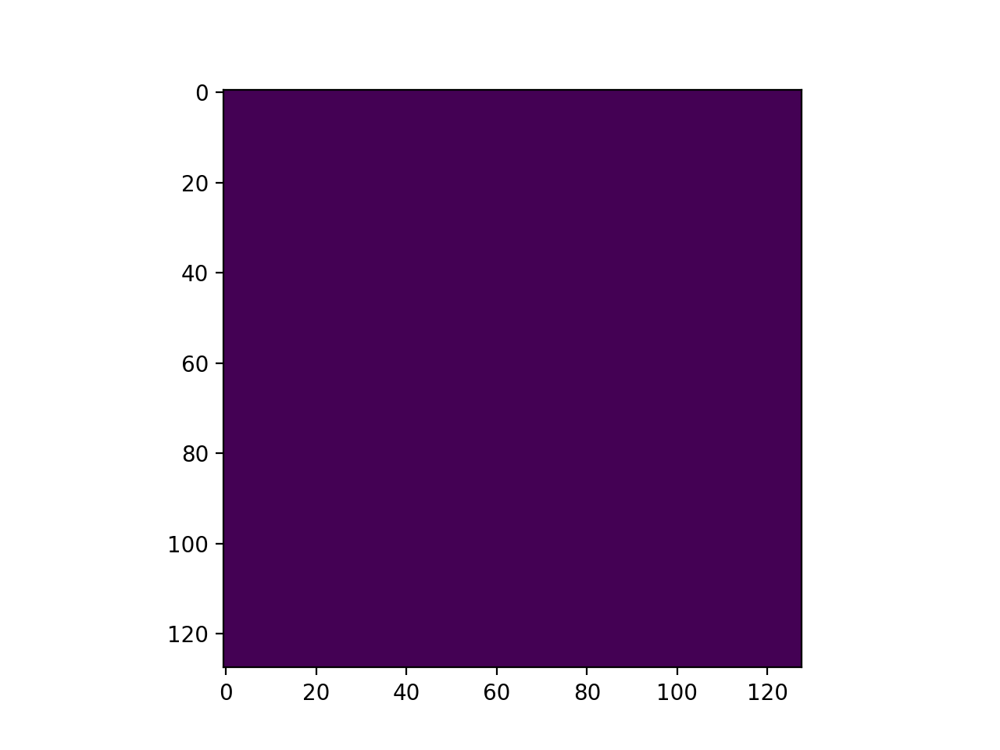

In [179]:
plt.figure()
plt.imshow(binarized[0])

In [185]:
%matplotlib inline

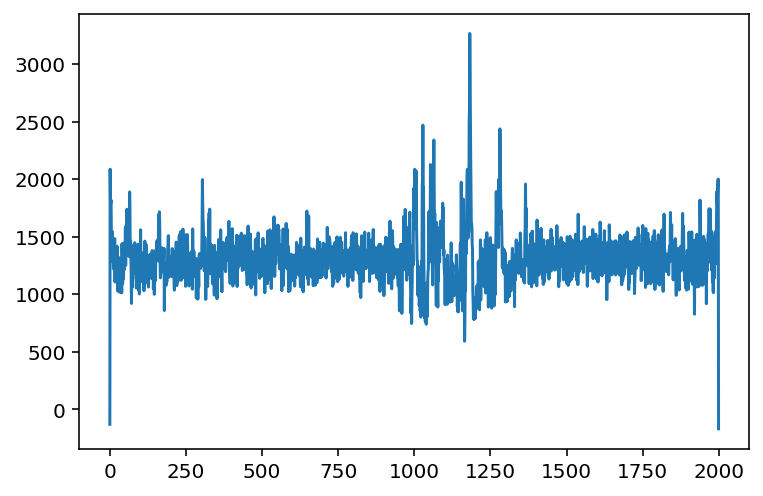

In [186]:
plt.plot(zMovie.sum((1,2)))

In [187]:
# np.cumsum(binarized,axis=0).play(magnification=4, fr=200, do_loop=True,q_max=10)
tmp = zMovie.copy()#.gaussian_blur_2D(5,5,.8,.8)
tmp[tmp<2] = 2
tmp[tmp>6] = 6
tmp[800:1300].play(magnification=4, fr=60, do_loop=True)

In [285]:
tmp = zMovie>3
actTime = np.diff(tmp.astype(int),axis=0)>0
tmp = np.sum(actTime,0)

In [287]:
%%capture
ca = rebin(actTime,5).local_correlations(1,0)

In [288]:
%matplotlib notebook

<IPython.core.display.Javascript object>


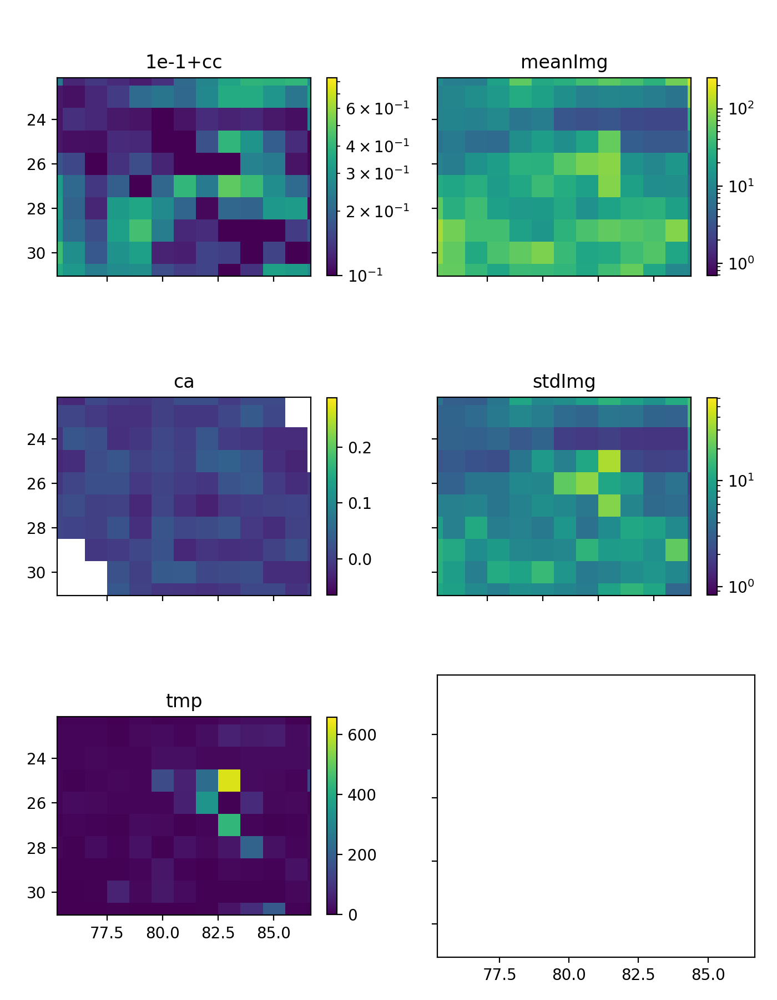

/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  


In [290]:
fig, axs = plt.subplots(3,2,figsize=(7,9), sharex=True, sharey=True)
for ax,m in zip(axs.flat,["1e-1+cc", "meanImg", "ca", "stdImg", "tmp"]):
    ax.set_title(m)
    m = eval(m)
    im = ax.imshow(m,
                   norm = LogNorm() if np.all(m>0) else None
                  )
    plt.colorbar(im,ax=ax,shrink=.7)
fig.tight_layout()
# plt.ioff()

In [2054]:
m_50[::].play(fr=40, magnification=4)

In [1984]:
metadata

T           30304
X             128
Y             128
freq      84.3101
pxSize    2.13776
pxUnit         µm
Name: 0, dtype: object

In [2025]:
# interestingPx = np.array(np.where(tmp>15)).T
# interestingPx = sorted(interestingPx, key=lambda xi: -tmp[tuple(xi)])

<IPython.core.display.Javascript object>


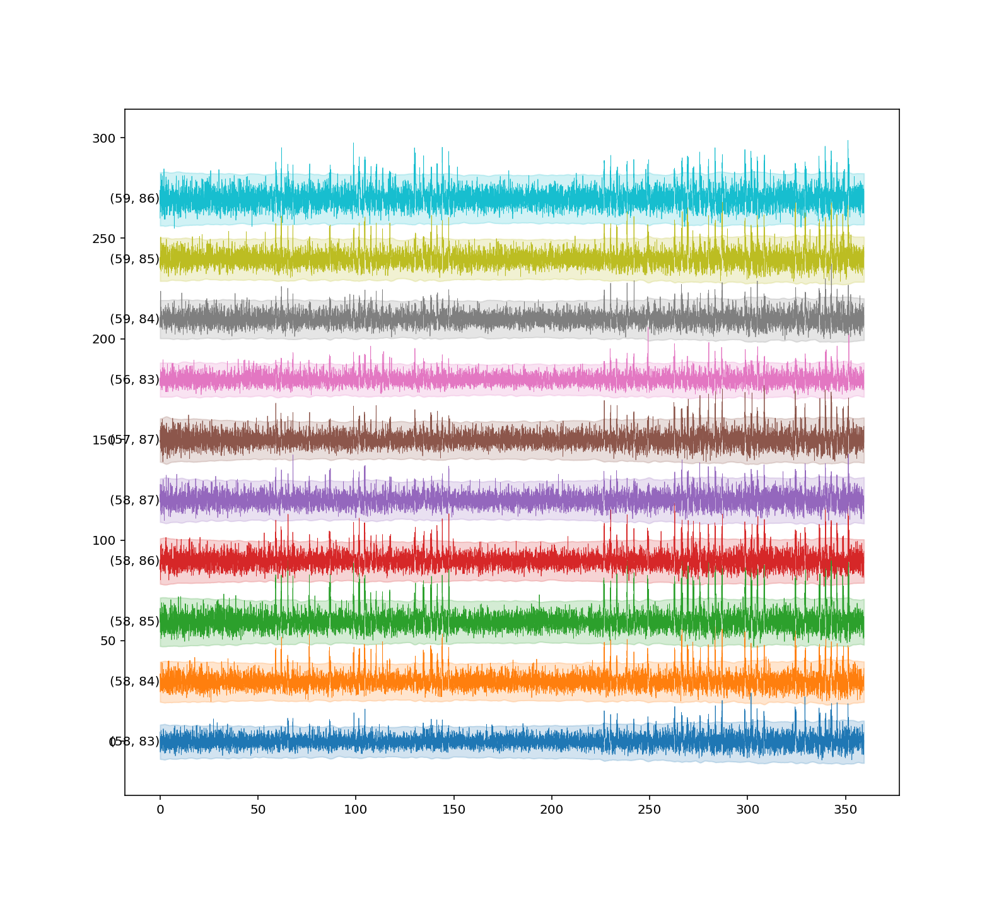

In [2026]:
plt.figure(figsize=(11,10))
ia = 0
for i,j in interestingPx:
    x = dMovie[:,i,j]
    xs = m_s[:,i,j]
    xf = m_50[:,i,j]
#     x = m_orig[:,i,j]
    xoff = ia*30-x.mean()
    c = plt.plot(time, x+xoff,lw=.4)[0].get_color()
#     plt.fill_between(time, xf+3*xs+xoff, xf-3*xs+xoff,color=c,alpha = .2)
    plt.fill_between(time, 3*xs+xoff, -3*xs+xoff,color=c,alpha = .2)
#     xf = lowPass(x,wIron,wIron,10,2)
#     plt.plot(time, xf+xoff+10,lw=.8,c=c)
#     plt.plot(time, runningStd(xf,3*wIron)+xoff+10,lw=.8,c=c)
    plt.text(0,xoff,(i,j),ha="right",va="center")
    ia+=1
    if ia>10:
        break

<IPython.core.display.Javascript object>


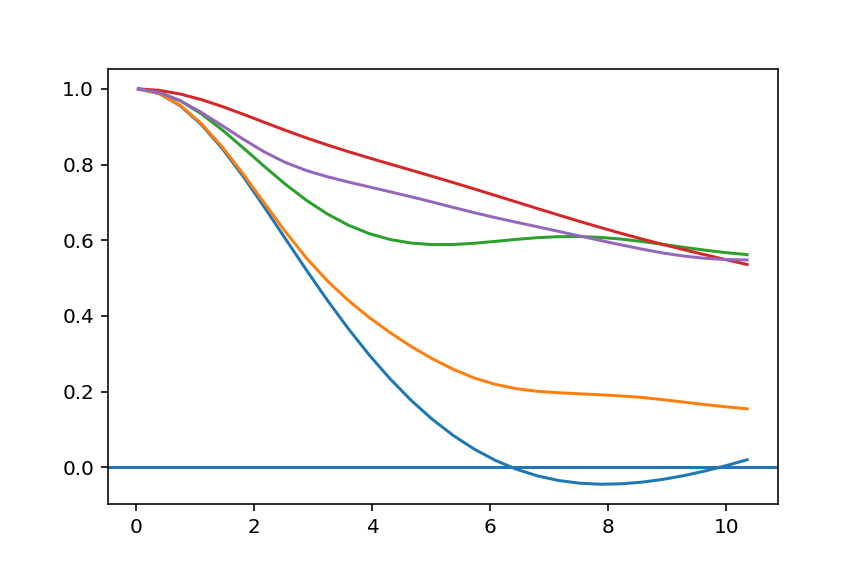

In [1965]:
tr = np.arange(1,300,10)
for i,j in interestingPx[:5]:
    x = m_50[:,i,j]
    y = autocorr(x,tr)
    plt.plot(tr/m_orig.fr,y)
plt.axhline(0)

#### Interesting pixels

In [291]:
# interestingPx = np.array([
#     [58,83],
#     [58,84],
#     [58,85],
#     [58,86],
#     [58,87],
#     [57,87],
#     [56,83],
#     [59,84],
#     [59,85],
#     [59,86],])
interestingPx = np.array([
    [25,83],
    [26,83],
    [27,83],
])

In [292]:
imin,jmin = interestingPx.min(0)-2
imax,jmax = interestingPx.max(0)+2

In [293]:
%matplotlib notebook

<IPython.core.display.Javascript object>


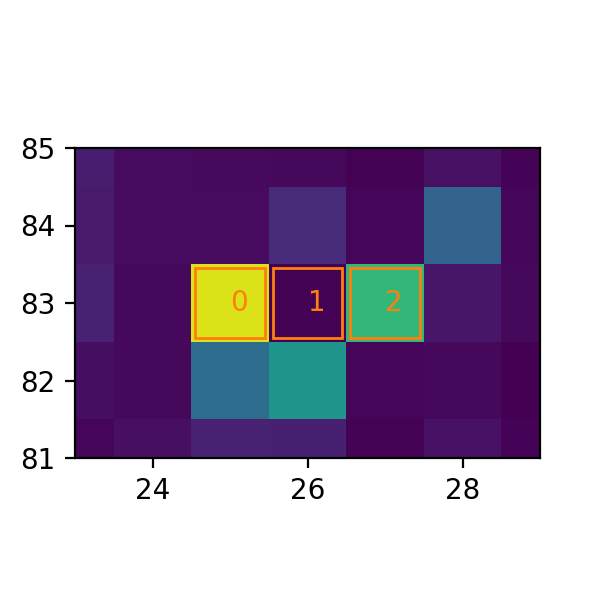

<IPython.core.display.Javascript object>


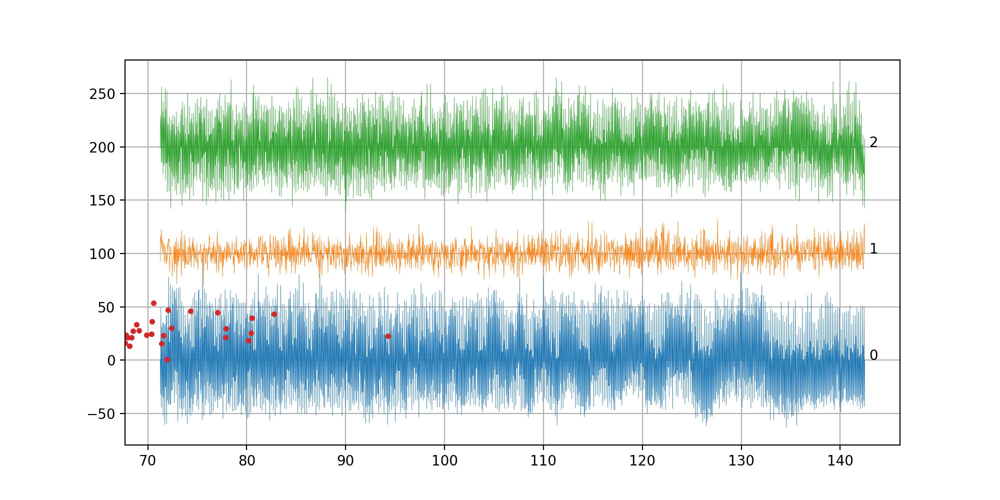

In [297]:
plt.figure(figsize=(3,3))
ax = plt.subplot(111)
ax.imshow(tmp.T)
plt.xlim(imin,imax)
plt.ylim(jmin,jmax)
addRoisToImage(interestingPx,1,ax=ax)

pxTraces = getRoiProfiles(interestingPx,1,image_=dMovie)
plt.figure(figsize=(10,5))
for i in pxTraces:
    yoff = 100*i
    plt.plot(time[ts],pxTraces[i]+yoff,lw=.3)
    plt.text(time[ts].max(),yoff," %i"%i)
plt.grid()

#### Lissajous and Power spectrum

In [391]:
%matplotlib inline

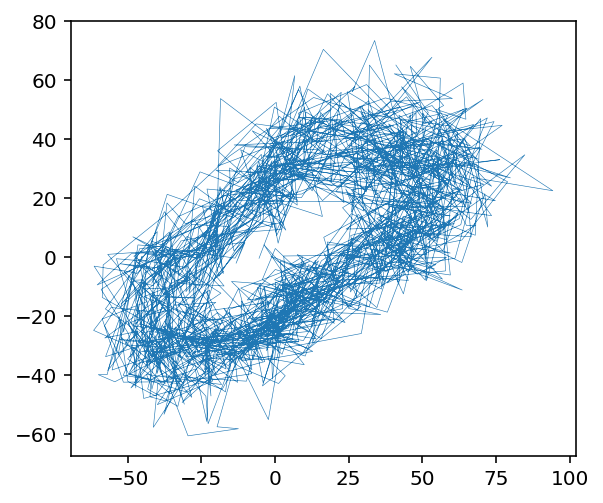

In [392]:
n = 5
plt.plot(dMovie[::n,25,83], dMovie[::n,27,83],lw=.3,alpha = 1)
plt.gca().set_aspect("equal")

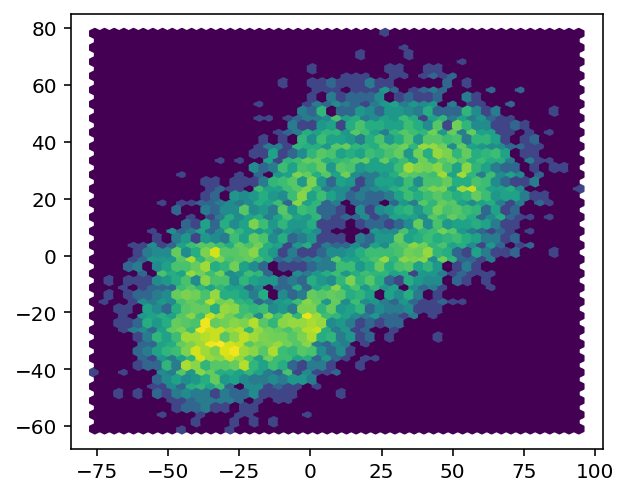

In [400]:
n = 1
plt.hexbin(dMovie[::n,25,83], dMovie[::n,27,83],gridsize=50, bins="log")
plt.gca().set_aspect("equal")

In [382]:
%matplotlib notebook

In [383]:
dt = time[1]

<IPython.core.display.Javascript object>


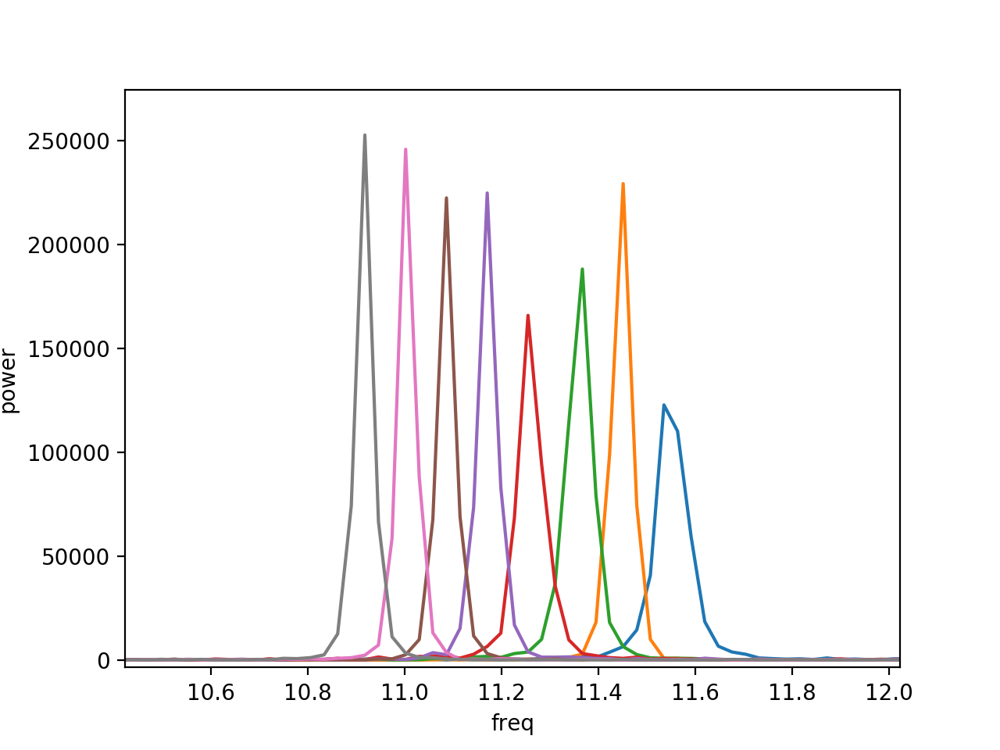

Text(0, 0.5, 'power')

In [389]:
for x in  dMovie[:,27,83].reshape((-1,1000)):

    OU = np.fft.fft(x)
    freqs = np.fft.fftfreq(len(x),dt)
    PowerSpectrum = np.abs(OU)**2

    PowerSpectrum *= (np.sum(x**2)*dt)/(np.sum(PowerSpectrum)*freqs[1])

#     print (np.sum(PowerSpectrum)*freqs[1])
#     print (np.sum(x**2)*dt)

    N = len(x)

    plt.plot(freqs[:N//2], PowerSpectrum[:N//2])
# plt.yscale("log")
plt.xlim(10.3,11.9)
plt.xlabel("freq")
plt.ylabel("power")

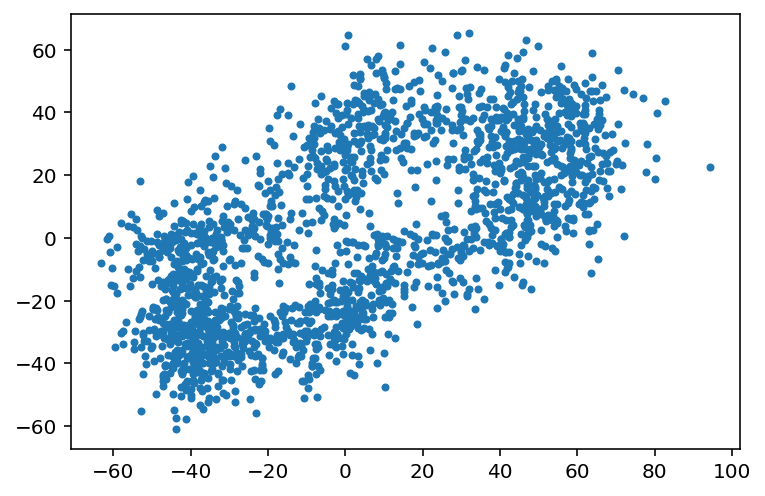

In [319]:
plt.plot(pxTraces[0],pxTraces[2],".")

In [ ]:
for 

In [1913]:
tmp.sum()

movie(13847)

In [1737]:
# (zMovie>10).sum()

In [1857]:
i,j = np.squeeze(np.where(tmp == tmp.max()))

In [1739]:
%matplotlib notebook

In [1819]:
%matplotlib inline

In [1858]:
plt.plot(x,lw=.5)

<IPython.core.display.Javascript object>


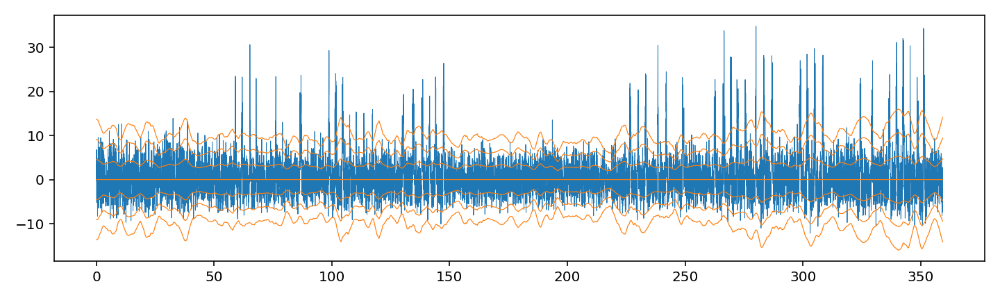

In [1859]:
fig = plt.figure(figsize=(10,3))
x = dMovie[:,i:i+1,j:j+1].sum((1,2))
plt.plot(time[ts],x,lw=.5)
s = m_s[:,i,j]
# s = m_50[:,i:i+1,j:j+1].sum((1,2))**.5
for n in range(-3,4):
    plt.plot(time[ts],n*s,"C1-",lw=.6)
# plt.plot(time[ts],m_50[:,i:i+1,j:j+1].sum((1,2)),lw=1)
fig.tight_layout()

In [1768]:
X = np.array([x[tt-20:tt+40] for tt in np.where(np.diff((x>4*s).astype(int)))[0]])

<IPython.core.display.Javascript object>


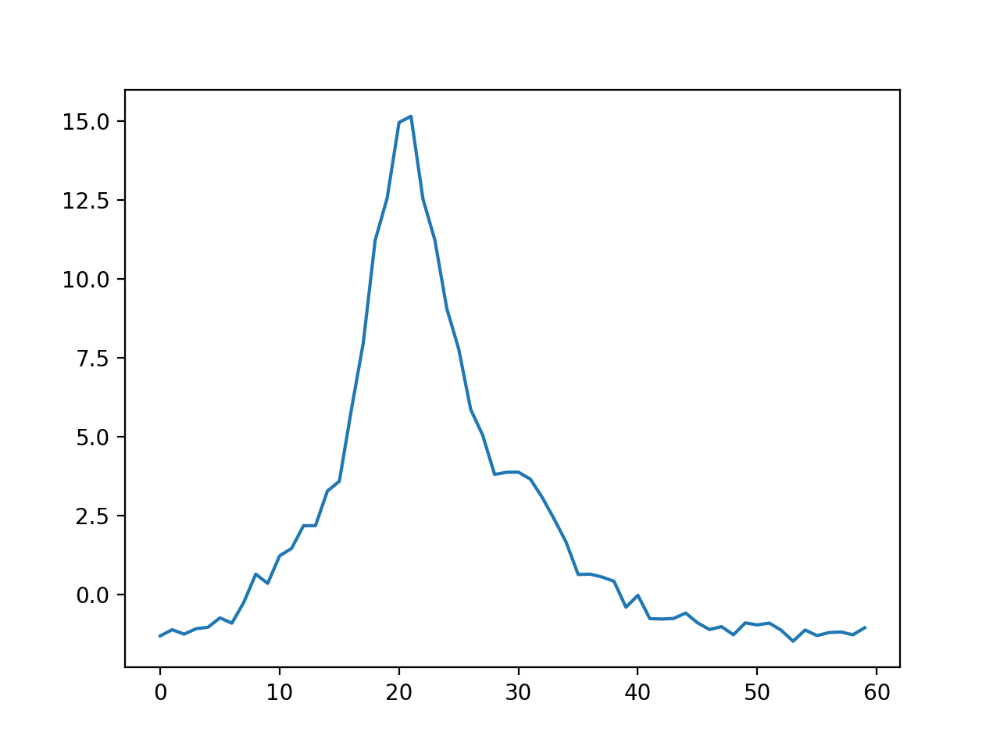

In [1769]:
plt.plot(np.median(X,0))

In [1803]:
vals, vects = myPCA(X)

<BarContainer object of 10 artists>

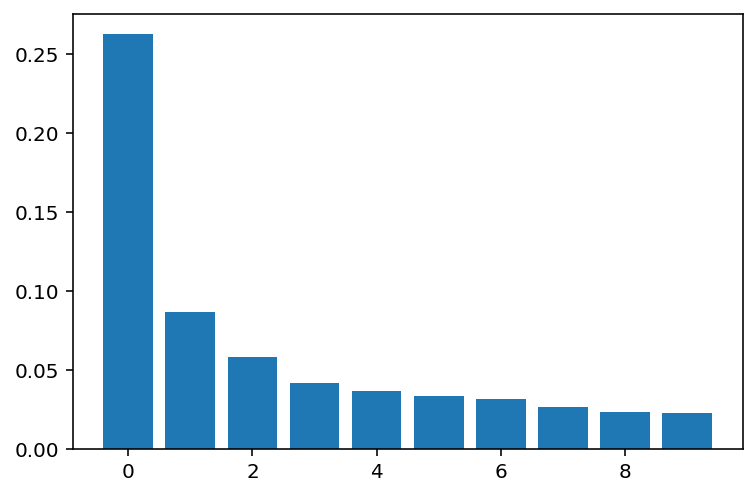

In [1804]:
plt.bar(np.arange(10), vals[:10]/vals.sum())

In [260]:
# plt.plot(vects[:3].T)

In [259]:
# vals

#### Separate into events

In [220]:
%matplotlib notebook

<IPython.core.display.Javascript object>


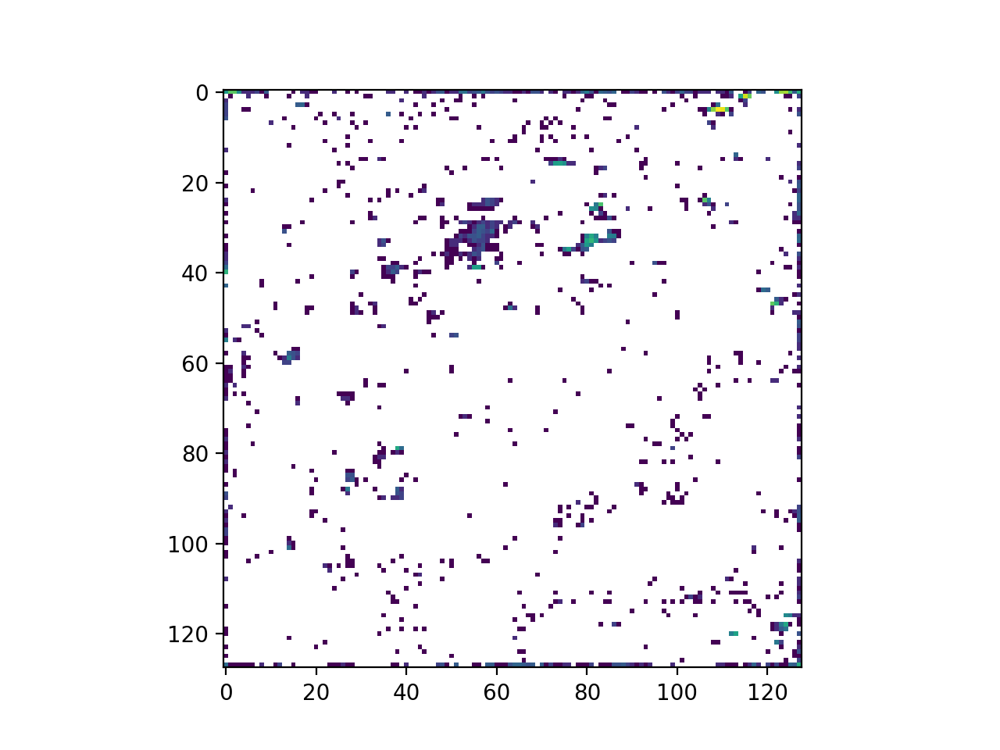

In [221]:
plt.imshow(np.sum(zMovie>2,0), norm=LogNorm())

In [224]:
# npzFile

<IPython.core.display.Javascript object>


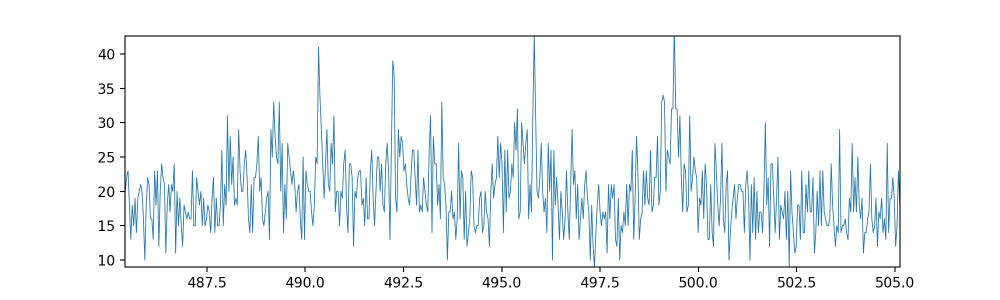

In [243]:
i,j = 32,56
plt.figure(figsize=(10,3))
# x = dMovie[:,i,j]
x = m_orig[ts,i,j]
xf = m_50[ts,i,j]
plt.plot(time[ts],x,lw=.6)
plt.plot(time[ts],x,lw=.6)
# plt.fill_between(time[ts],3*m_s[:,i,j],-3*m_s[:,i,j], alpha = .2)

<IPython.core.display.Javascript object>


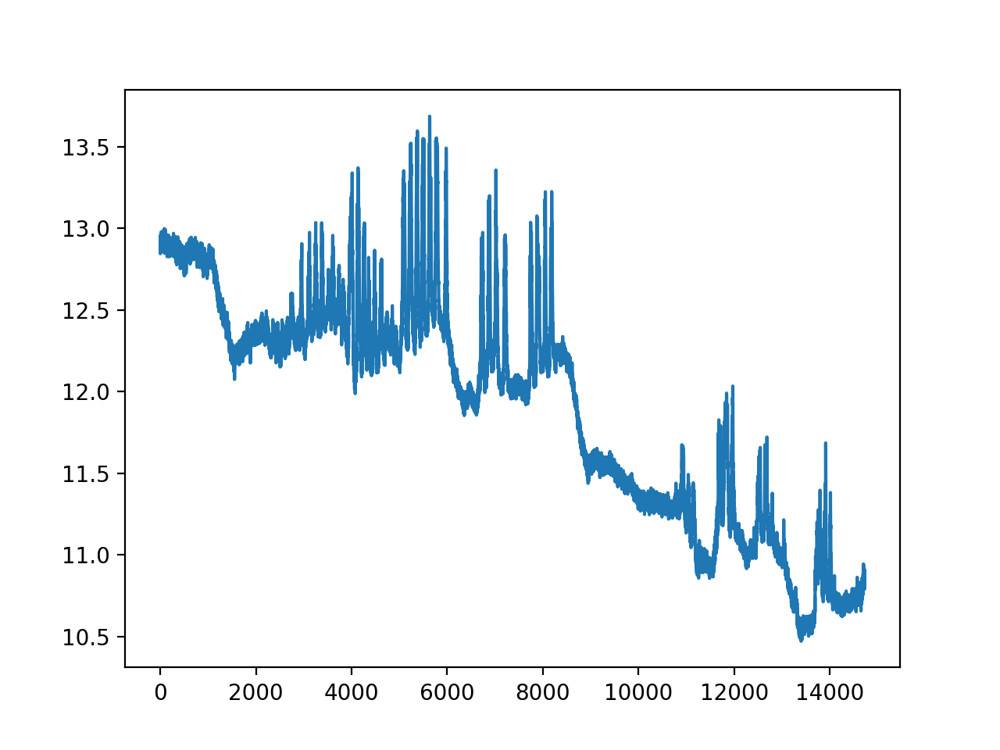

In [245]:
plt.figure()
plt.plot(m_orig.mean((1,2)))

In [248]:
# m_orig.play(magnification = 4)

In [247]:
time.max()/60

8.749510390837857

<IPython.core.display.Javascript object>


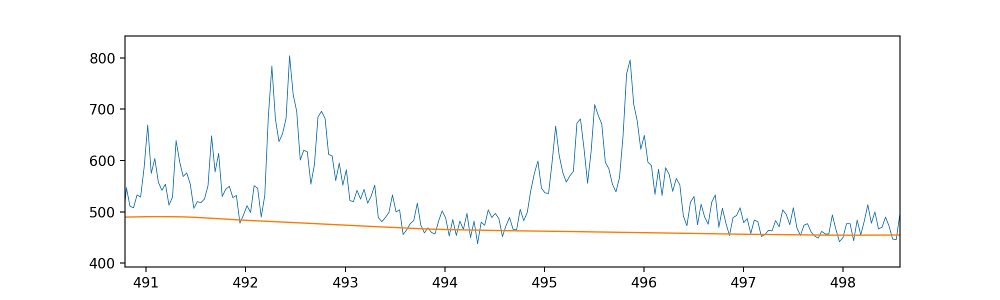

In [249]:
i,j = 32,56
plt.figure(figsize=(10,3))
# x = dMovie[:,i,j]
x = m_orig[ts,i-2:i+3,j-2:j+3].sum((1,2))
xf = lowPass(x,101,101,10,1)
plt.plot(time[ts],x,lw=.6)
plt.plot(time[ts],xf,lw=1)
# plt.fill_between(time[ts],3*m_s[:,i,j],-3*m_s[:,i,j], alpha = .2)

<IPython.core.display.Javascript object>


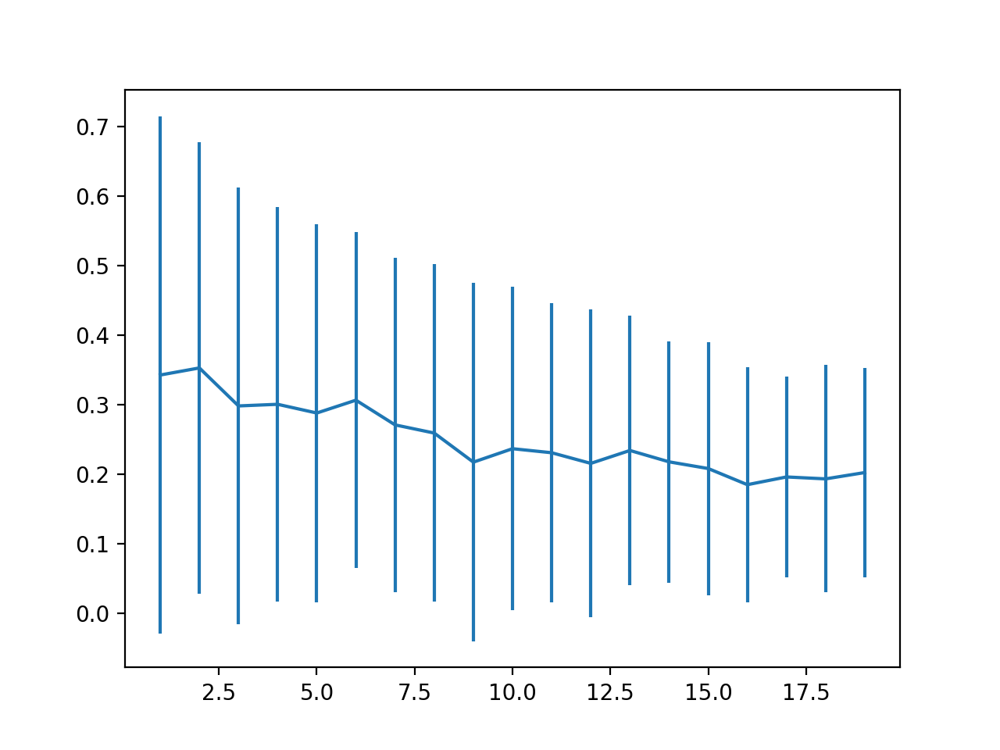

<ErrorbarContainer object of 3 artists>

In [252]:
plt.figure()
tr = np.arange(1,20)
y, ye = autocorr(np.diff(x,0),tr,nsplits=3)
plt.errorbar(tr, y, ye)

In [1638]:
tmax,imax,jmax = np.squeeze(np.where(zMovieBlurred==zMovieBlurred.max()))

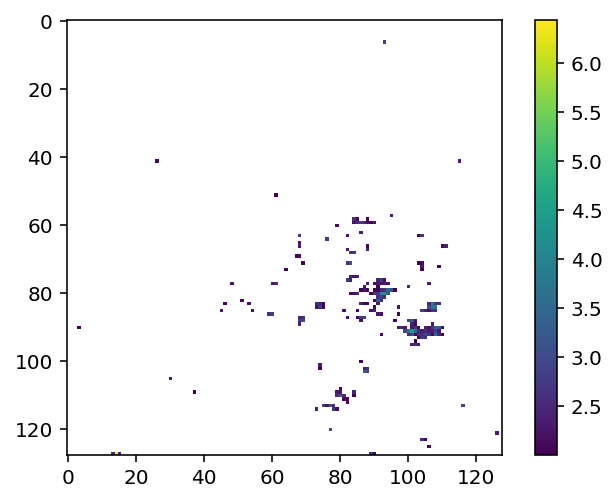

In [1639]:
tmp = zMovieBlurred[tmax].copy()
tmp[tmp<2] = np.nan
plt.imshow(tmp)
plt.colorbar()

In [188]:
def createNNDistanceMatrix(dims):
    from scipy.sparse import dok_matrix
    DistMatrix = dok_matrix((np.prod(dims),np.prod(dims)), dtype=np.int0)

    for i,j in product(range(dims[0]),range(dims[1])):
        for di,dj in product([-1,0,1],[-1,0,1]):
            i1 = i+di
            j1 = j+dj
            if i1<0 or j1<0 or i1>=dims[0] or j1>=dims[1]: continue
    #         d = ((np.array(p0)-np.array(p1))**2).sum()**.5
    #         if d<2:
            DistMatrix[i*dims[0]+j,i1*dims[0]+j1] = 1
    return DistMatrix#.tocsr()

In [1678]:
distMatrix = createNNDistanceMatrix(dims)

In [1529]:
# plt.imshow(DistMatrix.todense())

In [1640]:
tmax

773

In [1641]:
dims= np.array(m_orig.shape[1:])

In [1649]:
(zMovie[::10]<-2.53).mean(), (zMovie[::10]>2.53).mean()

(movie(0.00138102), movie(0.01942383))

In [1655]:
partTs = slice(tmax,tmax+10)
zMovie[partTs].min(), zMovie[partTs].max()

(movie(-3.53187956), movie(12.83431934))

In [1656]:
# movPart = zMovieBlurred[partTs]#.play()
# movPart = zMovie[partTs]#.play()
# (movPart>1.7).astype(int).play()
# dst.norm.cdf(-3)
# (zMovie<-1.7).mean(), (zMovie<-2.53).mean()
tfmatrix = zMovie[partTs]>2.53
# tfMatrix = tfMatrix[:,:,:]

In [1657]:
tfmatrix.shape, tfmatrix.sum()

((10, 128, 128), movie(5899))

In [1679]:
events = getEvents(tfmatrix,distMatrix)

In [1680]:
eventSizes = np.array(list(map(len,events)))

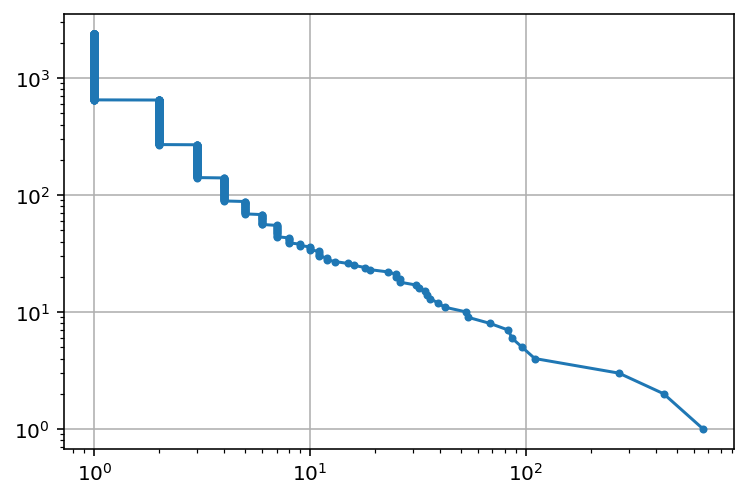

In [1685]:
plt.plot(sorted(eventSizes), 1+np.arange(len(eventSizes))[::-1],".-")
plt.xscale("log")
plt.yscale("log")
plt.grid()

In [1688]:
event = events[np.argmax(eventSizes)]

In [1694]:
getEventBoundaries(events[1005], dims)

array([[ 4,  5],
       [26, 27],
       [21, 22]])

In [ ]:
event = 

In [1689]:
getEventBoundaries(event, dims)

array([[  0,  10],
       [ 75,  97],
       [ 64, 114]])

In [1530]:
# # EventIDTensor = -np.ones_like(tfMatrix,dtype=int)
# EventIDTensor = dok_matrix((len(tfMatrix),DistMatrix.shape[0]), dtype=np.int64)
# iframe = 0

# eventIDs = [np.nan]
# eID = len(eventIDs)
# for i in np.where(tfMatrix[iframe].flatten())[0]:
#     EventIDTensor[iframe,i] = eID
#     eID += 1

# for i in np.where(tfMatrix[iframe].flatten())[0]:
#     js = np.where(DistMatrix[i].todense())[1]
#     surroundingIDs = EventIDTensor[iframe,js].toarray()[0]
#     js = js[surroundingIDs>0]
#     surroundingIDs = surroundingIDs[surroundingIDs>0]
#     newID = surroundingIDs.min()
#     for j in js:
#         EventIDTensor[iframe,j] = newID

# EventIDTensor[iframe] = renumerize(EventIDTensor[iframe])

# plt.imshow(EventIDTensor[iframe].todense().reshape(dims))

# def renumerize(Frame):
#     ks = Frame.keys()#np.array([el[1] for el in ])
#     oldValues = np.unique(list(Frame.values()))
#     newValues = np.arange(len(oldValues))+oldValues.min()
#     old2new = OrderedDict(zip(oldValues,newValues))
#     for k in ks:
#         Frame[k] = old2new[Frame[k]]
#     return Frame

# iframe=1

# for i in np.where(tfMatrix[iframe].flatten())[0]:
#     js = np.where(DistMatrix[i].todense())[1]
    
#     if EventIDTensor[iframe-1,i]
#     EventIDTensor[iframe,i] = eID
#     eID += 1

# tfMatrix.astype(int).play()

In [1663]:
def getEvents(tfMatrix_,DistMatrix_):
    import networkx as nx
    allGraph = dok_matrix((tfMatrix_.size,tfMatrix_.size),dtype=np.int0)
    nc = DistMatrix_.shape[0]

    for iframe in range(len(tfMatrix_)):
        hereActiveCells = np.where(tfMatrix_[iframe].flatten())[0]
        for ic in hereActiveCells:
            nodeID = iframe*nc+ic
            for diframe in [0,1]:
                iframe1 = iframe+diframe
                if iframe1<0: continue
                if iframe1>=len(tfMatrix_): continue
                for el in DistMatrix_[ic].keys():
                    jc = el[1]
                    if tfMatrix_[iframe1].flatten()[jc]:
                        allGraph[iframe1*nc+jc, nodeID] = 1
                        allGraph[nodeID, iframe1*nc+jc] = 1
    #         break
    #     break

    G = nx.from_scipy_sparse_matrix(allGraph)

    events = [cmp for cmp in nx.connected_components(G) 
              if len(cmp)>1 or allGraph[tuple(cmp)*2]]
    return events

In [1624]:
events = sorted(events, key=lambda xi: -len(xi))

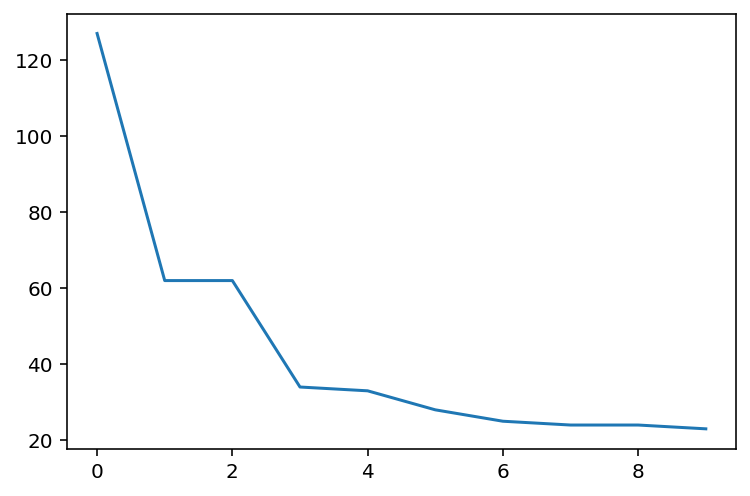

In [1625]:
plt.plot(list(map(len,events[:10])))

In [1626]:
event = events[0]

In [1629]:
eventSlice = tuple(slice(*el) for el in getEventBoundaries(event,dims))

In [1630]:
eventSlice

(slice(0, 6, None), slice(76, 86, None), slice(86, 97, None))

In [1634]:
movPart[eventSlice].play(magnification=4,fr=5)

In [ ]:
tmp = []
for event in events:
    (tmin,tmax),(imin,imax),(jmin,jmax) = getEventBoundaries(event,dims)
    for bound

In [1580]:
event = events[3]

In [1581]:
# coords = np.array([(coord//nc,(coord%nc)//dims[1],(coord%nc)%dims[1]) for coord in event])

In [1582]:
(tmin,tmax),(imin,imax),(jmin,jmax) = getEventBoundaries(event,dims)#np.array([coords.min(0), coords.max(0)+1]).T

In [1583]:
(tmin,tmax),(imin,imax),(jmin,jmax)

((0, 6), (83, 86), (104, 112))

In [1584]:
tfMatrix[tmin:tmax,imin:imax,jmin:jmax].astype(float).play(fr=1, magnification = 10)

In [1606]:
diffMovie[partTs][tmin:tmax,imin:imax,jmin:jmax].astype(float).play(fr=5, magnification = 10,do_loop=True)

ValueError: zero-size array to reduction operation maximum which has no identity

In [1586]:
onlyEvent = np.zeros_like(tfMatrix[tmin:tmax,imin:imax,jmin:jmax].astype(float))

In [1587]:
for coord in coords:
    t,i,j = coord
    t -= tmin
    i -= imin
    j -= jmin
    onlyEvent[t,i,j] = 1

IndexError: index -25 is out of bounds for axis 1 with size 3

In [1564]:
onlyEvent.play(fr=3,magnification = 10)

In [1561]:
zMovie[tmin:tmax,imin:imax,jmin:jmax].astype(float).play(fr=1, magnification = 10)

In [1566]:
def getEventBoundaries(event,spaceDims):
    """in shape: (tmin,tmax),(imin,imax),(jmin,jmax)"""
    nc = np.prod(spaceDims)
    coords = np.array([(coord//nc,(coord%nc)//spaceDims[1],(coord%nc)%spaceDims[1]) for coord in event])
    return np.array([coords.min(0), coords.max(0)+1]).T

In [1241]:
iframe = 1

In [ ]:
EventIDTensor[iframe,js]

In [1067]:
    js = np.where(DistMatrix[i].todense())[1]
    EventIDTensor[iframe,js]
    minimalID
        new = min(EventIDTensor[iframe,i])
    for di,dj in product(range(-1,2),range(-1,2)):
        if dj==di==0: continue
        i1 = i+di
        j1 = j+dj
        if i1<0 or j1<0 or i1>=dims[0] or j1>=dims[1]: continue
        a = tfMatrix[iframe, i , j ]
        b = tfMatrix[iframe, i1, j1]
        if b:
            new = min(a,b)
            EventIDTensor[iframe,i,j]   = new
            EventIDTensor[iframe,i1,j1] = new
            

In [1070]:
np.any(EventIDTensor[0]>=0)

movie(False)

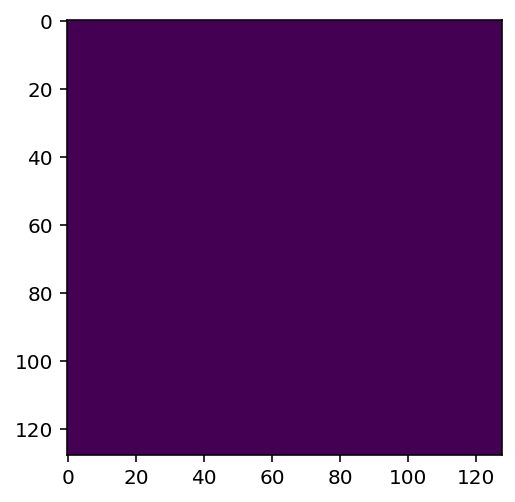

In [1068]:
plt.imshow(EventIDTensor[0])

In [ ]:
# tmp = zMovieBlurred[t].copy()
# tmp[tmp<2] = np.nan
# plt.imshow(tmp)
# plt.colorbar()

In [ ]:
smallChunk = zM

In [966]:
zMovie[10:60].play(magnification=1,do_loop=True, plot_text=True,fr=10)

In [837]:
dMovie.play()

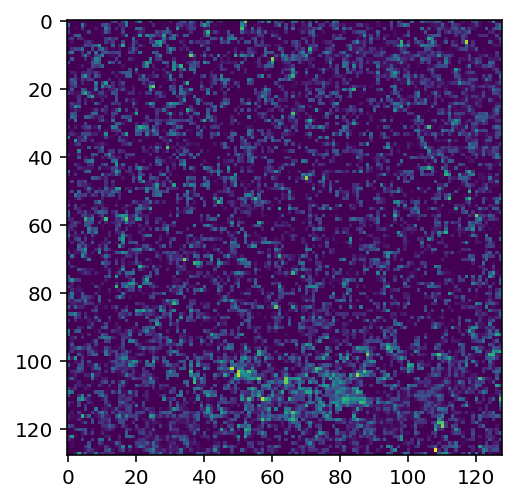

In [897]:
thMovie = zMovie[20:30,100:,40:100]>1

In [898]:
thMovie.astype(float).play(fr=3)

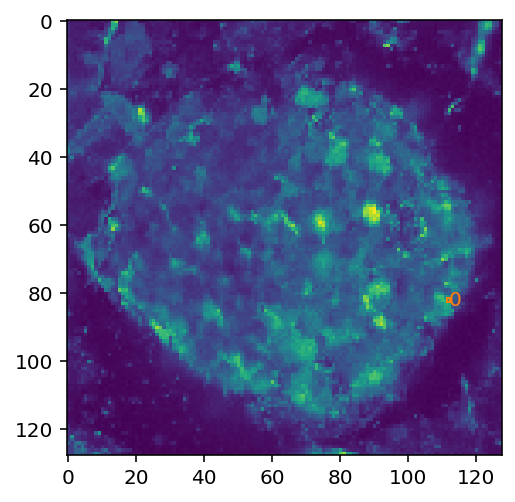

In [902]:
plt.imshow(dMovie.std(0).T)
addRoisToImage([(112,82)],1,ax=plt.gca())

In [927]:
np.diff(m_50, axis=0).play()

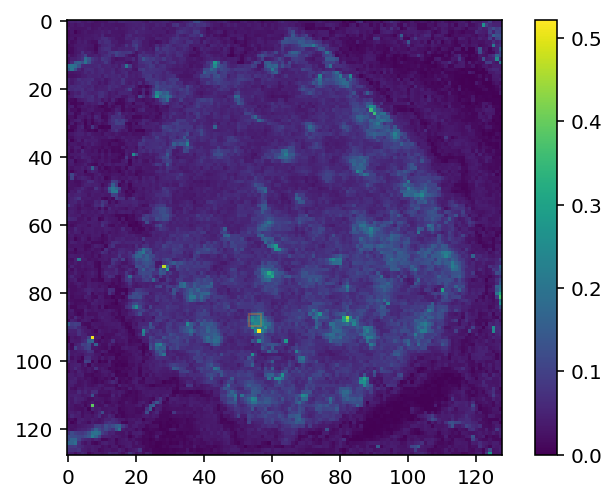

In [953]:
plt.imshow(np.abs(np.diff(m_50[::10], axis=0)).mean(0))
plt.colorbar()
# i,j = 106,87
i,j = 88,55
plt.plot(j,i,"C1s",mfc="none",alpha = .3)

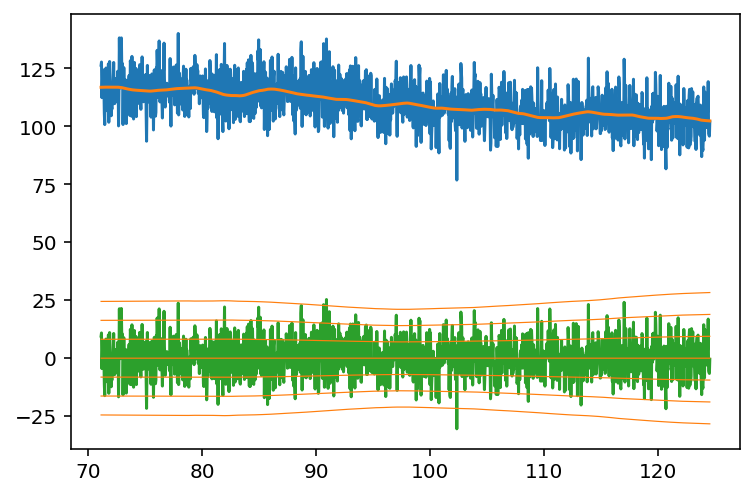

In [956]:
# i,j = 112,82
# plt.plot(time[ts],dMovie[:,i,j])
plt.plot(time[ts],m_orig[ts,i,j])
plt.plot(time[ts],m_50[:,i,j])
plt.plot(time[ts],dMovie[:,i,j])
for n in range(-3,4):
    plt.plot(time[ts],n*m_s[:,i,j],"C1",lw=.6)
#     plt.plot(time[ts],n*m_50[:,i,j]**.5,"C3",lw=.6)
# # plt.plot(time[ts],m_s[:,i,j])

In [ ]:
data = []
for t,i,j in list(np.random.randint((len(m_s),)+stdImg.shape, size = (10000,3)))+[np.array(np.where(filteredMovie==maxf)).T[0]]:
    t = np.maximum(t,dt//2)
    dx = diffMovie    [t-dt//2:t+dt//2,i,j]
    if dx.mean()==0: continue
#     data += [(filteredMovie[t,i,j],dx.std())]
    data += [(filteredMovie[t,i,j],dx.std(),filteredMovie[t,i,j]+dx.mean())]

In [807]:
for i,j in product(range(metadata.X),range(metadata.Y)):
# for i,j in zip(*np.where(stdImg>0)):
    if np.isfinite(m_50[:,i,j]).any(): continue
    m_50[:,i,j] = lowPass(m_orig[ts,i,j],*filterPars)

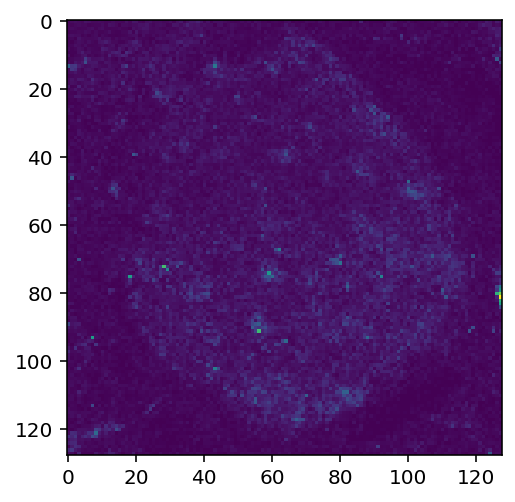

In [810]:
plt.imshow(m_50.std(0))

In [811]:
m_50.play()

In [76]:
assert filteredMovie.min()>-1

In [77]:
filteredMovie.min()

movie(0., dtype=float32)

In [216]:
diffMovie = m_orig-filteredMovie

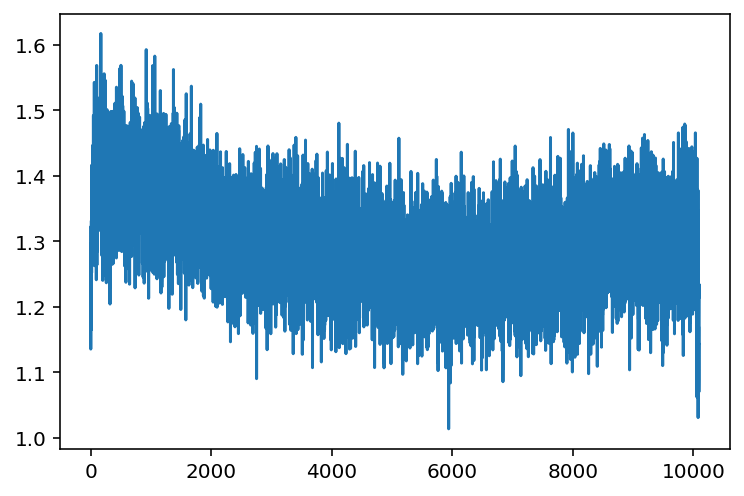

In [230]:
plt.plot(diffMovie[:,-30:,:30].mean((1,2)))

In [232]:
diffMovie[:,-30:,:30].resize(1,1,1/20).play(fr=100,magnification = 3)

In [217]:
diffMedians = np.median(diffMovie,0)

In [218]:
diffP99 = np.percentile(diffMovie,99,axis=0)

In [219]:
# %matplotlib inline

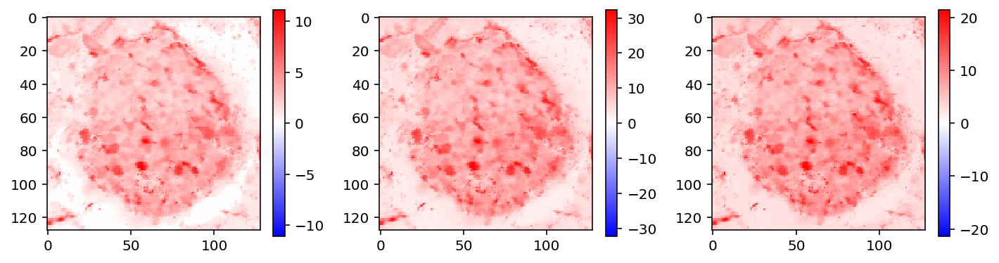

In [233]:
fig, axs = plt.subplots(1,3,figsize=(10,3.5))
for ax,m in zip(axs,[diffMedians, diffP99, diffP99-diffMedians]):
    im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
    plt.colorbar(im,ax=ax,shrink=.7)
fig.tight_layout()
plt.ioff()

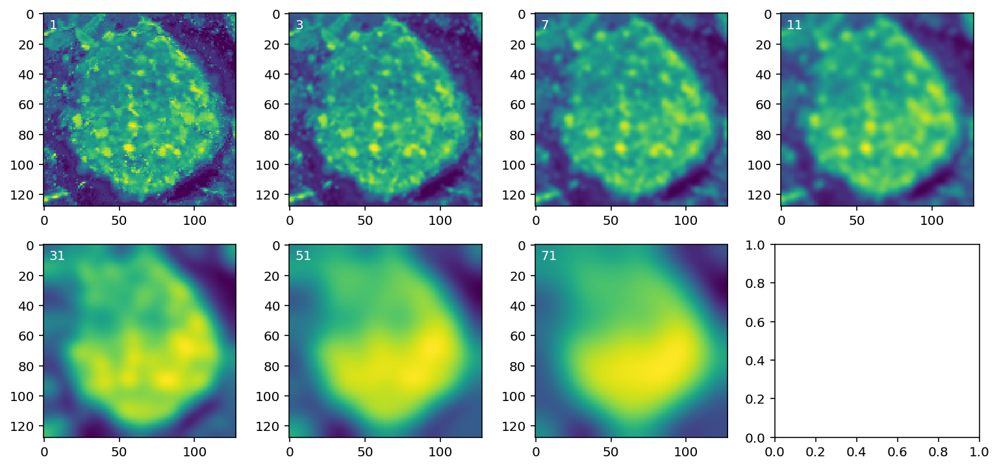

In [222]:
fig, axs = plt.subplots(2,4,figsize=(13,6))
for ax,ks in zip(axs.flat,[1,3,7,11,31,51,71]):
    m = cv2.GaussianBlur(diffP99-diffMedians,(ks,ks),0)
    ax.imshow(m,norm=LogNorm())
    ax.text(0.03,.97,ks,transform=ax.transAxes,color="w",va="top")
#     break

In [245]:
kMask = 81

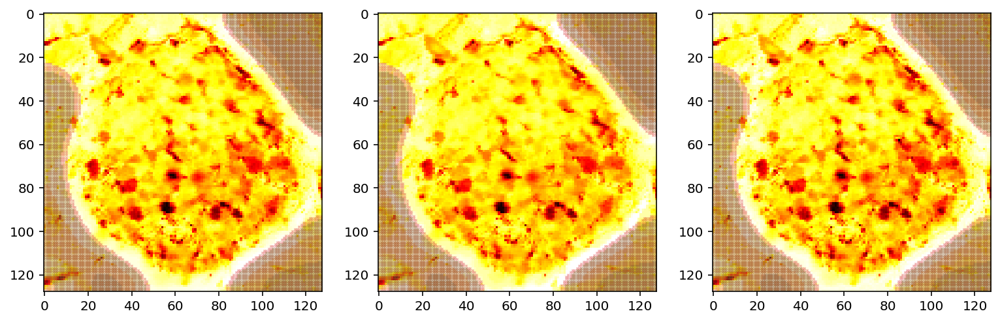

In [267]:
fig, axs = plt.subplots(1,3,figsize=(13,4))
axs[0].imshow(diffP99,cmap="hot_r")
axs[1].imshow(diffMedians,cmap="hot_r")
axs[2].imshow(diffP99-diffMedians,cmap="hot_r")
mask = cv2.GaussianBlur(diffP99-diffMedians,(kMask,kMask),0)

for th in [.4,.45,.5,.52]:
    mt = mask>mask.max()*th

#     x,y = np.where(cv2.Laplacian(mt.astype(float),cv2.CV_64F,)>0)
    x,y = np.where(~mt)
    for ax in axs:
        ax.plot(y,x,"s",ms=1,alpha = .2)
# for ax,ks in zip(axs.flat,[1,3,7,11,31,51,71]):
#     m = cv2.GaussianBlur(diffP99,(ks,ks),0)
#     ax.imshow(m,norm=LogNorm())
#     ax.text(0.03,.97,ks,transform=ax.transAxes,color="w",va="top")
# #     break

In [268]:
thMask = .52
mt = mask>mask.max()*thMask

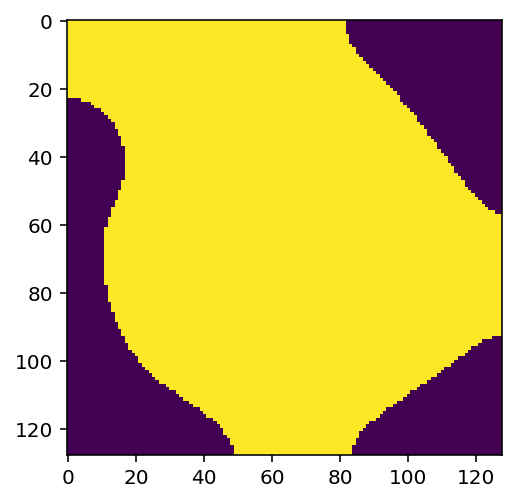

In [269]:
plt.imshow(mt)

In [271]:
diffMovie[(slice(None),)+np.where(~mt)] = 0

In [272]:
diffMovie.play(fr = 100,magnification=4)

In [273]:
diffMedians = np.median(diffMovie,0)

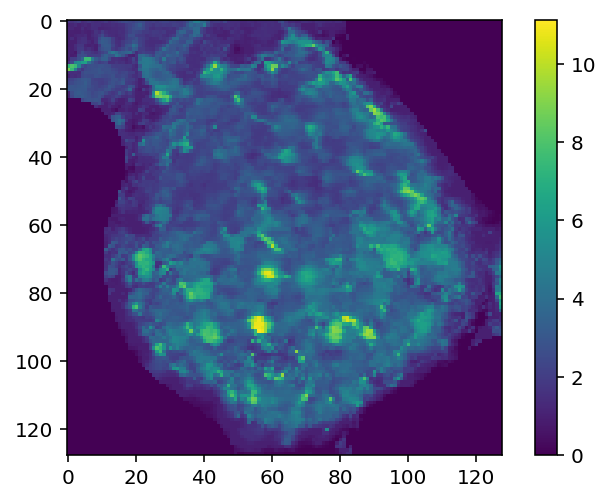

In [274]:
plt.imshow(diffMedians)
plt.colorbar()

In [324]:
# i,j = np.squeeze(np.where(diffMedians==diffMedians.max()))
# i,j = np.squeeze(np.where(diffP99==diffP99.max()))

In [356]:
from scipy.stats import skew

In [358]:
diffSkew = skew(diffMovie,axis=0)

In [389]:
%matplotlib inline

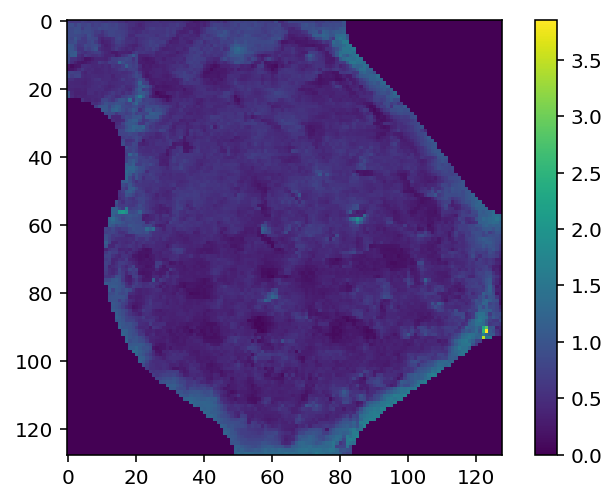

In [390]:
plt.imshow(diffSkew)
plt.colorbar()

In [385]:
stdFiltered = filteredMovie.std(0)

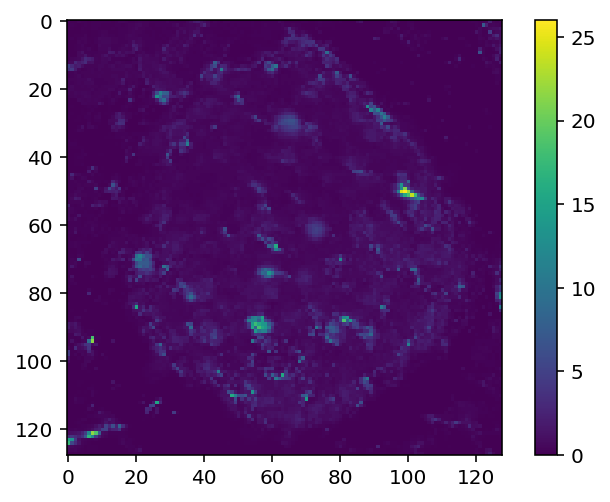

In [391]:
plt.imshow(stdFiltered)
plt.colorbar()

In [1893]:
# plt.hexbin(z**.5,y,norm=LogNorm(),xscale="log",yscale="log")
# plt.grid(which="both")
# plt.plot([])
# plt.plot([y.min(),y.max()],[y.min(),y.max()])
# plt.gca().set_aspect("equal")

In [759]:
def highPartMean(xr_, k_, n_):
    return k_*xr_ + n_

In [82]:
shiftFiltered = pc2meanF(filteredMovie)

<IPython.core.display.Javascript object>


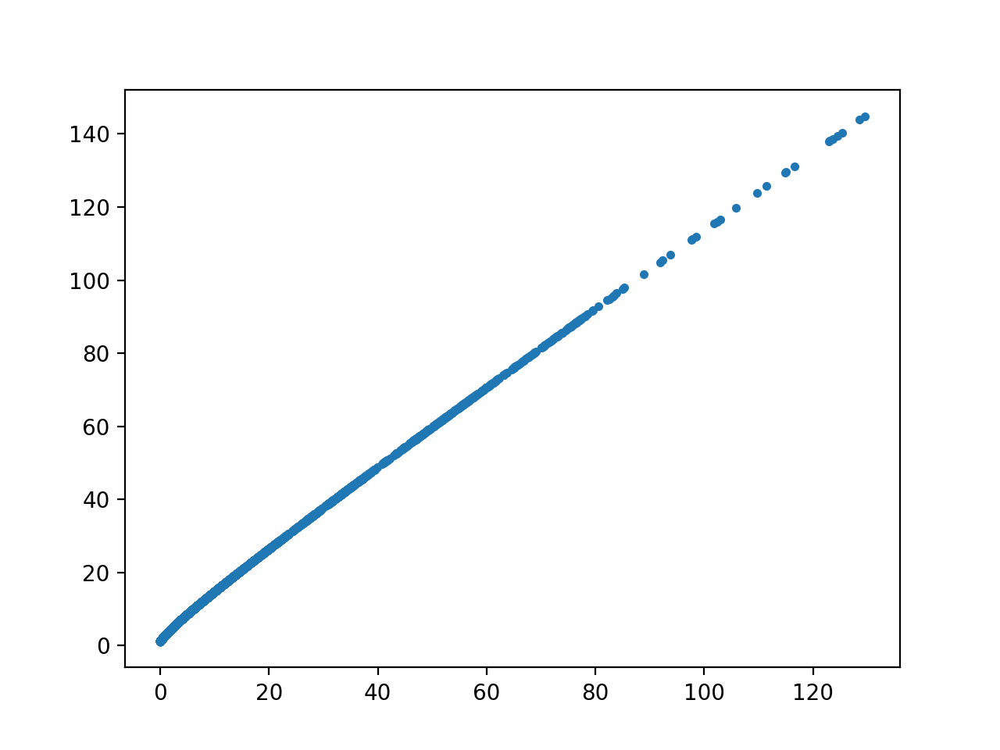

In [112]:
plt.plot(
    filteredMovie[::100,::10,::10].flatten(),
    shiftFiltered[::100,::10,::10].flatten(),
    "."
        )

<IPython.core.display.Javascript object>


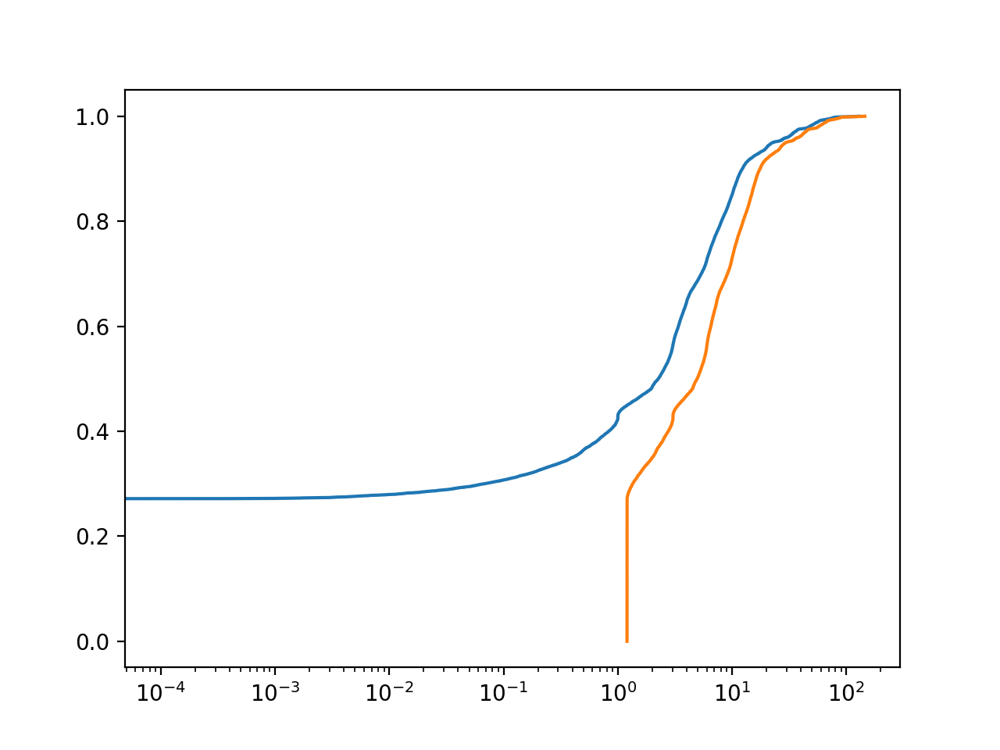

In [83]:
for m in [filteredMovie, shiftFiltered]:
    x = m[::100,::10,::10].flatten()
    plt.plot(sorted(x), np.linspace(0,1,len(x)))
plt.xscale("log")

In [84]:
%matplotlib inline

In [698]:
# filteredMovie.play(fr=30, magnification=4,do_loop=True, plot_text=True)
# filteredMovie.resize(1,1,4./wIron).play(fr=30, magnification=4,do_loop=True, plot_text=True)

In [85]:
diffMovie = m_orig-shiftFiltered

In [86]:
medians = np.median(diffMovie,0)

In [87]:
medians.min(), medians.max()

(movie(-5.68457723), movie(1.29830736))

In [88]:
%matplotlib notebook

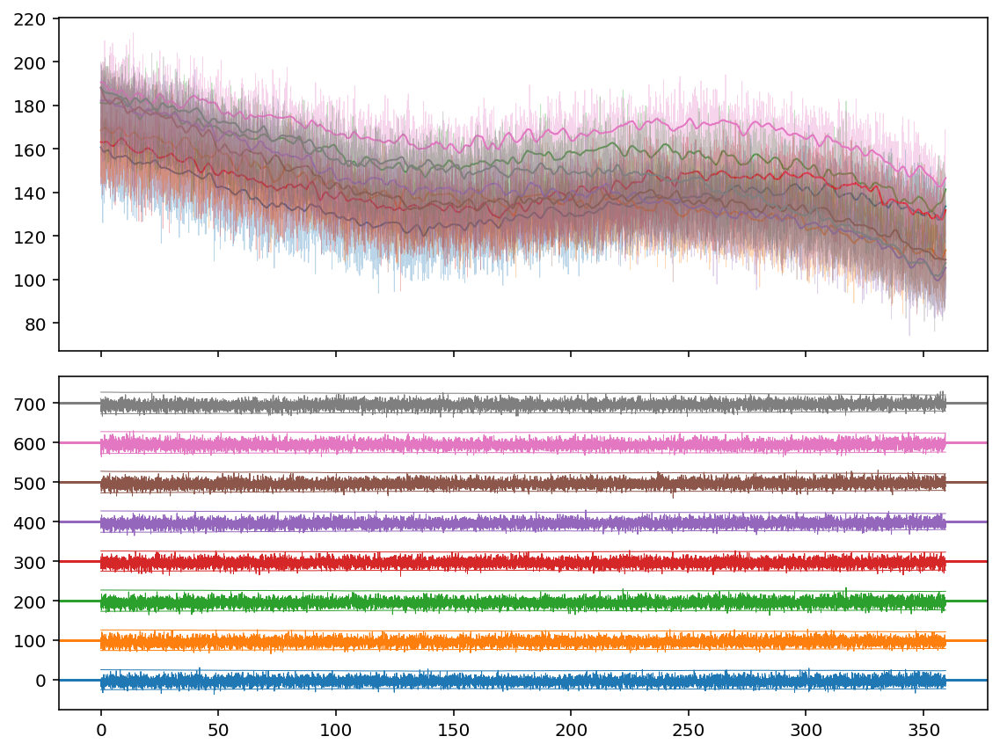

In [157]:
# %%capture
plt.close()
fig, axs = plt.subplots(2,1,figsize=(8,6), sharex=True)
ia = 0
for i,j in zip(*np.where(np.all([-7.1<medians, medians<-4], axis=0))):
#     if ia<3:
#         ia += 1
#         continue
# for di,dj in product([-1,0,1],[-1,0,1]):
#     x = m_orig[:,i+di,j+dj]
    x = m_orig[:,i,j]
#     xf = filteredMovie[:,i,j]
    xf = shiftFiltered[:,i,j]
    axs[0].plot(time,x,c="C%i"%ia,lw=.4,alpha = .3)
    axs[0].plot(time,xf,label=ia,c="C%i"%ia,lw=1)
    yoffset = 100*ia
    axs[1].plot(time,x-xf+yoffset,label=ia,c="C%i"%ia,lw=.5)
    axs[1].plot(time,yoffset+2*xf**.5,c="C%i"%ia,lw=.5)
    axs[1].plot(time,yoffset-2*xf**.5,c="C%i"%ia,lw=.5)
    axs[1].axhline(yoffset,color="C%i"%ia)
#     axs[1]
    ia += 1
    if ia>10:
        break
# plt.xlim(time.max()-100,time.max())
fig.tight_layout()

In [159]:
rnsd = runningStd(diffMovie[:,i,j],2*wIron+1)
rnmn = runningAverage(diffMovie[:,i,j],2*wIron+1)

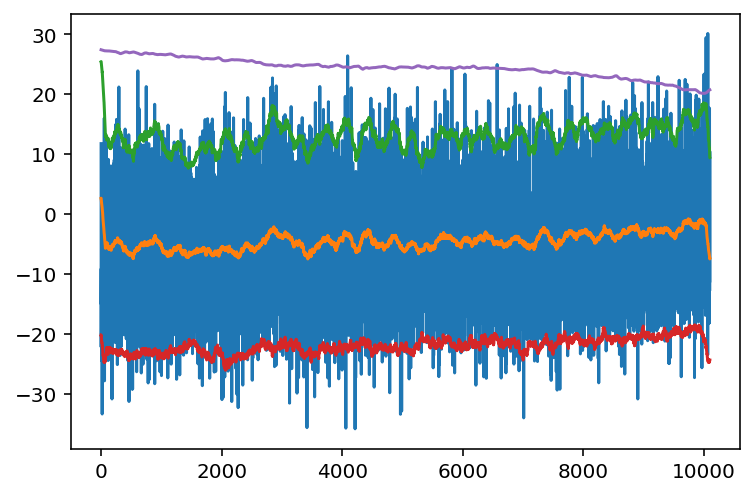

In [160]:
plt.plot(diffMovie[:,i,j])
plt.plot(rnmn)
plt.plot(rnmn+2*rnsd)
plt.plot(rnmn-2*rnsd)
plt.plot(2*xf**.5)

In [700]:
# ts = slice(2800,3200)
# tmp = diffMovie[ts]-diffMovie[ts].min()
# tmp = tmp/tmp.max()*1.3
# movie(np.concatenate([
#     m_orig[ts]/filteredMovie[ts].max(),
#     np.ones_like(m_orig[ts,:2,:]),
#     filteredMovie[ts]/filteredMovie[ts].max(),
#     np.ones_like(m_orig[ts,:2,:]),
#     tmp,
# ],axis=1)).play(magnification=4, fr=100,do_loop=True)

In [164]:
stdFiltered  = shiftFiltered.std(0)
meanFiltered = shiftFiltered.mean(0)

In [165]:
%%capture
cc = shiftFiltered.local_correlations(0,0)

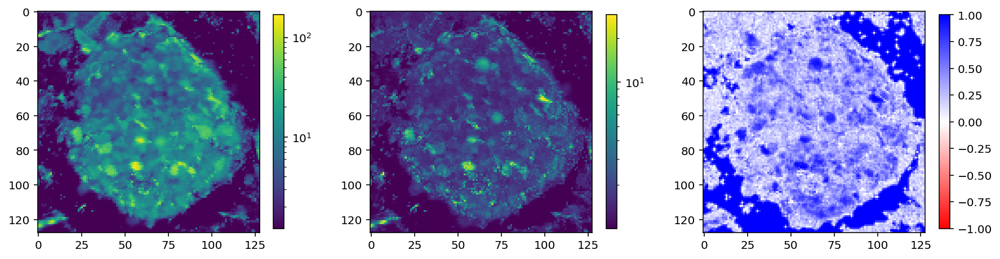

In [166]:
fig, axs = plt.subplots(1,3,figsize=(15,5))
im = axs[0].imshow(meanFiltered, norm=LogNorm())
plt.colorbar(im,ax=axs[0],shrink=.7)
im = axs[1].imshow(1+stdFiltered, norm=LogNorm())
plt.colorbar(im,ax=axs[1],shrink=.7)
try:
    im = axs[2].imshow(cc, cmap="bwr_r", vmin=-1,vmax=1)
    plt.colorbar(im,ax=axs[2],shrink=.7)
except: pass

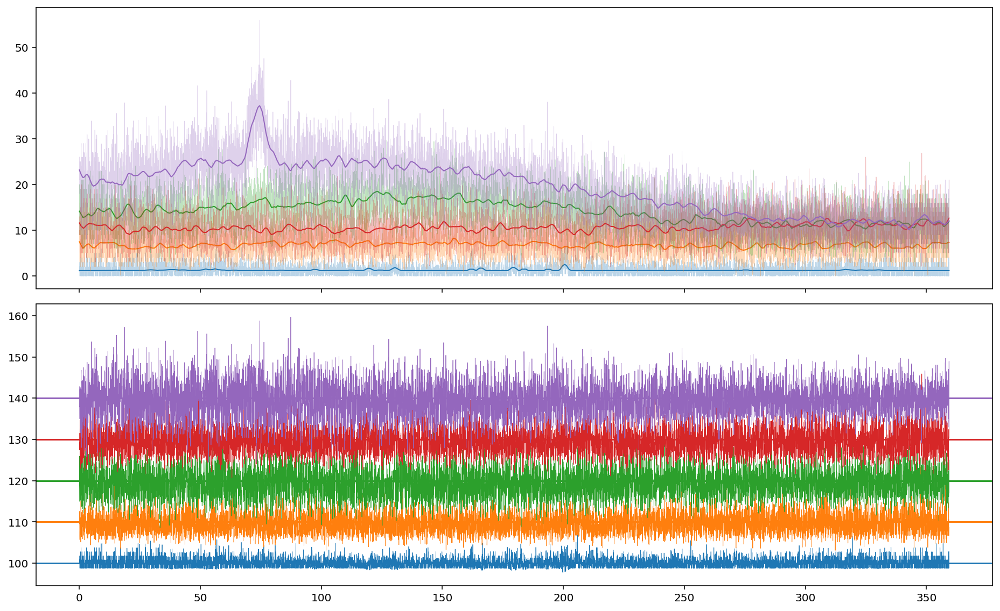

In [167]:
# %%capture
plt.close()
fig, axs = plt.subplots(2,1,figsize=(13,8), sharex=True)
for roi in range(10,15):
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = m_orig[:,i,j].copy()
    axs[0].plot(time,x,c="C%i"%roi,lw=.4,alpha = .3)
    xf = shiftFiltered[:,i,j].copy()
    axs[0].plot(time,xf,label=roi,c="C%i"%roi,lw=1)
    yoffset = 10*roi
    axs[1].plot(time,x-xf+yoffset,label=roi,c="C%i"%roi,lw=.4)
    axs[1].axhline(yoffset,color="C%i"%roi)
fig.tight_layout()

In [168]:
tmp = np.abs(stdFiltered-3.5)
i,j = np.squeeze(np.where(tmp==tmp.min()))

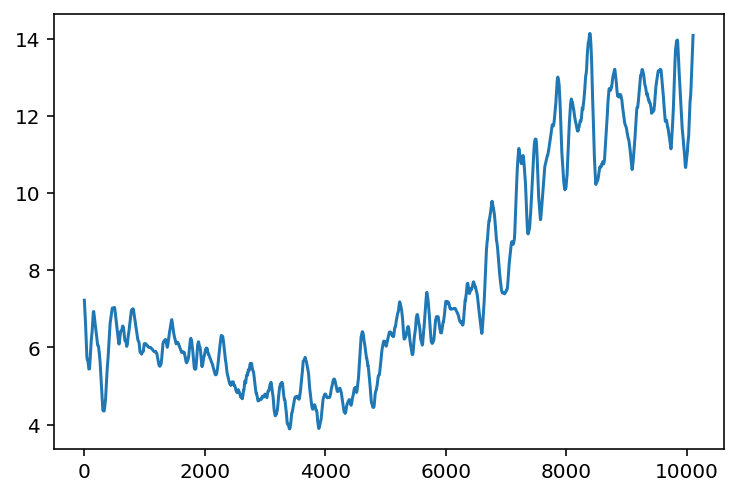

In [169]:
plt.plot(filteredMovie[:,i,j])

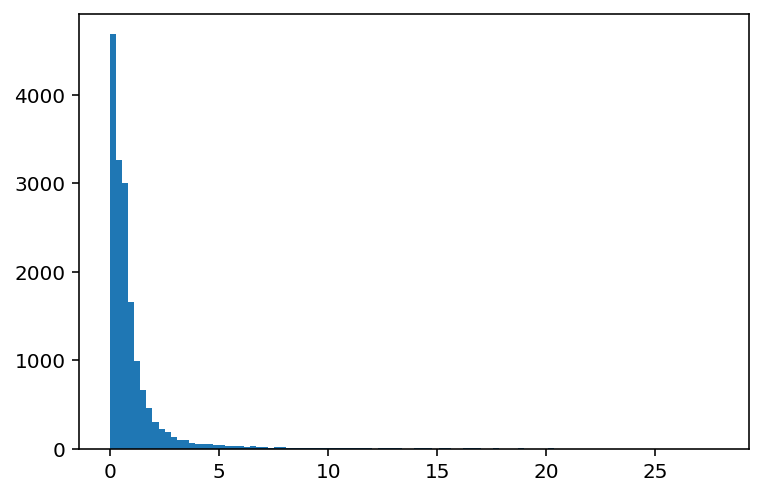

In [170]:
plt.hist(stdFiltered.flatten(),100);

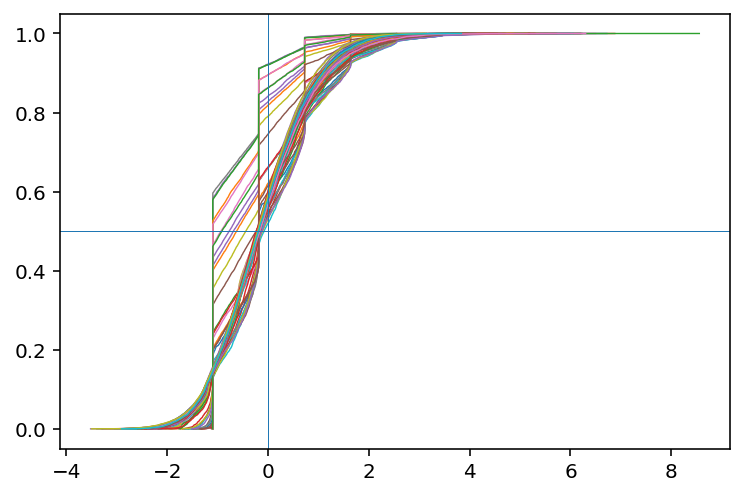

In [171]:
for roi in range(0,100):
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = diffMovie[:,i,j]/shiftFiltered[:,i,j]**.5
#     sd = 
#     plt.hist(x,1000,lw=.4,histtype="step",density=True,log=True)
    plt.plot(sorted(x),np.linspace(0,1,len(x)),lw=.7,color="C%i"%roi)
plt.axhline(0.5,lw=.5)
plt.axvline(0,lw=.5)

In [172]:
# # %%capture
# plt.close()
# fig, axs = plt.subplots(2,1,figsize=(13,10), sharex=True)
# ia = 0
# for roi in range(200):
#     np.random.seed(roi)
#     i,j = np.random.choice(stdImg.shape[0],size=2)
#     x = m_orig[:,i,j]
#     if sum(x>14)<10: continue
#     xf = filteredMovie[:,i,j].copy()
# #     axs[0].plot(time,x,c="C%i"%roi,lw=.4,alpha = .3)
#     axs[0].plot(time,xf,label=roi,c="C%i"%ia,lw=1)
#     yoffset = 20*ia
#     axs[1].plot(time,x-xf+yoffset,label=roi,c="C%i"%ia,lw=.4)
#     axs[1].axhline(yoffset,color="C%i"%ia)
#     ia += 1
# fig.tight_layout()
# axs[1].set_xlim(0,time.max())

In [174]:
ts = slice(2800,3100)
# diffMovie[ts].play(fr=100,
#          q_max=100,
#          q_min=0,
#          plot_text=True,
#          magnification=3,)

In [212]:
zMovie = (diffMovie[ts]+1)/(shiftFiltered[ts])**.5

In [230]:
n,s = 3,.45
z = np.zeros((5,5))
z[len(z)//2,len(z)//2] = 1
zb  = cv2.GaussianBlur(z,ksize=(n,n),sigmaX=s,sigmaY=s)
zb1 = cv2.GaussianBlur(z,ksize=(n,1),sigmaX=s,sigmaY=s)
with np.printoptions(precision=3, suppress=True):
    print (zb)
    print (zb1)



[[0.    0.    0.    0.    0.   ]
 [0.    0.005 0.062 0.005 0.   ]
 [0.    0.062 0.731 0.062 0.   ]
 [0.    0.005 0.062 0.005 0.   ]
 [0.    0.    0.    0.    0.   ]]
[[0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]
 [0.    0.072 0.855 0.072 0.   ]
 [0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]]


In [227]:
#in time 
nt,st = 5, .55
zMovie = movie(cv2.GaussianBlur(
    zMovie.reshape((len(zMovie),-1)),ksize=(nt,1),sigmaX=st, sigmaY=0
).reshape(zMovie.shape))

In [216]:
# in space
zMovie.gaussian_blur_2D(n,n,s,s);

In [206]:
# zMovie[zMovie<2]=2
# zMovie[zMovie>7]=7

In [217]:
zMovie.play(fr=15,
         q_max=100,
         q_min=0,
         plot_text=True,
         magnification=3,)

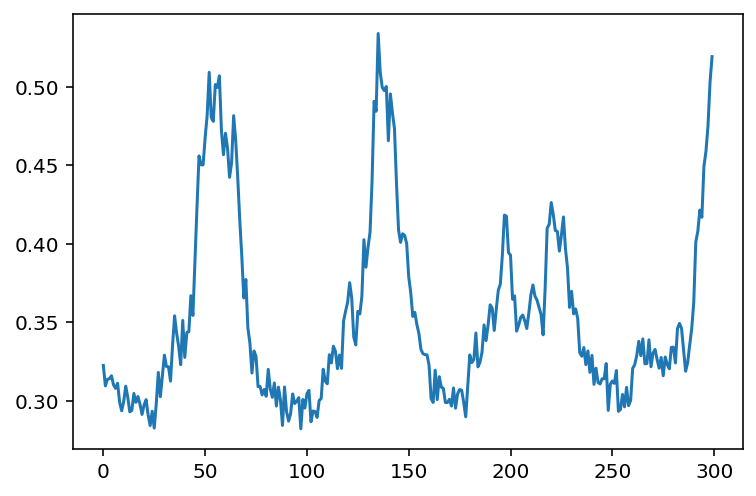

In [218]:
plt.plot(zMovie.mean((1,2)))

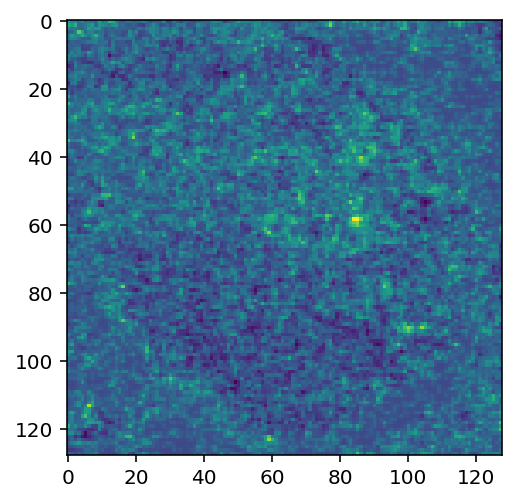

In [219]:
plt.imshow(zMovie[140])

In [519]:
zMovie.min(),zMovie.max()

(movie(-3.51472612), movie(8.61628849))

In [520]:
# tmp = diffMovie.copy()


In [522]:
ts = slice(2000,3000)
diffMovie[ts].play(fr=100,
         q_max=10.,
         q_min=0,
         plot_text=True,
         magnification=3,)

In [506]:
highZ = np.where(zMovie>5)

In [507]:
highZ

(array([    0,     0,     1, ..., 15147, 15150, 15151]),
 array([ 45, 116,   5, ...,  99, 102,   3]),
 array([115, 126,  90, ..., 120, 127,  97]))

In [498]:
t,i,j = np.squeeze(np.where(zMovie==zMovie.max()))

In [504]:
i,j

(6, 123)

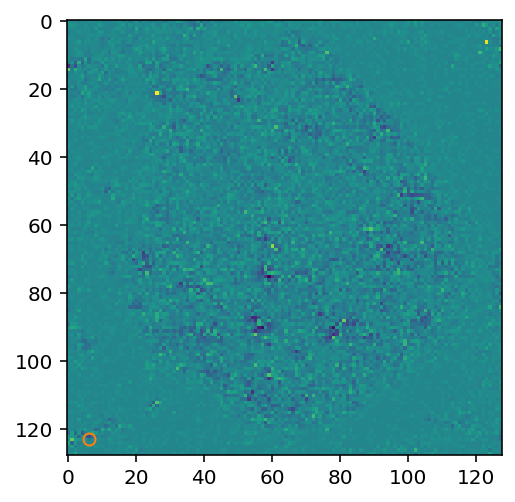

In [503]:
plt.imshow(diffMovie[t])
plt.plot(i,j,"C1o", mfc="none")

In [500]:
diffMovie[t-100:t+100].play(fr=50)

In [481]:
(zMovie>3).sum()

movie(702648)

In [484]:
diffMovie[2000:3000].play(fr=300)

In [525]:
tmp = np.clip(zMovie[2000:3000],3,8)
tmp = tmp-tmp.min()
tmp = 1-tmp/tmp.max()
tmp.play(fr=100,
         q_max=100,
         q_min=0,
         plot_text=True,
         magnification=3,)

# Other Important

### Correct for median/mean

In [174]:
PredictedSigmas = np.zeros_like(meanImg)
PredictedLocs   = np.zeros_like(meanImg)
# for i,j in product(np.arange(metadata.X),np.arange(metadata.Y)):
for i,j in np.array(np.where(np.isfinite(filteredMovie[0]))).T:
    lc,sg = predictLocSd(diffMovie[:,i,j])
#     diffMovie[:,i,j] -= lc
#     filteredMovie[:,i,j] += lc
    PredictedSigmas[i,j] = sg
    PredictedLocs  [i,j] = lc

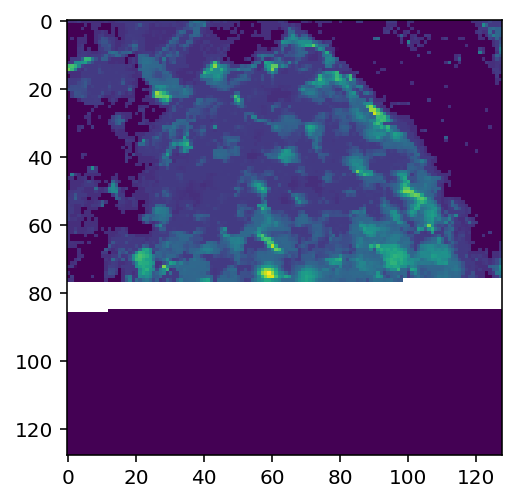

In [175]:
plt.imshow(PredictedLocs)

In [ ]:
filteredMovie.mean(0).f

In [442]:
medians = np.median(diffMovie,axis=0)

In [445]:
filteredMovie += medians
diffMovie     -= medians

In [446]:
diffMovie.max()

movie(62.9608019)

In [447]:
diffMovie.play(fr=200, magnification=4,do_loop=True,q_max=99.8)

In [523]:
filteredMovie.min()

movie(-0.82997036, dtype=float32)

In [358]:
tmp = diffMovie-diffMovie.min()
tmp = np.minimum(tmp,np.percentile(tmp,99.9))

In [363]:
movie(np.concatenate([
    filteredMovie,
    np.ones_like(m_orig[:,:,:2])*m_orig.max(),
    tmp/tmp.max()*filteredMovie.max(),
],axis=2)).play(magnification=3, fr=200,do_loop=True)

In [368]:
tmp = filteredMovie[100:200]
cf = tmp.local_correlations(1,0)

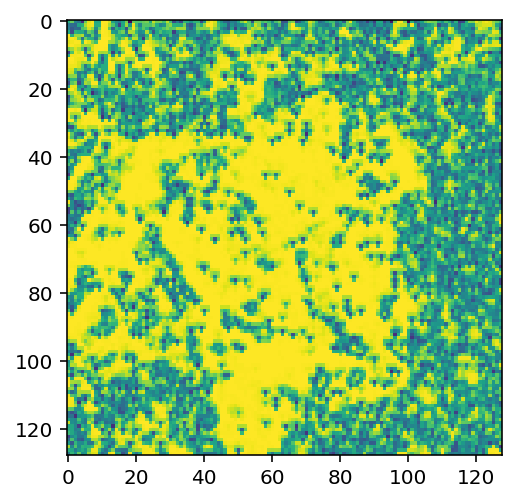

In [369]:
plt.imshow(cf.T)

In [449]:
z_movie = diffMovie/filteredMovie**.5

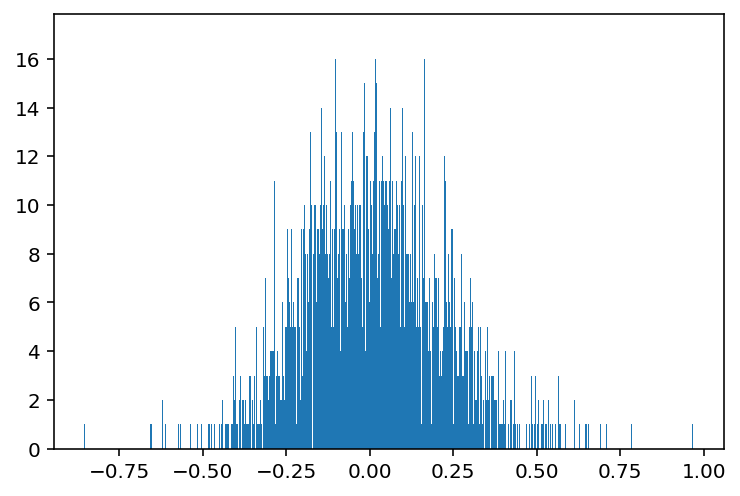

In [450]:
plt.hist(z_movie[:,0,0], 1000);

In [91]:
rnd = 0

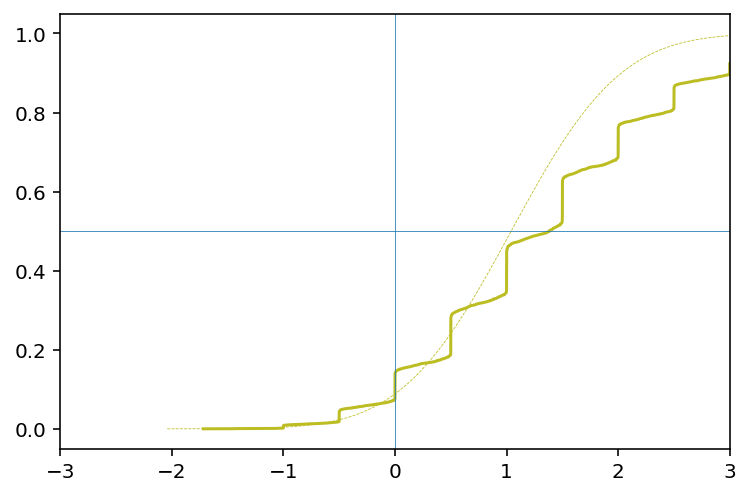

In [94]:
for rnd in range(rnd+1,1000):
    np.random.seed(rnd)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = diffMovie[:,i,j]
    lc,sg = predictLocSd(x)
    if np.abs(lc-np.median(x))>.3:
        plt.plot(sorted(x), np.linspace(0,1,len(x)),"C%i"%(rnd%10))
        xr = np.linspace(lc-4*sg,lc+4*sg,1000)
        plt.plot(xr,dst.norm.cdf(xr,loc=lc,scale=sg),"C%i--"%(rnd%10),lw=.4)
#         plt.plot(ps,sfs,".")
        break
#     break
plt.xlim(-3,3)
plt.axhline(.5,lw=.4)
plt.axvline(0,lw=.4)

In [517]:
i,j

(124, 38)

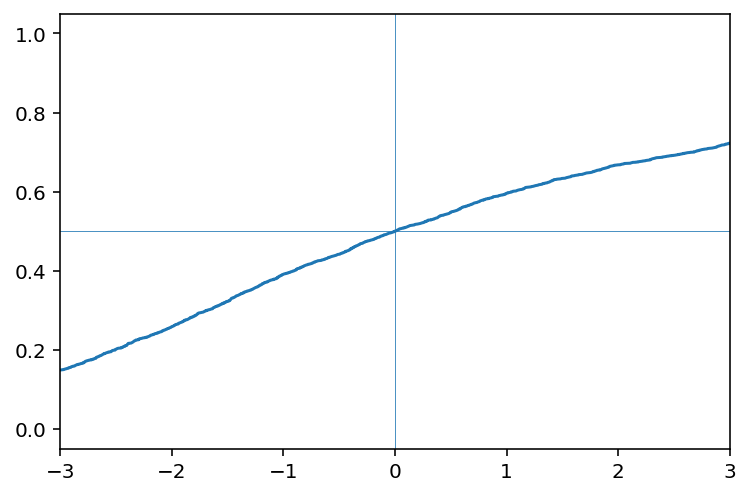

In [522]:
plt.plot(sorted(diffMovie[:,i,j]), np.linspace(0,1,len(x)))
plt.xlim(-3,3)
plt.axhline(.5,lw=.4)
plt.axvline(0,lw=.4)

In [493]:
predictLocSd(diffMovie[:,i,j])

(-0.3615301651859033, 0.8173868698855067)

In [494]:
diffMovie[:,i,j] -= lc

In [495]:
filteredMovie[:,i,j] += lc

In [512]:
[(i,j) for i,j in product(np.arange(3),np.arange(3))]

[(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2), (2, 0), (2, 1), (2, 2)]

In [537]:
PredictedSigmas = np.zeros_like(meanImg)
PredictedLocs   = np.zeros_like(meanImg)
for i,j in product(np.arange(metadata.X),np.arange(metadata.Y)):
    lc,sg = predictLocSd(diffMovie[:,i,j])
#     diffMovie[:,i,j] -= lc
#     filteredMovie[:,i,j] += lc
    PredictedSigmas[i,j] = sg
    PredictedLocs  [i,j] = lc

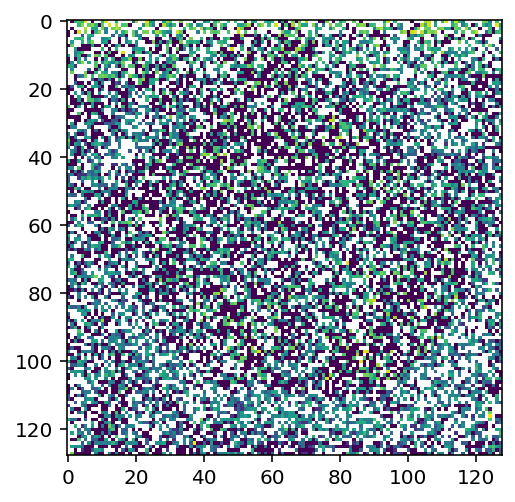

In [538]:
plt.imshow(np.array(PredictedLocs), norm=LogNorm())

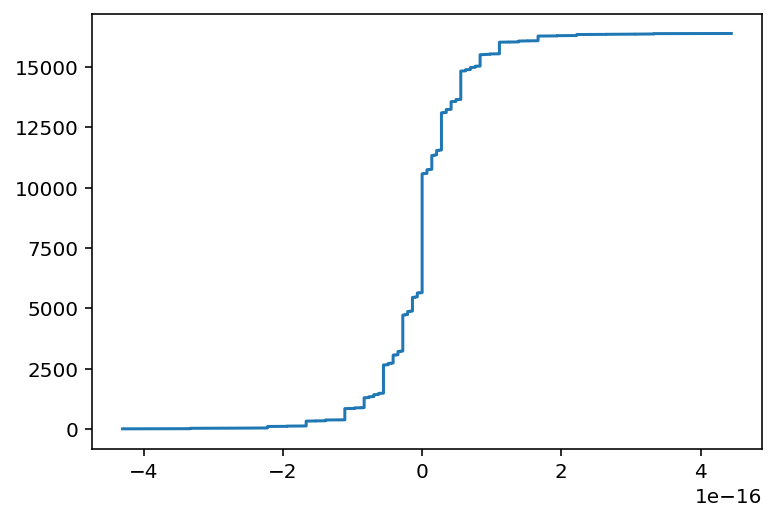

In [539]:
plt.plot(sorted(PredictedLocs.flatten()), np.arange(PredictedLocs.size))

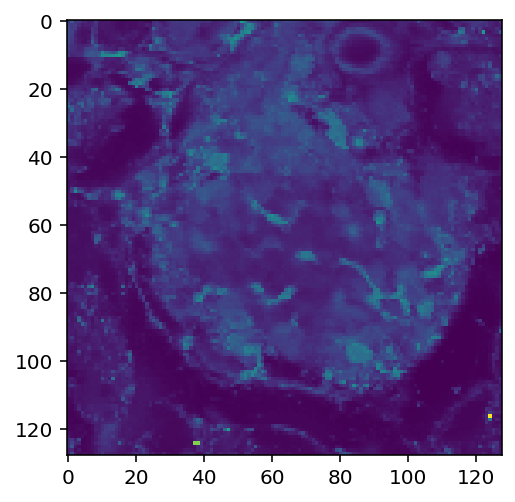

In [542]:
plt.imshow(PredictedSigmas)

In [547]:
# plt.plot(meanImg.flatten()**.5,PredictedSigmas.flatten(),".")
# plt.gca().set_aspect("equal")
# plt.grid()

In [548]:
stdFiltered = filteredMovie.std(0)

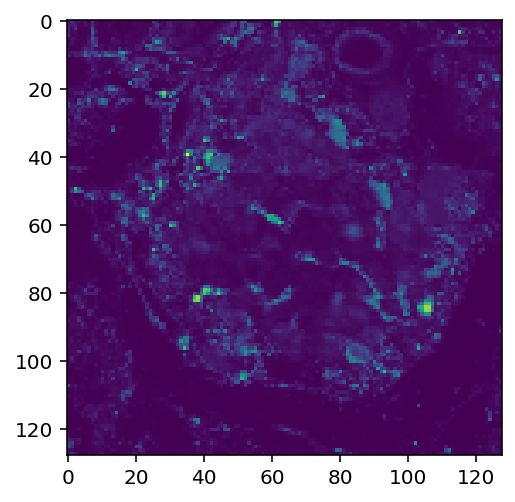

In [550]:
plt.imshow(stdFiltered)

In [553]:
filteredMovie.reshape((-1,meanImg.size)).shape

(2878, 16384)

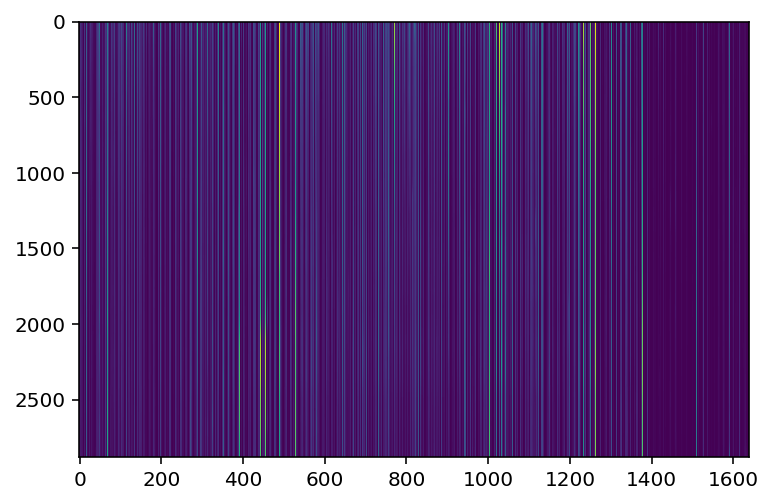

In [552]:
plt.imshow(filteredMovie.reshape((-1,meanImg.size))[:,::10])
plt.gca().set_aspect("auto")

In [ ]:
cc0 = filteredMovie.local_correlations(1,0)
cc1 = diffMovie.local_correlations(1,0)

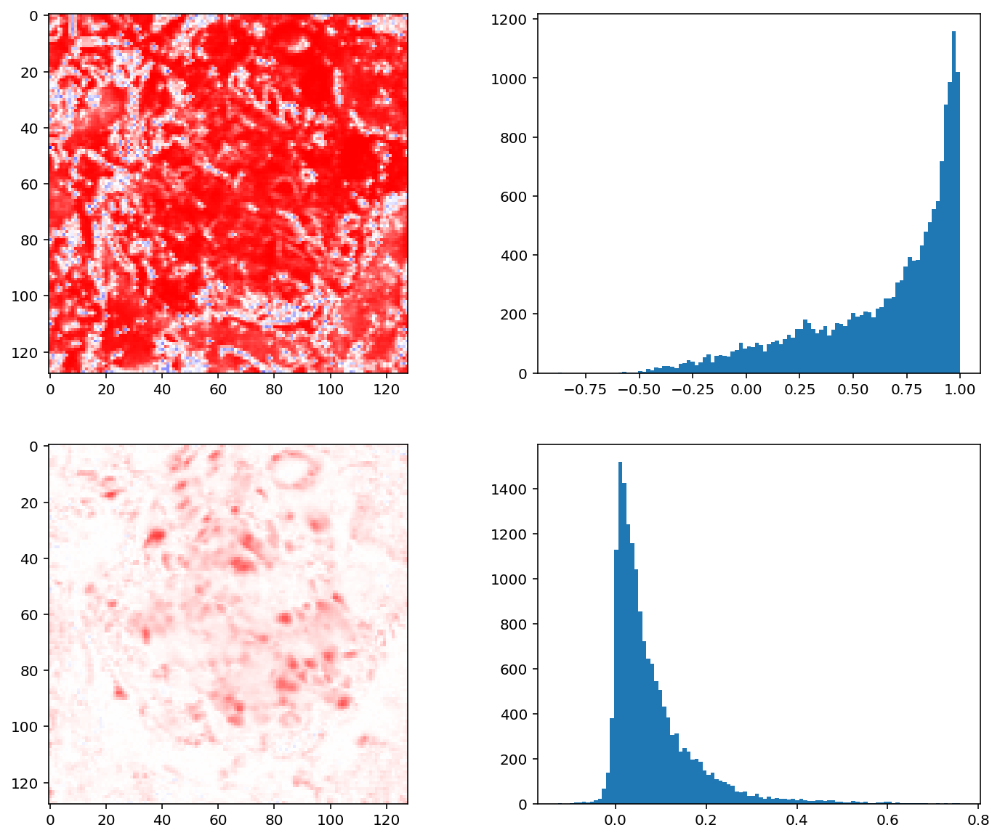

In [561]:
fig, axs = plt.subplots(2,2,figsize=(12,10))
for axx,cc in zip(axs,[cc0,cc1]):
    axx[0].imshow(cc,cmap="bwr",vmin=-1,vmax=1)
    axx[1].hist(cc.flatten(),100);

In [564]:
tmp = np.zeros(meanImg.shape+(3,))

In [568]:
tmp[:,:,0] = cc0
tmp[:,:,1] = cc1
tmp[:,:,2] = -cc0

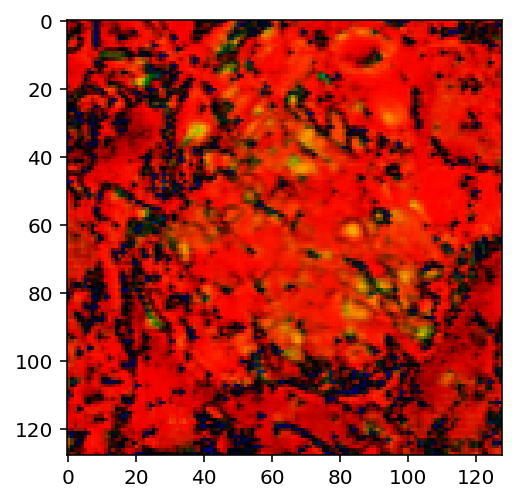

In [569]:
plt.imshow(tmp)

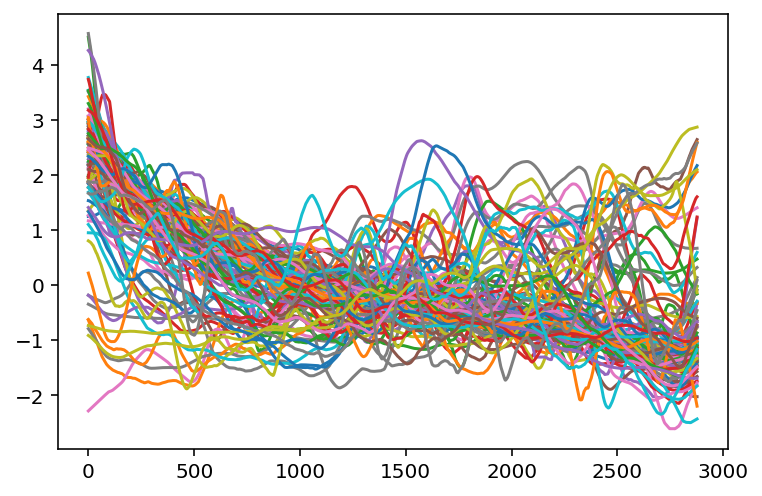

In [575]:
for rnd in range(100):
    np.random.seed(rnd*10)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = filteredMovie[:,i,j].copy()
    x = x-x.mean()
    x /= x.std()
    plt.plot(x)

### analyse fast (for a patch)

### analyse fast (for all?)

In [1218]:
filteredMovie.shape

(2878, 128, 128)

In [1219]:
# choose subset of frames within which the background is assumed not to change
del ts

In [1220]:
del meanImg,stdImg

In [1221]:
expSDall = filteredMovie**.5/tWin

In [1227]:
n,s = 3,.45

z = np.zeros((7,7))
z[len(z)//2,len(z)//2] = 1
zb = cv2.GaussianBlur(z,ksize=(n,n),sigmaX=s,sigmaY=s)

with np.printoptions(precision=3, suppress=True):
    print (zb)


[[0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.005 0.062 0.005 0.    0.   ]
 [0.    0.    0.062 0.731 0.062 0.    0.   ]
 [0.    0.    0.005 0.062 0.005 0.    0.   ]
 [0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.    0.    0.   ]]


In [1229]:
snrAll = diffMovie.copy()
snrAll.gaussian_blur_2D(n,n,s,s);
snrAll = snrAll/expSDall

In [1259]:
snrAll.min()

movie(-11.95911636)

In [1236]:
plt.grid?

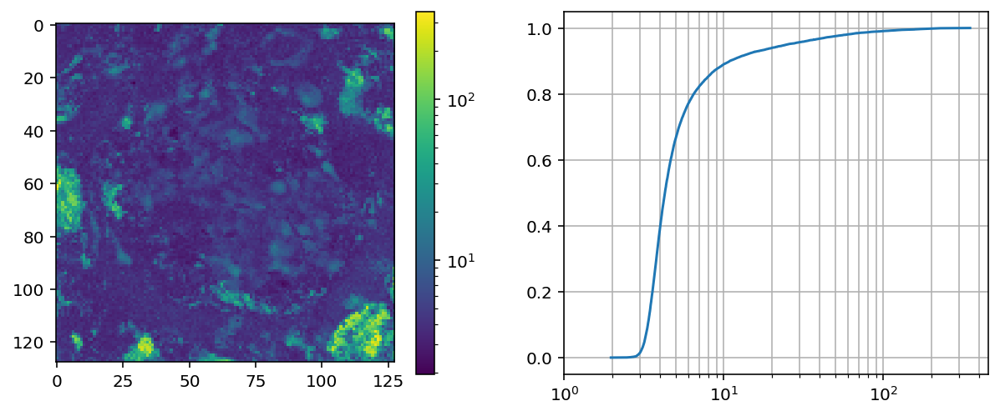

In [1237]:
x = snrAll.max(0) 
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(x, norm=LogNorm())
plt.colorbar()
plt.subplot(122)
# plt.hist(x.flatten(),1000, log=True);
x = x.flatten()
plt.plot(sorted(x), np.linspace(0,1,len(x)))
plt.xscale("log")
plt.xlim(1)
plt.grid(which="both")

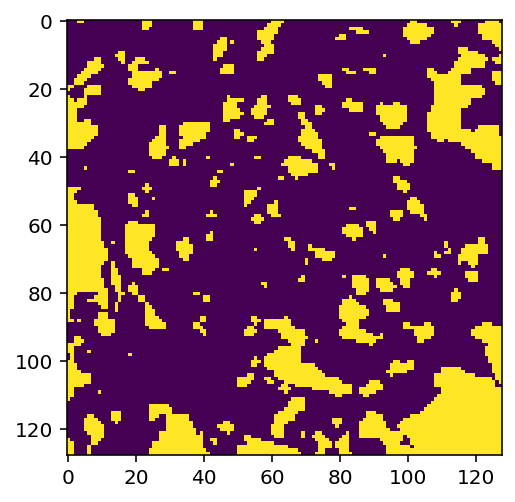

In [1247]:
x = movie(np.array([snrAll.max(0)])).gaussian_blur_2D(3,3,0,0);
plt.imshow(x[0]>6)

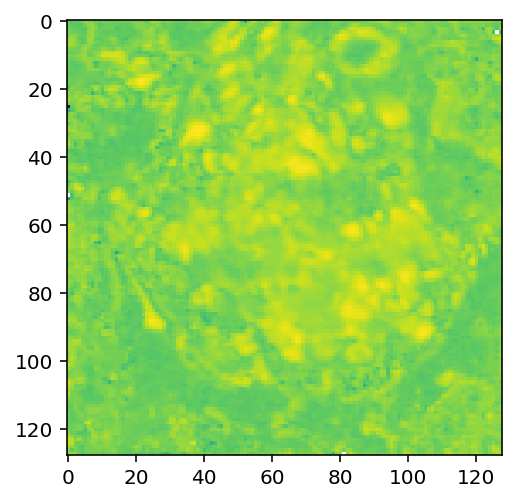

In [1248]:
plt.imshow(snrAll.local_correlations(1,0),norm=LogNorm())

In [1251]:
movie.play?

In [1258]:
tmp = np.clip(snrAll[:],2,8)
tmp = tmp-tmp.min()
tmp = 1-tmp/tmp.max()
tmp.play(fr=100,
         q_max=100,
         q_min=0,
         plot_text=True,
         magnification=3,)

In [1260]:
tmp = diffMovie.copy()

In [1262]:
diffMovie[np.abs(snrAll)<3]=np.nan

In [1264]:
diffMovie.play(fr=100,
         q_max=99.9,
         q_min=0,
         plot_text=True,
         magnification=3,)

In [1253]:
# np.maximum(snrAll[1000:2000],2).play(fr=100,
#                        magnification=3,
#                        q_max=(snr<10).mean()*100,
#                        do_loop=True,
#                        plot_text=True
#                       )

In [1071]:
# plt.plot(meanImg.flatten()**.5,stdImg.flatten(),".",alpha =.4)
# plt.yscale("symlog")

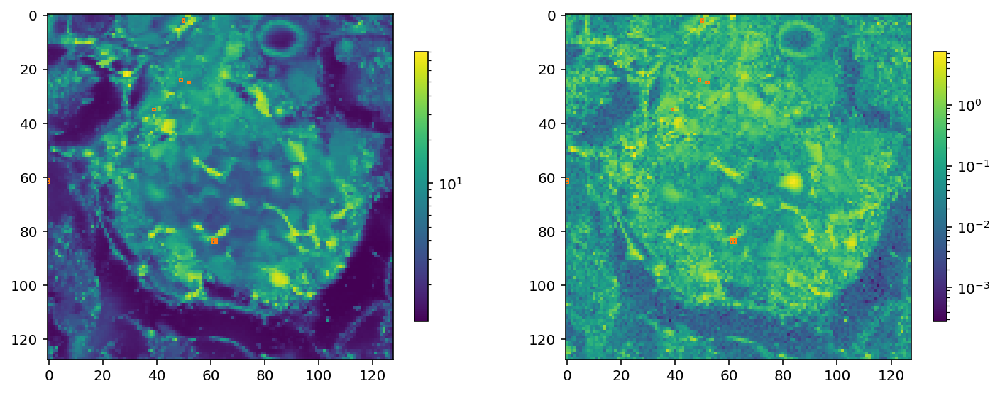

In [996]:
fig, axs = plt.subplots(1,2,figsize=(12,5))
for ax,m in zip(axs,[1+meanImg,stdImg,]):
    im = ax.imshow(m, norm=LogNorm())
    plt.colorbar(im,shrink=.7,ax=ax)
    addRoisToImage(np.array(np.where(stdImg>5)).T,1,ax=ax,label=False)

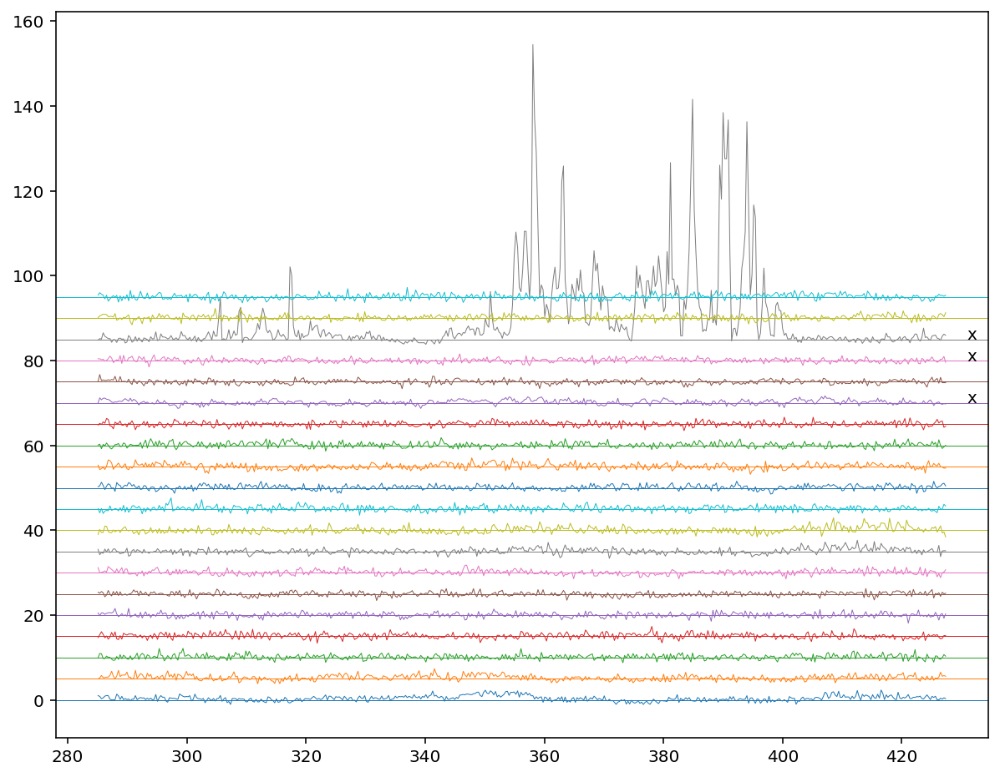

In [1210]:
fig, ax = plt.subplots(1,1,figsize=(10,8), sharex=True)
for roi in range(20):
    yoffset = roi*5
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = snr[:,i,j]
    c = ax.plot(time[ts],x+yoffset,c="C%i"%roi,lw=.5)[0].get_color()
    ax.axhline(yoffset,color=c,lw=.5)
    
    ## autocorr
    tr = np.arange(1,7)
    y, ye = autocorr(x,tr,5)
    ax.text(plt.xlim()[1],yoffset,"  " if np.sum(np.abs(y/ye)>3) == 0 else "x  ",ha="right")

In [1034]:
# # xr = np.linspace(meanImg.min()**.5,meanImg.max()**.5)
# xr = np.linspace(meanImg.min(),meanImg.max())
# plt.plot(meanImg.flatten(),estSd.flatten()**2,"C3o",mfc="none")
# plt.plot(xr,xr/tWin**2)
# plt.yscale("log")
# plt.xscale("log")

### Try PCA and ICA

In [1781]:
@jit
def propose_filter(current, scale):
    dw = scale*np.random.normal(size=len(current))
    new = current+dw
    new = new/np.sum(new**2)**.5
    return new
@jit
def optF(data, fltr):
    return -np.log(np.cosh(data.dot(fltr))).mean()
@jit
def ICAsearch(XT, optF):
    w = np.random.normal(size=len(XT[0]))
    w = w/np.sum(w**2)**.5
    ws = [w]
    fs = [optF(XT,w)]
    rej = 0
    scale = .01
    while True:
        new  = propose_filter(ws[-1], scale)
        fnew = optF(XT,new)
        if fnew>fs[-1]:
            ws += [ new]
            fs += [fnew]
            rej = 0
        else:
            rej += 1
        if rej>1 and rej%1000==0:
            scale = scale/2
        if rej>10000:
            break
    return ws[-1], fs

In [1770]:
def myPCA(data):
    '''
    Input:  2D numpy array where rows are observations
    Output: a tuple Eigenvalues, Eigenvetors
    '''
    from scipy import linalg as la
    C = np.cov(data, rowvar=False)
    vals, vecs = la.eigh(C)
    vals = vals[::-1]
    vecs = vecs.T[::-1]
    datamean = data.mean(axis=0)
    for i in range(len(vals)):
        if datamean.dot(vecs[i])<0:
            vecs[i] = -vecs[i]
    return vals, vecs

In [1782]:
# ICAX = rebin(filteredMovie.reshape((-1,meanImg.size)),1).T
# ICAX.shape
ICAX = X

In [1794]:
%%time
vals, vects = myPCA(ICAX)

CPU times: user 2.19 ms, sys: 1.35 ms, total: 3.55 ms
Wall time: 2.18 ms


In [1784]:
# ws = vects[0] for c in ICAX

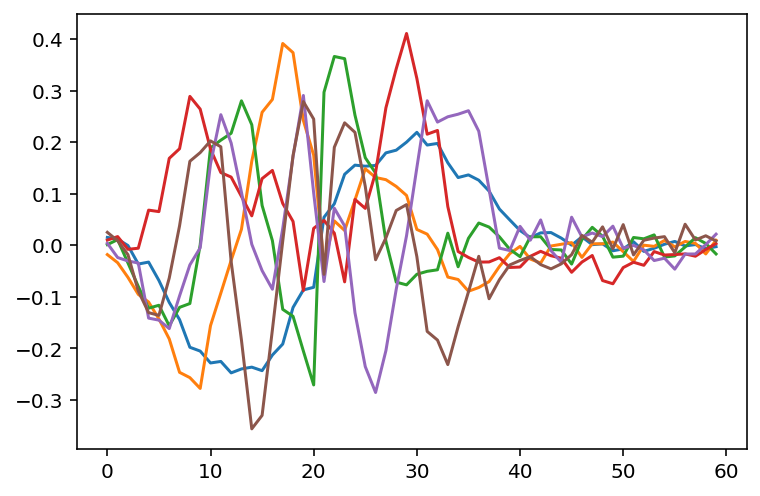

In [1795]:
plt.plot(vects[:6].T)

In [1786]:
%matplotlib inline

In [1796]:
xx = np.array([[x.dot(vects[i]) for x in ICAX] for i in range(1)])

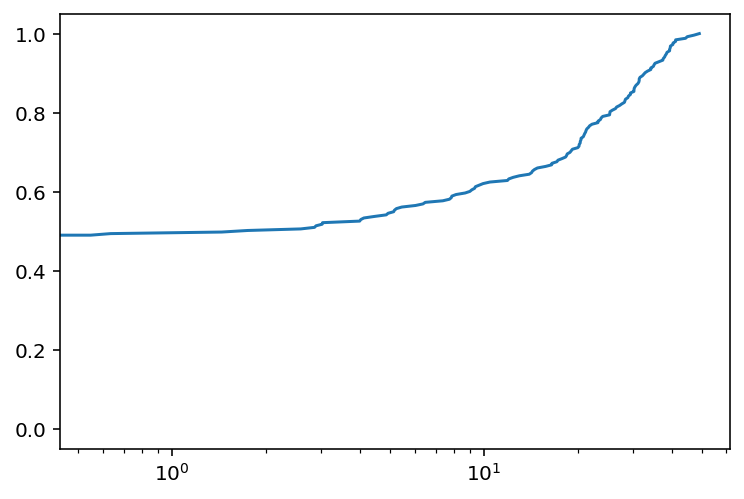

In [1797]:
# plt.hist(xx,100)
for x in xx:
    xxx = x[::1]
    plt.plot(sorted(xxx), np.linspace(0,1,len(xxx)))
plt.xscale("log")

In [1789]:
ws = xx[0]

In [749]:
bleachingMovie = np.array([w*vects[0][:] for w in ws]).T
bleachingMovie = bleachingMovie.reshape((-1,)+meanImg.shape)
bleachingMovie.shape
# .reshape()

(2878, 128, 128)

/Users/srdjan/Documents/Physio_Ca/functions/numeric.py:14: RuntimeWarning: divide by zero encountered in log
  y  = np.log(y-b0)


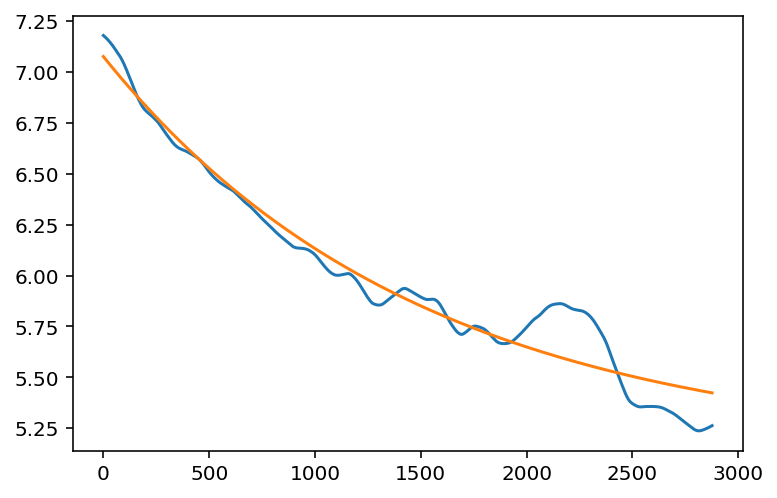

In [751]:
x = bleachingMovie.mean((1,2))
plt.plot(x)
plt.plot(decayfit(x))

In [743]:
detrendedMovie = filteredMovie-movie(.reshape(meanImg.shape))

In [701]:
pd.DataFrame(xx.T).shape

(16384, 5)

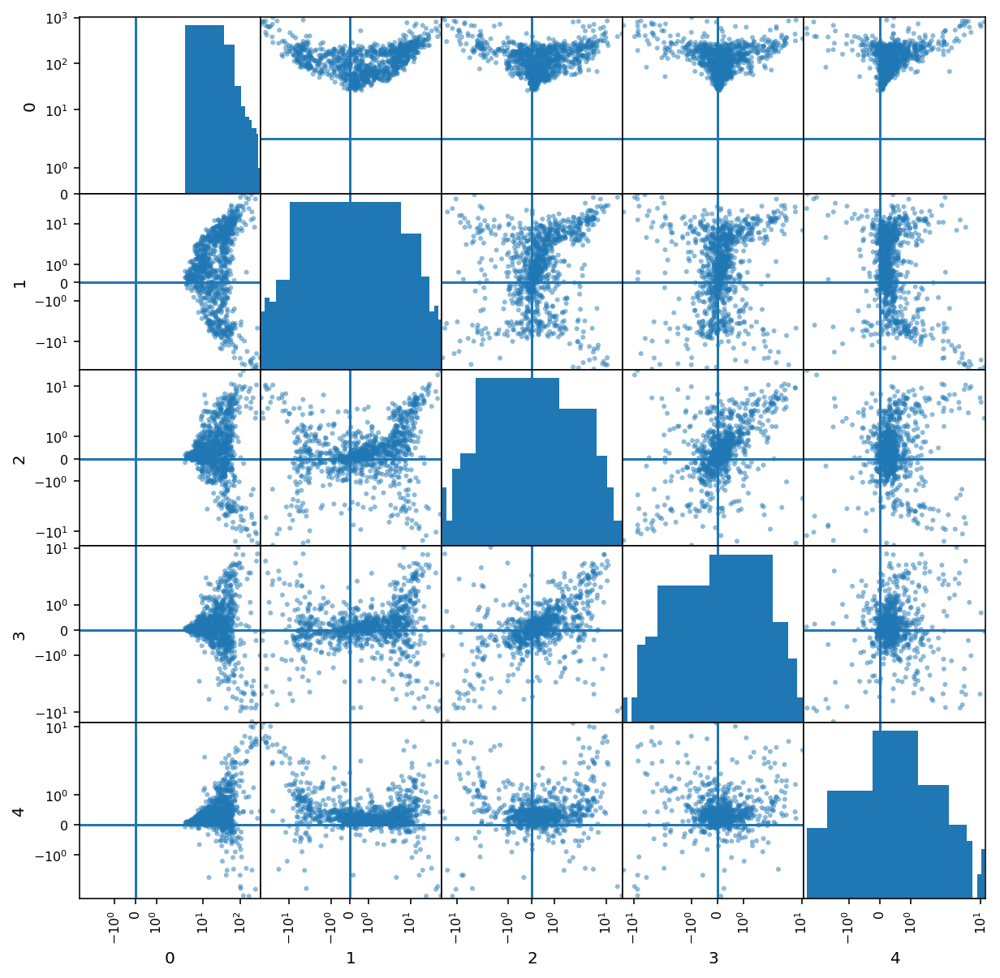

In [709]:
axs = pd.plotting.scatter_matrix(pd.DataFrame(xx[:,:1000].T), figsize=(10,10));
for ax in axs.flat:
    ax.axhline(0)
    ax.axvline(0)
    ax.set_xscale("symlog")
    ax.set_yscale("symlog")

In [698]:
xx.shape

(5, 16384)

In [681]:
xx.shape

(16384,)

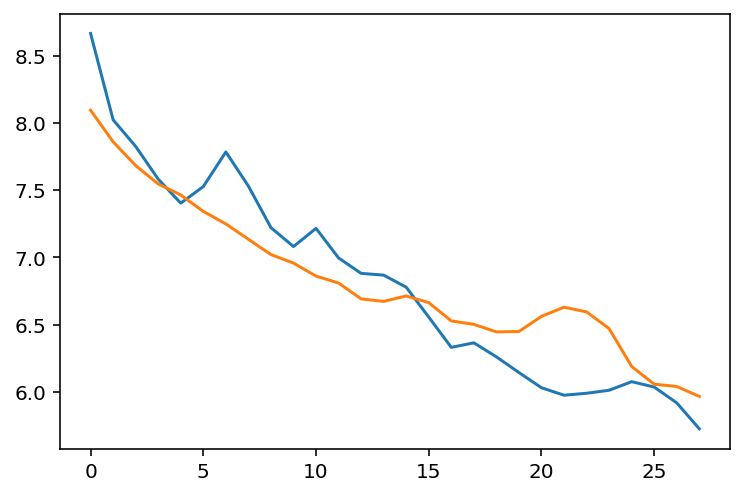

In [653]:
plt.plot(x)
plt.plot(x.dot(vects[0])*vects[0])

<BarContainer object of 28 artists>

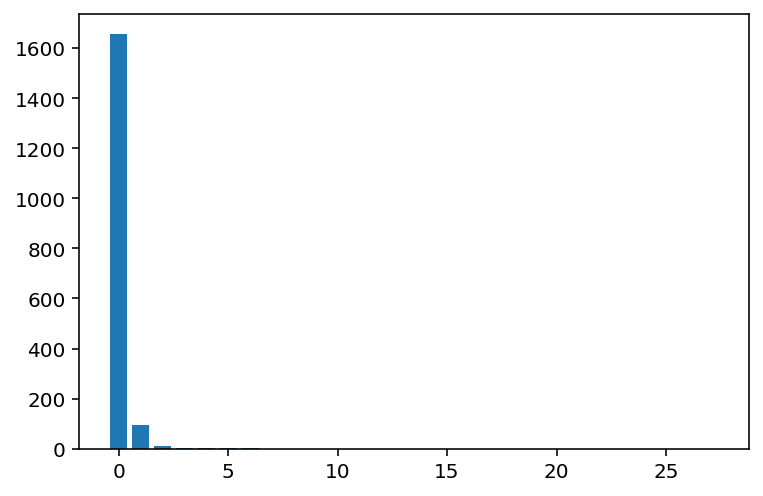

In [641]:
plt.bar(np.arange(len(vals)),vals)

In [1805]:
XT = ICAX.dot(vects.T).dot(np.diag(vals**(-0.5))).dot(vects)
print (XT.shape)
# del vals, vects, XT

(254, 60)


In [1806]:
ICA_Searches = {'filter':[],'convergence':[]}

In [1812]:
# %%capture
for i in range(30):
    w_filter, f = ICAsearch(XT,optF)
    ICA_Searches['filter']      += [w_filter]
    ICA_Searches['convergence'] += [f]

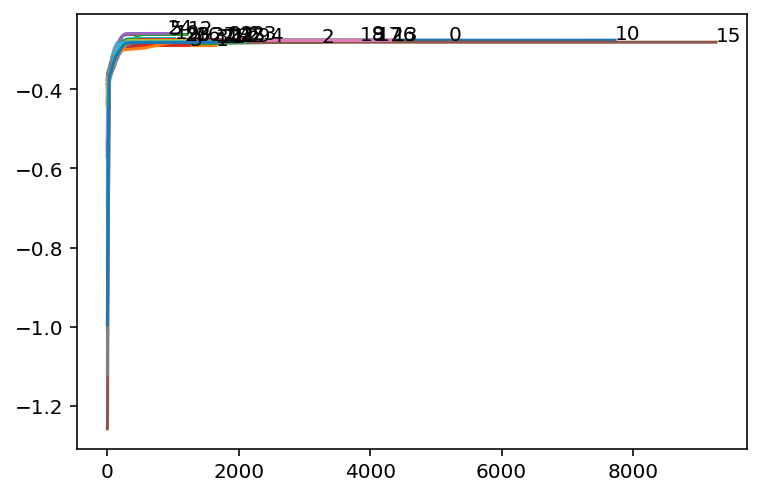

In [1813]:
for j,f in enumerate(ICA_Searches['convergence']):
    plt.plot(f, label=str(j))
    plt.text(len(f)+1,f[-1]+.001,str(j))

In [1814]:
ff = np.array(ICA_Searches['filter'])

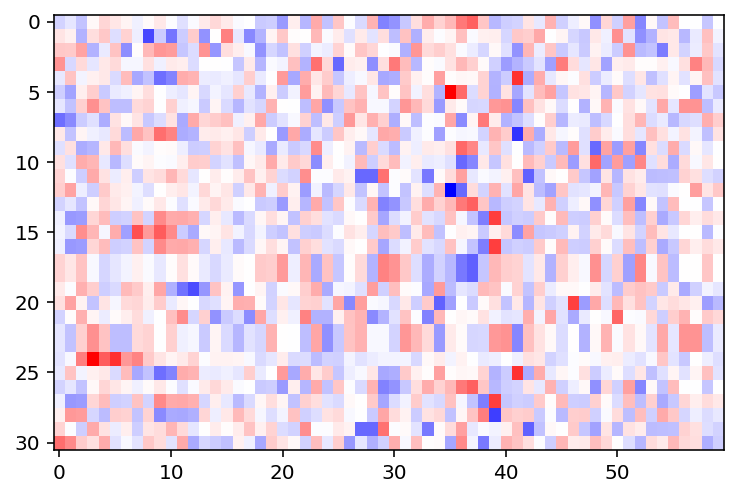

In [1815]:
plt.imshow(ff, cmap="bwr",vmin=-np.abs(ff).max(),vmax=np.abs(ff).max())
plt.gca().set_aspect("auto")

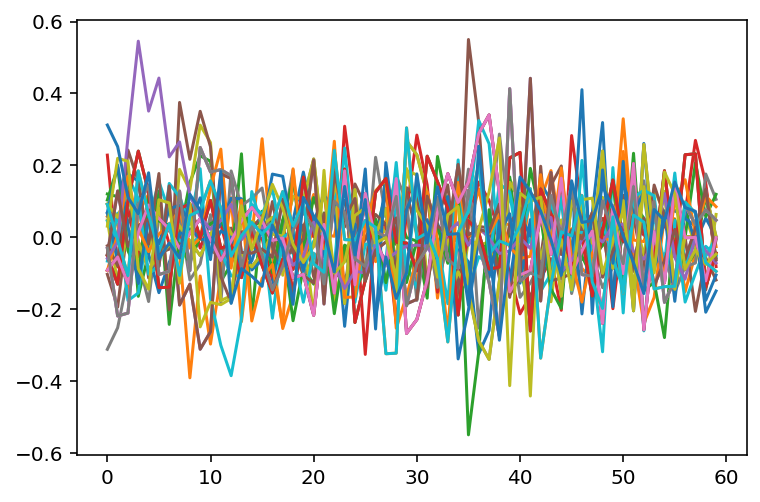

In [1816]:
for x in ff:
    plt.plot(x)